# Exceptional Responder Figure 1
# Date: 10292025
# environment: scimap_2025
# author: Yingxiao Shi(TK)

# 1. Library import

In [3]:
# Import libraries
import sys
import os
import anndata as ad
import pandas as pd
import scanpy as sc
import seaborn as sns; sns.set(color_codes = True)
import matplotlib as mpl
import matplotlib.pyplot as plt

# import the data for the distribution
import numpy as np
from scipy.stats import gaussian_kde

# import scimap
import scimap as sm
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
# look at MPIscore correction
import matplotlib.colors as mcolors

import matplotlib.patheffects as pe

from matplotlib.patheffects import withStroke
from matplotlib.ticker import MultipleLocator, FuncFormatter, MaxNLocator

from scipy.stats import gaussian_kde
from scipy.interpolate import griddata

from shapely.prepared import prep
from shapely.ops import unary_union
from shapely.geometry import Point

import spatialcells as spc
print(spc.__version__)

# set up the graph parameter
mpl.rcParams['figure.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Arial'
plt.rc('font', size=14)
plt.rcParams['pdf.fonttype'] = 42

/opt/anaconda3/envs/scimap_2025/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/scimap_2025/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/scimap_2025/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/scimap_2025/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/envs/scimap_2025/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_mtx f

Running SCIMAP  2.3.5


/opt/anaconda3/envs/scimap_2025/lib/python3.11/site-packages/mpl_scatter_density/__init__.py:4: UserWarning:

pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.

/opt/anaconda3/envs/scimap_2025/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



1.0.1


In [4]:
# imporht the data
# change the working directory
os.chdir("/Users/yshi797/Partners HealthCare Dropbox/Yingxiao Shi/Stable_Lesion_Project_Manuscript_preparation_2024/Processed_data")
# verify the path
print("Current working directory:", os.getcwd())


Current working directory: /Users/yshi797/Partners HealthCare Dropbox/Yingxiao Shi/Stable_Lesion_Project_Manuscript_preparation_2024/Processed_data


In [5]:
BRK6adataPh = ad.read_h5ad("BRK6adataPh_Domain_10292025.h5ad")


In [7]:
len(BRK6adataPh.var_names)

64

In [9]:
# ---------- 1) Convert pixel coords -> microns and store in AnnData.obs ----------
def convert_pixels_to_microns(
    adata,
    um_per_px,
    x_key="X_centroid",
    y_key="Y_centroid",
    out_x="X_um",
    out_y="Y_um",
):
    """
    Adds micron coordinates to .obs using scalar or (x,y) um_per_px.
    """
    # Pull xy from obs as float array
    xy = adata.obs[[x_key, y_key]].to_numpy()
    xy = np.asarray(xy, dtype=float)
    assert xy.ndim == 2 and xy.shape[1] == 2, "xy should be (N, 2) [x,y] in pixels"

    # Handle scalar vs tuple
    if np.isscalar(um_per_px):
        scale = np.array([um_per_px, um_per_px], dtype=float)
    else:
        scale = np.array(um_per_px, dtype=float)
        assert scale.shape == (2,), "um_per_px must be scalar or (2,) for (x_um_per_px, y_um_per_px)"

    xy_um = xy * scale  # elementwise scale

    adata.obs[out_x] = xy_um[:, 0]
    adata.obs[out_y] = xy_um[:, 1]
    return adata

def _fmt_k_um(x, pos):
    # 2000 -> 2K, 25000 -> 25K; keep µm suffix by axis label if desired
    if abs(x) >= 1000:
        return f"{int(x/1000)}K"
    return f"{int(x)}"

In [10]:
BRK6adataPh = convert_pixels_to_microns(BRK6adataPh, um_per_px = 0.5)

In [1]:
BRK6adata.var_names

NameError: name 'BRK6adata' is not defined

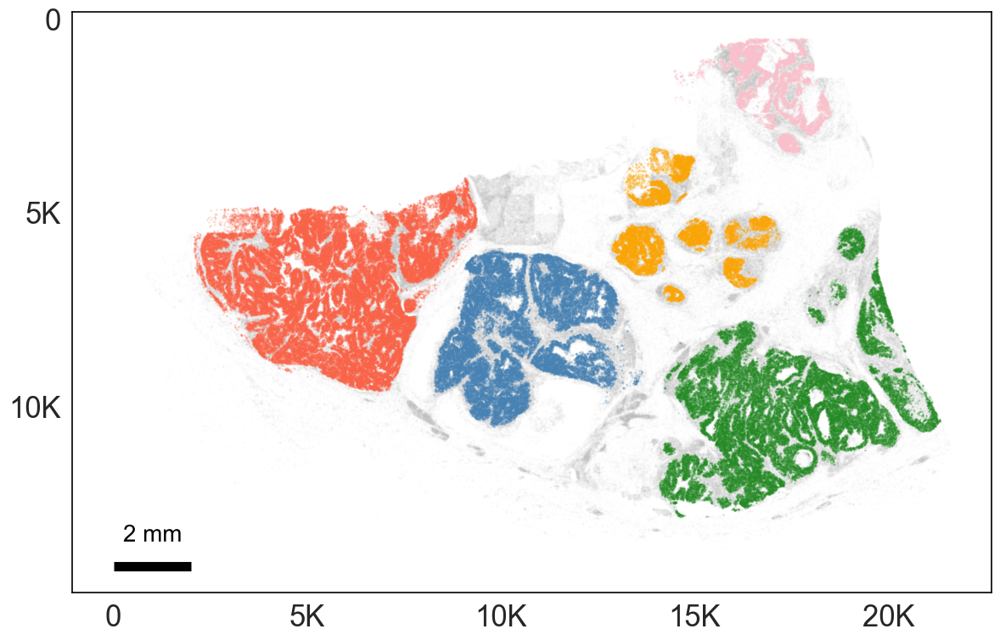

In [11]:
out_png = "BRK6_domains.png"
out_tif = "BRK6_domains.tif"
# --- config ---
bar_len_um = 2000          # 1 mm
pad_x, pad_y = 150, 200    # padding from the edges, in µm
markersize_bg = 0.01
markersize_tumor = 0.2

# domain colors (adjust if needed)
palette = {
    "A": "tomato",
    "B": "steelblue",
    "C": "orange",
    "D": "forestgreen",
    "E": "pink",
}

# filter: SOX10+ and not 'Other'
BRK6adataPh_tumor = BRK6adataPh[
    (BRK6adataPh.obs["SOX10_positive"]) & (BRK6adataPh.obs["Domain_mod"] != "Other"),
].copy()

# --- helpers ---
from matplotlib.ticker import FuncFormatter, MultipleLocator
import matplotlib.patheffects as pe

# --- compute bottom-left coordinates (robust) ---
# ---- place bar at bottom-left with a fixed offset from the LEFT edge ----
def _bottom_with_left_offset(ax, offset_um, pad_y, bar_len_um):
    """
    Draw a horizontal bar 'bar_len_um' placed 'offset_um' to the right of the
    visual LEFT edge, at the visual bottom. Works with axis inversion.
    Returns (x0, x1, y0).
    """
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    xin = ax.xaxis_inverted()
    yin = ax.yaxis_inverted()

    # visual edges in data coords
    x_left  = max(xlim) if xin else min(xlim)
    x_right = min(xlim) if xin else max(xlim)
    y_bottom = max(ylim) if yin else min(ylim)

    # desired visual start = left edge + offset (convert to data coords)
    x0 = x_left - offset_um if xin else x_left + offset_um
    # extend visually to the right
    x1 = x0 - bar_len_um if xin else x0 + bar_len_um

    # --- clamp so the full bar stays inside the axis range ---
    if not xin:
        # ensure x0 >= x_left and x1 <= x_right
        if x1 > x_right:
            x0 = x_right - bar_len_um
            x1 = x_right
        if x0 < x_left:
            x0 = x_left
            x1 = x_left + bar_len_um
    else:
        # inverted: ensure x0 <= x_left and x1 >= x_right
        if x1 < x_right:
            x0 = x_right + bar_len_um
            x1 = x_right
        if x0 > x_left:
            x0 = x_left
            x1 = x_left - bar_len_um

    y0 = y_bottom - pad_y if yin else y_bottom + pad_y
    return x0, x1, y0


# --- plotting code (only this section changes) ---
fig = plt.figure(figsize=(12, 8), facecolor="white")
ax = fig.add_subplot(111, facecolor="white")

ax.scatter(*zip(*BRK6adataPh.obs[["X_um", "Y_um"]].to_numpy()),
           s=markersize_bg, color="grey", alpha=0.1, label="All cells")

for dom in ["A", "B", "C", "D", "E"]:
    sub = BRK6adataPh_tumor.obs.loc[BRK6adataPh_tumor.obs["Domain_mod"] == dom, ["X_um", "Y_um"]]
    if not sub.empty:
        ax.scatter(*zip(*sub.to_numpy()),
                   s=markersize_tumor, color=palette[dom], alpha=0.3, label=dom)

ax.tick_params(axis='x', labelsize=25)
ax.tick_params(axis='y', labelsize=25)
ax.xaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
ax.yaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
ax.xaxis.set_major_locator(MultipleLocator(5000))
ax.yaxis.set_major_locator(MultipleLocator(5000))

ax.set_aspect("equal")
ax.invert_yaxis()     # only Y inverted, X stays normal
# ax.invert_xaxis()   # uncomment if you prefer X inverted

# Box
for side in ("left", "bottom", "right", "top"):
    ax.spines[side].set_visible(True)
    ax.spines[side].set_linewidth(1.2)
    ax.spines[side].set_color("black")

# --- corrected scale bar position ---
x_offset_um = 1000  # <-- move this to change horizontal position from the left edge
x0, x1, y0 = _bottom_with_left_offset(ax, x_offset_um, pad_y, bar_len_um)

ax.hlines(y=y0, xmin=x0, xmax=x1, colors="white", linewidth=10, zorder=10)
ax.hlines(y=y0, xmin=x0, xmax=x1, colors="black", linewidth=8,  zorder=11)
# label 1 mm
x_mid = (x0 + x1) / 2.0
dy = 0.25 * bar_len_um * (-1 if ax.yaxis_inverted() else 1)
txt = ax.text(x_mid, y0 + dy, "2 mm",
              ha="center", va="bottom", fontsize=20, color="black", zorder=12)
txt.set_path_effects([pe.withStroke(linewidth=4, foreground="white")])

plt.tight_layout()

out_png = "Figure1d_BRK6_domains.png"
out_tif = "Figure1d_BRK6_domains.tif"

plt.savefig(out_png, dpi=600, bbox_inches="tight", facecolor="white")
plt.savefig(out_tif, dpi=600, bbox_inches="tight", facecolor="white")

plt.show()

# Figure 3b originally from notebook project_scimap_p143e11_analysis_cleaned_12242024.ipynb

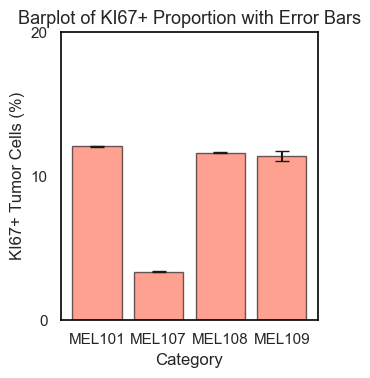

In [12]:
absolute_data = pd.DataFrame({
    'category': ['MEL101', #'PAT5', 
                 'MEL107', 'MEL108', 'MEL109'],
    'False': [354127, #286, 
              747757, 688268, 6828],
    'True': [48612, #156, 
             26090, 90705, 880]
})

# Calculate total counts and proportions
absolute_data['Total'] = absolute_data['False'] + absolute_data['True']
absolute_data['True_Proportion'] = absolute_data['True'] / absolute_data['Total']

# Calculate totals and proportions
absolute_data['Total'] = absolute_data['False'] + absolute_data['True']
absolute_data['True_Proportion'] = absolute_data['True'] / absolute_data['Total']

# Convert to percentages
absolute_data['True_Percent'] = absolute_data['True_Proportion'] * 100

# Calculate SD for binomial proportion, scaled to %
absolute_data['SD_percent'] = np.sqrt(
    (absolute_data['True_Proportion'] * (1 - absolute_data['True_Proportion'])) / absolute_data['Total']
) * 100

yerr = absolute_data['SD_percent']

# --- Plot ---
fig, ax = plt.subplots(figsize=(3.5, 4), facecolor='white')
ax.bar(absolute_data['category'],
       absolute_data['True_Percent'],
       yerr=yerr,
       capsize=5,
       color='tomato',
       edgecolor='black',
       alpha=0.6)

# White background, no grid
ax.set_facecolor('white')
ax.grid(False)

# Add black frame
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1.2)

# Labels and ticks
ax.set_xlabel('Category', fontsize=12)
ax.set_ylabel('KI67+ Tumor Cells (%)', fontsize=12)
ax.set_title('Barplot of KI67+ Proportion with Error Bars', fontsize=13)

# Y limits and tick formatting
ax.set_ylim(0, 20)
ax.set_yticks([0, 10, 20])
ax.set_yticklabels(['0', '10', '20'], fontsize=11)

plt.tight_layout()
plt.savefig('Tumor_Prolif_Proportion_ylim_10292025.pdf', format='pdf', dpi=300)


plt.show()

# Figure 3h regenerate

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from scipy.stats import gaussian_kde
from scipy.interpolate import griddata
import matplotlib.patheffects as pe
import matplotlib as mpl

# ---------------- params (match your domain plots) ----------------
figsize       = (12, 8)
dpi_tif       = 600
cmap          = "RdYlBu_r"
bw_method     = 0.3
grid_size     = 200
clip_top_pct  = 98    # clip extreme highs for nicer scaling
mask_low_pct  = 10    # mask very low-density regions
pt_size       = 8
bg_pt_size    = 0.15

# scale bar like before
bar_len_um  = 2000   # 1 mm
pad_y       = 1000
x_offset_um = 1000
label_font  = 20

out_tif = "BRK6_SOX10_KI67_contour_10292025.tif"    # contour map
out_pdf = "BRK6_SOX10_KI67_densitybar_10292025.pdf" # colorbar only

# ---------------- helpers ----------------


def _draw_scale_bar(ax):
    x0, x1, y0 = _bottom_with_left_offset(ax, x_offset_um, pad_y, bar_len_um)
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="white", linewidth=10, zorder=10)
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="black", linewidth=8,  zorder=11)
    x_mid = (x0 + x1)/2.0
    dy = 0.25*bar_len_um*(-1 if ax.yaxis_inverted() else 1)
    txt = ax.text(x_mid, y0 + dy, "2 mm", ha="center", va="bottom",
                  fontsize=label_font, color="black", zorder=12)
    txt.set_path_effects([pe.withStroke(linewidth=4, foreground="white")])

# ---------------- data ----------------
# full FOV for limits/background
x_bg = BRK6adataPh.obs["X_um"].to_numpy()
y_bg = BRK6adataPh.obs["Y_um"].to_numpy()
xlim = (np.nanmin(x_bg), np.nanmax(x_bg))
ylim = (np.nanmin(y_bg), np.nanmax(y_bg))

# SOX10+ already in BRK6adataPh_tumor; add KI67+
mask = BRK6adataPh_tumor.obs["KI67_positive"].astype(bool)
x = BRK6adataPh_tumor.obs.loc[mask, "X_um"].to_numpy()
y = BRK6adataPh_tumor.obs.loc[mask, "Y_um"].to_numpy()

# KDE (compute once so we can share the same normalization with the detached colorbar)
xy = np.vstack([x, y])
kde_vals = gaussian_kde(xy, bw_method=bw_method)(xy) if len(x) >= 5 else np.array([])
if kde_vals.size:
    # clip high tail
    top_t = np.percentile(kde_vals, clip_top_pct)
    kde_vals = np.minimum(kde_vals, top_t)
    # normalization used by both scatter colors and standalone colorbar
    vmin, vmax = float(np.nanmin(kde_vals)), float(np.nanmax(kde_vals))
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
else:
    norm = mpl.colors.Normalize(vmin=0, vmax=1)

# ---------------- CONTOUR MAP -> TIFF ----------------
fig, ax = plt.subplots(figsize=figsize, facecolor="white")
ax.set_facecolor("white")

# background
ax.scatter(x_bg, y_bg, s=bg_pt_size, color="lightgrey", alpha=0.10, zorder=1)

if kde_vals.size:
    # density-colored scatter
    sc = ax.scatter(x, y, c=kde_vals, s=pt_size, cmap=cmap, norm=norm, alpha=1.0, zorder=2)

    # grid & contours
    gx, gy = np.meshgrid(np.linspace(x.min(), x.max(), grid_size),
                         np.linspace(y.min(), y.max(), grid_size))
    gk = griddata((x, y), kde_vals, (gx, gy), method="cubic")
    low_t = np.percentile(kde_vals, mask_low_pct)
    if gk is not None:
        gk = np.where(gk >= low_t, gk, np.nan)
        if np.isfinite(gk).sum() > 0:
            ax.contour(gx, gy, gk, levels=10, colors="black", linewidths=0.8, zorder=3)
else:
    ax.scatter(x, y, s=pt_size, color="crimson", alpha=0.9, zorder=2)

# axes styling
ax.set_aspect("equal")
ax.set_xlim(xlim); ax.set_ylim(ylim)
ax.invert_yaxis()
ax.tick_params(axis='x', labelsize=25, colors="black")
ax.tick_params(axis='y', labelsize=25, colors="black")
for sp in ax.spines.values():
    sp.set_color("black"); sp.set_linewidth(1.2)
ax.xaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
ax.yaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
#ax.grid(color="grey", linestyle="--", linewidth=0.5, alpha=0.5, zorder=0)

# 1 mm spatial scale bar
_draw_scale_bar(ax)

plt.tight_layout()
plt.savefig(out_tif, format="tif", dpi=dpi_tif, facecolor="white")
plt.close(fig)
print(f"Saved contour map TIFF → {out_tif}")

# ---------------- DENSITY COLORBAR ONLY -> PDF ----------------


Saved contour map TIFF → BRK6_SOX10_KI67_contour_10292025.tif


In [14]:
# Build a standalone colorbar using the same cmap & normalization:
fig_cb = plt.figure(figsize=(1, 8), facecolor="white")  # adjust size as you like
ax_cb = fig_cb.add_axes([0.35, 0.08, 0.25, 0.84])  # [left, bottom, width, height]

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])  # required by older Matplotlibs
cbar = plt.colorbar(sm, cax=ax_cb)
cbar.set_label("Density intensity", fontsize=20, color="black")
cbar.ax.tick_params(labelsize=18, colors="black")

plt.savefig(out_pdf, format="pdf", facecolor="white")
plt.close(fig_cb)
print(f"Saved density colorbar PDF → {out_pdf}")

Saved density colorbar PDF → BRK6_SOX10_KI67_densitybar_10292025.pdf


# Figure 3g regenerate MPI score
  

In [15]:
# read the MPI score data
BRK6mpi = ad.read_h5ad("BRK6adata_domain_tumor_mpiscore.h5ad")
BRK6mpi

AnnData object with n_obs × n_vars = 235965 × 64
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'phenotype', 'SOX10_positive', 'PMEL_positive', 'COI_community', 'Domain', 'Domain_mod', 'CD20_positive', 'CD3E_positive', 'GZMB_positive', 'CD31_b_positive', 'CD11C_positive', 'MX1_positive', 'CD45_positive', 'CD8A_positive', 'CD163_positive', 'CD206_positive', 'CD68_positive', 'FOXP3_positive', 'CD4_redo_positive', 'region_rough', 'hole_0', 'hole_1', 'hole_2', 'hole_3', 'hole_4', 'hole_5', 'hole_6', 'hole_7', 'hole_8', 'hole_9', 'hole_10', 'hole_11', 'hole_12', 'hole_13', 'hole_14', 'hole_15', 'hole_16', 'hole_17', 'hole_18', 'hole_19', 'hole_20', 'hole_21', 'hole_22', 'hole_23', 'hole_24', 'hole_25', 'hole_26', 'hole_27', 'hole_28', 'hole_29', 'hole_30', 'hole_31', 'hole_32', 'hole_33', 'hole_34', 'hole_35', 'hole_36', 'hole_37', 'hole_38', 'hole_39', 'hole_40', 'hole_41', 'hole_4

In [16]:
# ===== choose the AnnData that has optMPIscore =====
adata_score = BRK6mpi if "optMPIscore" in BRK6mpi.obs.columns else BRK6adataPh_tumor

# ensure we have microns
x_bg = BRK6adataPh.obs["X_um"].to_numpy()
y_bg = BRK6adataPh.obs["Y_um"].to_numpy()
xlim = (np.nanmin(x_bg), np.nanmax(x_bg))
ylim = (np.nanmin(y_bg), np.nanmax(y_bg))

# --- compute per-domain proliferative fraction on SOX10+ tumor cells (exclude Domain_mod=="Other") ---
tumor = adata_score.obs.loc[
    (adata_score.obs["SOX10_positive"].astype(bool)) &
    (adata_score.obs["Domain_mod"].astype(str) != "Other"),
    ["Domain_mod", "optMPIscore"]
].copy()

domain_props = {}
for d in ["A", "B", "C", "D", "E"]:
    sub = tumor.loc[tumor["Domain_mod"] == d]
    if len(sub) == 0:
        domain_props[d] = np.nan
    else:
        num = np.sum(sub["optMPIscore"].astype(str) == "proliferative")
        den = len(sub)  # all SOX10+ cells in the domain
        domain_props[d] = num / den

# attach the domain-level score onto BRK6adataPh_tumor (SOX10+ & not Other)
BRK6adataPh_tumor.obs["Domain_Prolif_Prop"] = BRK6adataPh_tumor.obs["Domain_mod"].map(domain_props)

# data to plot (SOX10+ & not Other)
mask_plot = BRK6adataPh_tumor.obs["Domain_mod"].isin(["A","B","C","D","E"])
xy_tumor = BRK6adataPh_tumor.obs.loc[mask_plot, ["X_um","Y_um"]].to_numpy()
vals     = BRK6adataPh_tumor.obs.loc[mask_plot, "Domain_Prolif_Prop"].to_numpy()

# --- plotting params ---
figsize = (12, 8)
cmap    = mpl.cm.Reds
vmin, vmax = 0.0, 0.5            # clamp color range (adjust if you prefer)
dpi_tif = 600
out_tif = "BRK6_MPI_Proliferation_Scatter.tif"

# scale bar settings
bar_len_um  = 2000     # 1 mm
pad_y       = 1000
x_offset_um = 1000
label_font  = 20

# --- plot ---
fig, ax = plt.subplots(figsize=figsize, facecolor="white")
ax.set_facecolor("white")

# background (all cells)
ax.scatter(x_bg, y_bg, s=0.15, color="lightgrey", alpha=0.10, zorder=1)

# tumor cells colored by their domain's proliferative fraction
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
sc = ax.scatter(xy_tumor[:,0], xy_tumor[:,1],
                c=vals, cmap=cmap, norm=norm,
                s=0.10, alpha=0.9, zorder=2)

# axes cosmetics
ax.set_aspect("equal")
ax.set_xlim(xlim); ax.set_ylim(ylim)
ax.invert_yaxis()
ax.tick_params(axis='x', labelsize=25, colors="black")
ax.tick_params(axis='y', labelsize=25, colors="black")
for sp in ax.spines.values():
    sp.set_color("black"); sp.set_linewidth(1.2)
ax.xaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
ax.yaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
#ax.grid(color="grey", linestyle="--", linewidth=0.5, alpha=0.5, zorder=0)

# colorbar (optional on-figure; comment out if you export it separately)
#cbar = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
#cbar.set_label("Domain-level Proliferative Fraction", fontsize=18)
#cbar.ax.tick_params(labelsize=16)

# scale bar
_draw_scale_bar(ax)

plt.tight_layout()
plt.savefig(out_tif, format="tif", dpi=dpi_tif, facecolor="white")
plt.show()
print("Saved:", out_tif)



KeyboardInterrupt: 

In [ ]:
# If you also want the colorbar alone as a separate, Illustrator-friendly PDF:
fig_cb = plt.figure(figsize=(1, 8), facecolor="white")
ax_cb  = fig_cb.add_axes([0.35, 0.08, 0.25, 0.84])
sm     = mpl.cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
cbar2  = plt.colorbar(sm, cax=ax_cb)
cbar2.set_label("Domain-level Proliferative Fraction", fontsize=18, color="black")
cbar2.ax.tick_params(labelsize=16, colors="black")
plt.savefig("BRK6_Domain_Proliferation_colorbar.pdf", format="pdf", facecolor="white")
plt.close(fig_cb)
print("Saved: Domain_Proliferation_colorbar.pdf")

Saved: Domain_Proliferation_colorbar.pdf


# Figure 4 e-k regenerated from ipi_stable_project_scimap_p143e12_analysis_cleaned_07292025.ipynb

In [ ]:
CD8 = ad.read_h5ad("p143e12_CD8_phenotype_10292025.h5ad")
CD8

AnnData object with n_obs × n_vars = 60082 × 41
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'SOX10_positive', 'MART1_positive', 'CD3E_positive', 'CD8A_positive', 'CD45RO_positive', 'CXCL13_positive', 'CD25_positive', 'LEF1_positive', 'KI67_positive', 'GZMB_1_positive', 'CD103_positive', 'TIM3_positive', 'LAG3_positive', 'PD1_positive', 'TIGIT_positive', 'CD45RA_positive', 'CD11C_positive', 'Domain_ROI', 'removed_ROI', 'Domain_mod', 'CD8_T_cell_phenotype'
    uns: 'all_markers', 'dendrogram_CD8_T_cell_phenotype', 'gates'
    layers: 'log'

In [ ]:
import re

# ---- helpers for filenames ----
def _safe_name(s: str) -> str:
    s = re.sub(r"\s+", "_", s.strip())
    s = re.sub(r"[^A-Za-z0-9_\-+]", "", s)
    return s


def _draw_scale_bar(ax, x_offset_um=1000, pad_y=1000, bar_len_um=2000, label="2 mm", label_font=20):
    x0, x1, y0 = _bottom_with_left_offset(ax, x_offset_um, pad_y, bar_len_um)
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="white", linewidth=10, zorder=10)
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="black", linewidth=8,  zorder=11)
    x_mid = (x0 + x1)/2.0
    dy = 0.25*bar_len_um * (-1 if ax.yaxis_inverted() else 1)
    txt = ax.text(x_mid, y0 + dy, label, ha="center", va="bottom",
                  fontsize=label_font, color="black", zorder=12)
    txt.set_path_effects([pe.withStroke(linewidth=4, foreground="white")])

In [ ]:
# Main: per-phenotype contour saver (TIFF map + PDF colorbar)
# -----------------------------
def save_cd8_contours(
    adata,
    phenotype_col="CD8_T_cell_phenotype",
    phenotypes=None,
    background_adata=None,
    outdir="cd8_contours",
    # rendering
    dpi_tif=600,
    bw_method=0.3,
    grid_size=200,
    clip_top_pct=98,
    mask_bottom_pct=10,
    point_size=8,
    bg_point_size=0.15,
    cmap="RdYlBu_r",
    invert_x=False,
    invert_y=True,
    min_points_for_kde=50,
    title_prefix="",
    # units & scale bar
    um_per_px=0.5,            # scalar or (x_um_per_px, y_um_per_px)
    bar_len_um=2000,          # 1 mm
    x_offset_um=1000,         # 5k µm from left edge
    pad_y=1000,               # 1k µm above bottom
    # style
    tick_labelsize=25,
    figsize=(13, 8),
    verbose=True
):
    os.makedirs(outdir, exist_ok=True)

    # ensure microns on fg + bg
    if ("X_um" not in adata.obs) or ("Y_um" not in adata.obs):
        convert_pixels_to_microns(adata, um_per_px)
    bg = background_adata if background_adata is not None else adata
    if ("X_um" not in bg.obs) or ("Y_um" not in bg.obs):
        convert_pixels_to_microns(bg, um_per_px)

    # background / global limits
    x_bg = bg.obs["X_um"].to_numpy()
    y_bg = bg.obs["Y_um"].to_numpy()
    x_min, x_max = np.nanmin(x_bg), np.nanmax(x_bg)
    y_min, y_max = np.nanmin(y_bg), np.nanmax(y_bg)

    # phenotype list
    if phenotypes is None:
        phenotypes = sorted([p for p in adata.obs[phenotype_col].astype(str).unique() if p != "nan"])

    for ph in phenotypes:
        sel = adata.obs[phenotype_col] == ph
        x = adata.obs.loc[sel, "X_um"].to_numpy()
        y = adata.obs.loc[sel, "Y_um"].to_numpy()

        base = f"CD8_{_safe_name(ph)}_KDE_contour"
        tif_path = os.path.join(outdir, base + ".tif")
        pdf_cbar = os.path.join(outdir, base + "_colorbar.pdf")

        # ---- compute KDE once (so we can reuse normalization for separate colorbar) ----
        if len(x) >= min_points_for_kde:
            xy = np.vstack([x, y])
            kde_vals = gaussian_kde(xy, bw_method=bw_method)(xy)

            top_t = np.percentile(kde_vals, clip_top_pct)
            kde_vals = np.minimum(kde_vals, top_t)

            vmin, vmax = float(np.nanmin(kde_vals)), float(np.nanmax(kde_vals))
            norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

            # grid for contours
            grid_x, grid_y = np.meshgrid(
                np.linspace(x.min(), x.max(), grid_size),
                np.linspace(y.min(), y.max(), grid_size)
            )
            grid_kde = griddata((x, y), kde_vals, (grid_x, grid_y), method="cubic")
            low_t = np.percentile(kde_vals, mask_bottom_pct)
            if grid_kde is not None:
                grid_kde = np.where(grid_kde >= low_t, grid_kde, np.nan)
        else:
            kde_vals = np.array([])
            norm = mpl.colors.Normalize(vmin=0, vmax=1)
            grid_kde = None

        # ---- figure: contour map -> TIFF ----
        fig, ax = plt.subplots(figsize=figsize, facecolor="white")
        ax.set_facecolor("white")

        # background scatter
        ax.scatter(x_bg, y_bg, s=bg_point_size, color="lightgrey", alpha=0.10, zorder=1)

        if kde_vals.size:
            sc = ax.scatter(x, y, c=kde_vals, s=point_size, cmap=cmap, norm=norm,
                            alpha=1.0, zorder=2, label=ph)
            if (grid_kde is not None) and (np.isfinite(grid_kde).sum() > 0):
                ax.contour(grid_x, grid_y, grid_kde, levels=10, colors="black", linewidths=0.8, zorder=3)
        else:
            ax.scatter(x, y, s=point_size, color="crimson", alpha=0.9, zorder=2, label=ph)

        # axes
        ax.set_aspect("equal")
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        if invert_x: ax.invert_xaxis()
        if invert_y: ax.invert_yaxis()
        ax.tick_params(axis='x', labelsize=tick_labelsize, colors="black")
        ax.tick_params(axis='y', labelsize=tick_labelsize, colors="black")
        for sp in ax.spines.values():
            sp.set_color("black"); sp.set_linewidth(1.2)
        ax.xaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
        ax.yaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
        
        ax.xaxis.set_major_locator(MultipleLocator(5000))
        ax.yaxis.set_major_locator(MultipleLocator(5000))
        
        ax.tick_params(axis='x', labelsize=25, colors="black")
        ax.tick_params(axis='y', labelsize=25, colors="black")

        
        #ax.grid(color="grey", linestyle="--", linewidth=0.5, alpha=0.5, zorder=0)

        # scale bar
        _draw_scale_bar(ax, x_offset_um=x_offset_um, pad_y=pad_y, bar_len_um=bar_len_um, label="2 mm", label_font=20)

        # save TIFF
        plt.tight_layout()
        plt.savefig(tif_path, format="tif", dpi=dpi_tif, facecolor="white")
        plt.close(fig)
        if verbose: print(f"Saved contour TIFF: {tif_path}")

        # ---- separate colorbar -> PDF (vector, Illustrator-friendly) ----
        if kde_vals.size:
            fig_cb = plt.figure(figsize=(1, 8), facecolor="white")
            ax_cb  = fig_cb.add_axes([0.35, 0.08, 0.25, 0.84])
            sm     = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
            sm.set_array([])
            cbar = plt.colorbar(sm, cax=ax_cb)
            cbar.set_label("Density intensity", fontsize=20, color="black")
            cbar.ax.tick_params(labelsize=18, colors="black")
            plt.savefig(pdf_cbar, format="pdf", facecolor="white")
            plt.close(fig_cb)
            if verbose: print(f"Saved colorbar PDF: {pdf_cbar}")

In [ ]:
LSP14343_roi = ad.read_h5ad("p143e12_LSP14343_roi_10292025.h5ad")
LSP14343_roi

AnnData object with n_obs × n_vars = 729126 × 41
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'SOX10_positive', 'MART1_positive', 'CD3E_positive', 'CD8A_positive', 'CD45RO_positive', 'CXCL13_positive', 'CD25_positive', 'LEF1_positive', 'KI67_positive', 'GZMB_1_positive', 'CD103_positive', 'TIM3_positive', 'LAG3_positive', 'PD1_positive', 'TIGIT_positive', 'CD45RA_positive', 'CD11C_positive', 'Domain_ROI', 'removed_ROI', 'Domain_mod'
    uns: 'all_markers', 'gates'
    layers: 'log'

In [ ]:
save_cd8_contours(
    adata=CD8,                                  # your AnnData with phenotype column
    phenotype_col="CD8_T_cell_phenotype",
    phenotypes=[
        "Naive (CD45RA+ LEF1+)",
        "Memory (CD45RO+)",
        "Resident Memory TRM (CD45RO+ CD103+)",
        "Cytotoxic (GZMB+ KI67-)",
        "Cytotoxic Proliferative (GZMB+ KI67+)",
        "Partially Exhausted (PD1+ LAG3+ TIM3-)",
        "Terminally Exhausted (PD1+ LAG3+ TIM3+)",
        "Other CD8 T cells",
    ],
    background_adata=LSP14343_roi,             # or None
    outdir="cd8_contours_micron",
    um_per_px=0.5,                              # or (x_um, y_um)
    invert_x=True, invert_y=False,              # match your figure orientation
    x_offset_um=1000, 
    pad_y=1000, 
    bar_len_um=2000
)

Saved contour TIFF: cd8_contours_micron/CD8_Naive_CD45RA+_LEF1+_KDE_contour.tif
Saved colorbar PDF: cd8_contours_micron/CD8_Naive_CD45RA+_LEF1+_KDE_contour_colorbar.pdf
Saved contour TIFF: cd8_contours_micron/CD8_Memory_CD45RO+_KDE_contour.tif
Saved colorbar PDF: cd8_contours_micron/CD8_Memory_CD45RO+_KDE_contour_colorbar.pdf
Saved contour TIFF: cd8_contours_micron/CD8_Resident_Memory_TRM_CD45RO+_CD103+_KDE_contour.tif
Saved colorbar PDF: cd8_contours_micron/CD8_Resident_Memory_TRM_CD45RO+_CD103+_KDE_contour_colorbar.pdf
Saved contour TIFF: cd8_contours_micron/CD8_Cytotoxic_GZMB+_KI67-_KDE_contour.tif
Saved colorbar PDF: cd8_contours_micron/CD8_Cytotoxic_GZMB+_KI67-_KDE_contour_colorbar.pdf
Saved contour TIFF: cd8_contours_micron/CD8_Cytotoxic_Proliferative_GZMB+_KI67+_KDE_contour.tif
Saved colorbar PDF: cd8_contours_micron/CD8_Cytotoxic_Proliferative_GZMB+_KI67+_KDE_contour_colorbar.pdf
Saved contour TIFF: cd8_contours_micron/CD8_Partially_Exhausted_PD1+_LAG3+_TIM3-_KDE_contour.tif
Sa

In [ ]:
# 1) Start from the existing categorical
col = "CD8_T_cell_phenotype"

# 2) Make a new column as a copy (still categorical)
CD8.obs["combined_phenotype"] = CD8.obs[col]

# 3) Add the new category, then assign
new_cat = "Partially_Terminally_Exhausted_CD8"
CD8.obs["combined_phenotype"] = CD8.obs["combined_phenotype"].cat.add_categories([new_cat])

to_merge = [
    "Partially Exhausted (PD1+ LAG3+ TIM3-)",
    "Terminally Exhausted (PD1+ LAG3+ TIM3+)",
]
mask = CD8.obs[col].isin(to_merge)
CD8.obs.loc[mask, "combined_phenotype"] = new_cat

# (optional) drop unused categories afterwards
CD8.obs["combined_phenotype"] = CD8.obs["combined_phenotype"].cat.remove_unused_categories()

CD8.obs["combined_phenotype"].value_counts()

combined_phenotype
Cytotoxic (GZMB+ KI67-)                  20809
Memory (CD45RO+)                         19736
Other CD8 T cells                         7903
Partially_Terminally_Exhausted_CD8        7413
Resident Memory TRM (CD45RO+ CD103+)      3428
Cytotoxic Proliferative (GZMB+ KI67+)      722
Naive (CD45RA+ LEF1+)                       71
Name: count, dtype: int64

In [ ]:
save_cd8_contours(
    adata=CD8,                                  # your AnnData with phenotype column
    phenotype_col="combined_phenotype",
    phenotypes=["Partially_Terminally_Exhausted_CD8"],
    background_adata=LSP14343_roi,             # or None
    outdir="cd8_contours_micron",
    um_per_px=0.5,                              # or (x_um, y_um)
    invert_x=True, invert_y=False,              # match your figure orientation
    x_offset_um=1000, 
    pad_y=1000, 
    bar_len_um=2000
)

Saved contour TIFF: cd8_contours_micron/CD8_Partially_Terminally_Exhausted_CD8_KDE_contour.tif
Saved colorbar PDF: cd8_contours_micron/CD8_Partially_Terminally_Exhausted_CD8_KDE_contour_colorbar.pdf


# Figure 4 h-k coming from project2_LSP14341_scimap_08112025.ipynb data 

In [ ]:
LSP14341_Ph = ad.read_h5ad("LSP14341_Ph_processed_09232025.h5ad")
LSP14341_Ph

AnnData object with n_obs × n_vars = 654046 × 78
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'phenotype', 'Domain', 'GeoMX_ROI', 'SOX10_2_positive', 'MART1_positive', 'CD8a_positive', 'CD3E_positive', 'CD206_positive', 'CD163_positive', 'GZMB_positive', 'CD11c_positive', 'CD4_positive', 'FOXP3_positive', 'CD68_positive', 'Ki67_positive', 'TIM3_positive', 'PD1_positive', 'PDL1_positive', 'S100B_positive', 'S100a1_positive', 'phenotype_V2'
    uns: 'all_markers', 'gates'
    layers: 'log'

In [ ]:
domain_adata = LSP14341_Ph[LSP14341_Ph.obs.Domain != "Other"]
domain_adata

View of AnnData object with n_obs × n_vars = 572284 × 78
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'phenotype', 'Domain', 'GeoMX_ROI', 'SOX10_2_positive', 'MART1_positive', 'CD8a_positive', 'CD3E_positive', 'CD206_positive', 'CD163_positive', 'GZMB_positive', 'CD11c_positive', 'CD4_positive', 'FOXP3_positive', 'CD68_positive', 'Ki67_positive', 'TIM3_positive', 'PD1_positive', 'PDL1_positive', 'S100B_positive', 'S100a1_positive', 'phenotype_V2'
    uns: 'all_markers', 'gates'
    layers: 'log'

In [ ]:
tmp = domain_adata[
    (domain_adata.obs["CD68_positive"]) &
    (domain_adata.obs["SOX10_2_positive"] == False)
]
print(tmp)
# add a new column for phenotype
col_new = "custom_phenotype"
domain_adata.obs[col_new] = "Other"

# mark the tmp cells
domain_adata.obs.loc[tmp.obs_names, col_new] = "CD68+ SOX10-"

save_cd8_contours(
    adata=domain_adata,
    phenotype_col=col_new,
    phenotypes=["CD68+ SOX10-"],      # only this group
    background_adata= LSP14341_Ph,    # or whatever global background you want
    bg_point_size = 0.01,
    um_per_px=0.5,                              # or (x_um, y_um)
    x_offset_um=1000, 
    pad_y=1000, 
    bar_len_um=2000,
    outdir="immune_contour_plots",
    invert_x = True,
    invert_y=False
)

tmp = domain_adata[(domain_adata.obs["CD163_positive"]) | (domain_adata.obs["CD206_positive"])]
print(tmp)

col_new = "custom_phenotype"
domain_adata.obs[col_new] = "Other"

# mark the tmp cells
domain_adata.obs.loc[tmp.obs_names, col_new] = "CD163+ CD206+"

save_cd8_contours(
    adata=domain_adata,
    phenotype_col=col_new,
    phenotypes=["CD163+ CD206+"],      # only this group
    background_adata= LSP14341_Ph,    # or whatever global background you want
    bg_point_size = 0.01,
    um_per_px=0.5,                              # or (x_um, y_um)
    x_offset_um=1000, 
    pad_y=1000, 
    bar_len_um=2000,
    outdir="immune_contour_plots",
    invert_x = True,
    invert_y=False
)

View of AnnData object with n_obs × n_vars = 29732 × 78
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'phenotype', 'Domain', 'GeoMX_ROI', 'SOX10_2_positive', 'MART1_positive', 'CD8a_positive', 'CD3E_positive', 'CD206_positive', 'CD163_positive', 'GZMB_positive', 'CD11c_positive', 'CD4_positive', 'FOXP3_positive', 'CD68_positive', 'Ki67_positive', 'TIM3_positive', 'PD1_positive', 'PDL1_positive', 'S100B_positive', 'S100a1_positive', 'phenotype_V2', 'custom_phenotype', 'X_um', 'Y_um'
    uns: 'all_markers', 'gates'
    layers: 'log'


Saved contour TIFF: immune_contour_plots/CD8_CD68+_SOX10-_KDE_contour.tif
Saved colorbar PDF: immune_contour_plots/CD8_CD68+_SOX10-_KDE_contour_colorbar.pdf
View of AnnData object with n_obs × n_vars = 73930 × 78
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'phenotype', 'Domain', 'GeoMX_ROI', 'SOX10_2_positive', 'MART1_positive', 'CD8a_positive', 'CD3E_positive', 'CD206_positive', 'CD163_positive', 'GZMB_positive', 'CD11c_positive', 'CD4_positive', 'FOXP3_positive', 'CD68_positive', 'Ki67_positive', 'TIM3_positive', 'PD1_positive', 'PDL1_positive', 'S100B_positive', 'S100a1_positive', 'phenotype_V2', 'custom_phenotype', 'X_um', 'Y_um'
    uns: 'all_markers', 'gates'
    layers: 'log'
Saved contour TIFF: immune_contour_plots/CD8_CD163+_CD206+_KDE_contour.tif
Saved colorbar PDF: immune_contour_plots/CD8_CD163+_CD206+_KDE_contour_colorbar.pdf


In [ ]:
tmp = domain_adata[(domain_adata.obs["CD3E_positive"]) & (domain_adata.obs["CD4_positive"]) & (domain_adata.obs["FOXP3_positive"])]
print(tmp)

col_new = "custom_phenotype"
domain_adata.obs[col_new] = "Other"

# mark the tmp cells
domain_adata.obs.loc[tmp.obs_names, col_new] = "Treg"

save_cd8_contours(
    adata=domain_adata,
    phenotype_col=col_new,
    phenotypes=["Treg"],      # only this group
    background_adata= LSP14341_Ph,    # or whatever global background you want
    bg_point_size = 0.01,
    um_per_px=0.5,                              # or (x_um, y_um)
    x_offset_um=1000, 
    pad_y=1000, 
    bar_len_um=2000,    
    outdir="immune_contour_plots",
    invert_x = True,
    invert_y=False
)

View of AnnData object with n_obs × n_vars = 5720 × 78
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'phenotype', 'Domain', 'GeoMX_ROI', 'SOX10_2_positive', 'MART1_positive', 'CD8a_positive', 'CD3E_positive', 'CD206_positive', 'CD163_positive', 'GZMB_positive', 'CD11c_positive', 'CD4_positive', 'FOXP3_positive', 'CD68_positive', 'Ki67_positive', 'TIM3_positive', 'PD1_positive', 'PDL1_positive', 'S100B_positive', 'S100a1_positive', 'phenotype_V2', 'custom_phenotype', 'X_um', 'Y_um'
    uns: 'all_markers', 'gates'
    layers: 'log'
Saved contour TIFF: immune_contour_plots/CD8_Treg_KDE_contour.tif
Saved colorbar PDF: immune_contour_plots/CD8_Treg_KDE_contour_colorbar.pdf


In [ ]:
# mark the tmp cells
tmp = domain_adata[domain_adata.obs["CD11c_positive"]]
print(tmp)


col_new = "custom_phenotype"
domain_adata.obs[col_new] = "Other"

domain_adata.obs.loc[tmp.obs_names, col_new] = "CD11C+"

save_cd8_contours(
    adata=domain_adata,
    phenotype_col=col_new,
    phenotypes=["CD11C+"],      # only this group    # or whatever global background you want
    outdir="immune_contour_plots",
    background_adata= LSP14341_Ph,    # or whatever global background you want
    bg_point_size = 0.01,
    um_per_px=0.5,                              # or (x_um, y_um)
    x_offset_um=1000, 
    pad_y=1000, 
    bar_len_um=2000,
    invert_x = True,
    invert_y=False
)


View of AnnData object with n_obs × n_vars = 183621 × 78
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'phenotype', 'Domain', 'GeoMX_ROI', 'SOX10_2_positive', 'MART1_positive', 'CD8a_positive', 'CD3E_positive', 'CD206_positive', 'CD163_positive', 'GZMB_positive', 'CD11c_positive', 'CD4_positive', 'FOXP3_positive', 'CD68_positive', 'Ki67_positive', 'TIM3_positive', 'PD1_positive', 'PDL1_positive', 'S100B_positive', 'S100a1_positive', 'phenotype_V2', 'custom_phenotype', 'X_um', 'Y_um'
    uns: 'all_markers', 'gates'
    layers: 'log'
Saved contour TIFF: immune_contour_plots/CD8_CD11C+_KDE_contour.tif
Saved colorbar PDF: immune_contour_plots/CD8_CD11C+_KDE_contour_colorbar.pdf


# Figure 7 contour plot

In [ ]:
LSP16767 = ad.read_h5ad("LSP16767_10232025.h5ad")
LSP16767



AnnData object with n_obs × n_vars = 40670 × 13
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'SOX10_positive', 'CD8A_positive', 'CD20_positive', 'CD11C_positive', 'CD3E_positive', 'CD45_positive', 'CD4_positive', 'FOXP3_positive', 'KI67_positive', 'CD31_positive'
    uns: 'all_markers', 'gates'
    layers: 'log'

In [ ]:
def save_cd8_contours(
    adata,
    phenotype_col="CD8_T_cell_phenotype",
    phenotypes=None,
    background_adata=None,
    outdir="cd8_contours",
    # rendering
    dpi_tif=600,
    bw_method=0.3,
    grid_size=200,
    clip_top_pct=98,
    mask_bottom_pct=10,
    point_size=8,
    bg_point_size=0.15,
    cmap="RdYlBu_r",
    invert_x=False,
    invert_y=True,
    min_points_for_kde=50,
    title_prefix="",
    # units & scale bar
    um_per_px=0.5,            # scalar or (x_um_per_px, y_um_per_px)
    bar_len_um=2000,          # 1 mm
    x_offset_um=1000,         # 5k µm from left edge
    pad_y=1000,               # 1k µm above bottom
    # style
    tick_labelsize=25,
    figsize=(13, 8),
    verbose=True
):
    os.makedirs(outdir, exist_ok=True)

    # ensure microns on fg + bg
    if ("X_um" not in adata.obs) or ("Y_um" not in adata.obs):
        convert_pixels_to_microns(adata, um_per_px)
    bg = background_adata if background_adata is not None else adata
    if ("X_um" not in bg.obs) or ("Y_um" not in bg.obs):
        convert_pixels_to_microns(bg, um_per_px)

    # background / global limits
    x_bg = bg.obs["X_um"].to_numpy()
    y_bg = bg.obs["Y_um"].to_numpy()
    x_min, x_max = np.nanmin(x_bg), np.nanmax(x_bg)
    y_min, y_max = np.nanmin(y_bg), np.nanmax(y_bg)

    # phenotype list
    if phenotypes is None:
        phenotypes = sorted([p for p in adata.obs[phenotype_col].astype(str).unique() if p != "nan"])

    for ph in phenotypes:
        sel = adata.obs[phenotype_col] == ph
        x = adata.obs.loc[sel, "X_um"].to_numpy()
        y = adata.obs.loc[sel, "Y_um"].to_numpy()

        base = f"CD8_{_safe_name(ph)}_KDE_contour"
        tif_path = os.path.join(outdir, base + ".tif")
        pdf_cbar = os.path.join(outdir, base + "_colorbar.pdf")

        # ---- compute KDE once (so we can reuse normalization for separate colorbar) ----
        if len(x) >= min_points_for_kde:
            xy = np.vstack([x, y])
            kde_vals = gaussian_kde(xy, bw_method=bw_method)(xy)

            top_t = np.percentile(kde_vals, clip_top_pct)
            kde_vals = np.minimum(kde_vals, top_t)

            vmin, vmax = float(np.nanmin(kde_vals)), float(np.nanmax(kde_vals))
            norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

            # grid for contours
            grid_x, grid_y = np.meshgrid(
                np.linspace(x.min(), x.max(), grid_size),
                np.linspace(y.min(), y.max(), grid_size)
            )
            grid_kde = griddata((x, y), kde_vals, (grid_x, grid_y), method="cubic")
            low_t = np.percentile(kde_vals, mask_bottom_pct)
            if grid_kde is not None:
                grid_kde = np.where(grid_kde >= low_t, grid_kde, np.nan)
        else:
            kde_vals = np.array([])
            norm = mpl.colors.Normalize(vmin=0, vmax=1)
            grid_kde = None

        # ---- figure: contour map -> TIFF ----
        fig, ax = plt.subplots(figsize=figsize, facecolor="white")
        ax.set_facecolor("white")

        # background scatter
        ax.scatter(x_bg, y_bg, s=bg_point_size, color="lightgrey", alpha=0.50, zorder=1)

        if kde_vals.size:
            sc = ax.scatter(x, y, c=kde_vals, s=point_size, cmap=cmap, norm=norm,
                            alpha=1.0, zorder=2, label=ph)
            if (grid_kde is not None) and (np.isfinite(grid_kde).sum() > 0):
                ax.contour(grid_x, grid_y, grid_kde, levels=10, colors="black", linewidths=0.8, zorder=3)
        else:
            ax.scatter(x, y, s=point_size, color="crimson", alpha=0.9, zorder=2, label=ph)

        # axes
        ax.set_aspect("equal")
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        if invert_x: ax.invert_xaxis()
        if invert_y: ax.invert_yaxis()
        ax.tick_params(axis='x', labelsize=tick_labelsize, colors="black")
        ax.tick_params(axis='y', labelsize=tick_labelsize, colors="black")
        for sp in ax.spines.values():
            sp.set_color("black"); sp.set_linewidth(1.2)
        ax.xaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
        ax.yaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
        
        ax.xaxis.set_major_locator(MultipleLocator(2000))
        ax.yaxis.set_major_locator(MultipleLocator(2000))
        
        ax.tick_params(axis='x', labelsize=25, colors="black")
        ax.tick_params(axis='y', labelsize=25, colors="black")

        
        #ax.grid(color="grey", linestyle="--", linewidth=0.5, alpha=0.5, zorder=0)

        # scale bar
        _draw_scale_bar(ax, x_offset_um=x_offset_um, pad_y=pad_y, bar_len_um=bar_len_um, label="1 mm", label_font=20)

        # save TIFF
        plt.tight_layout()
        plt.savefig(tif_path, format="tif", dpi=dpi_tif, facecolor="white")
        plt.close(fig)
        if verbose: print(f"Saved contour TIFF: {tif_path}")

        # ---- separate colorbar -> PDF (vector, Illustrator-friendly) ----
        if kde_vals.size:
            fig_cb = plt.figure(figsize=(1, 8), facecolor="white")
            ax_cb  = fig_cb.add_axes([0.35, 0.08, 0.25, 0.84])
            sm     = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
            sm.set_array([])
            cbar = plt.colorbar(sm, cax=ax_cb)
            cbar.set_label("Density intensity", fontsize=20, color="black")
            cbar.ax.tick_params(labelsize=18, colors="black")
            plt.savefig(pdf_cbar, format="pdf", facecolor="white")
            plt.close(fig_cb)
            if verbose: print(f"Saved colorbar PDF: {pdf_cbar}")

In [ ]:
# Define spatial limits
x_min, x_max = 5000, 25000
y_min, y_max = 0, 11000

# Subset the data using .obs
subLSP16767 = LSP16767[ 
    (LSP16767.obs["X_centroid"] >= x_min) &
    (LSP16767.obs["X_centroid"] <= x_max) &
    (LSP16767.obs["Y_centroid"] >= y_min) &
    (LSP16767.obs["Y_centroid"] <= y_max)
].copy()


tmp = subLSP16767[subLSP16767.obs["SOX10_positive"]]

col_new = "custom_phenotype"
subLSP16767.obs[col_new] = "Other"

subLSP16767.obs.loc[tmp.obs_names, col_new] = "SOX10+"

save_cd8_contours(
    adata=subLSP16767,
    phenotype_col=col_new,
    phenotypes=["SOX10+"],      # only this group    # or whatever global background you want
    outdir="tumor_contour_plots",
    background_adata= subLSP16767,    # or whatever global background you want
    bg_point_size = 8,
    um_per_px=0.5,                              # or (x_um, y_um)
    x_offset_um=500, 
    pad_y=500, 
    bar_len_um=1000,
    invert_x = False, 
    invert_y= True, 
)

Saved contour TIFF: tumor_contour_plots/CD8_SOX10+_KDE_contour.tif
Saved colorbar PDF: tumor_contour_plots/CD8_SOX10+_KDE_contour_colorbar.pdf


# Figure 7 stacked barplot for CD8T cells

In [3]:
CD8_infilterated = pd.read_csv('/Users/yshi797/Partners HealthCare Dropbox/Yingxiao Shi/Stable_Lesion_Project_Manuscript_preparation_2024/Processed_data/Figure7_CD8_08252025.csv')
CD8_infilterated

,Domain_mod,Naive (CD45RA+ LEF1+),Memory (CD45RO+),Resident Memory TRM (CD45RO+ CD103+),Cytotoxic (GZMB+ KI67-),Cytotoxic Proliferative (GZMB+ KI67+),Partially Exhausted (PD1+ LAG3+ TIM3-),Terminally Exhausted (PD1+ LAG3+ TIM3+),Other CD8 T cells
0,A,0.037552,34.237702,3.332707,45.324822,4.055576,2.328201,5.407435,5.276005
1,B,0.007943,30.651311,8.284353,38.967434,1.723590,8.300238,7.474186,4.590945
2,C,0.000000,33.499377,11.519303,31.475716,0.202366,8.001245,5.557285,9.744707
3,D,0.008363,35.474160,4.319284,31.706807,0.209065,9.558455,3.804984,14.918883
4,E,0.077882,21.417445,7.943925,32.943925,0.038941,5.179128,6.736760,25.661994


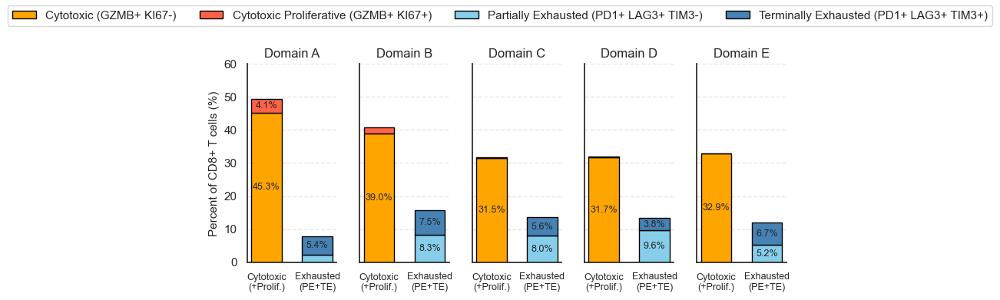

In [4]:
# Column keys (exactly as in your table)
col_cyt = "Cytotoxic (GZMB+ KI67-)"
col_cytp = "Cytotoxic Proliferative (GZMB+ KI67+)"
col_pe = "Partially Exhausted (PD1+ LAG3+ TIM3-)"
col_te = "Terminally Exhausted (PD1+ LAG3+ TIM3+)"

# Colors (adjust to your palette)
colors = {
    col_cyt:  "orange",  # Cytotoxic
    col_cytp: "tomato",  # Cytotoxic Proliferative
    col_pe:   "skyblue",  # Partially Exhausted
    col_te:   "steelblue",  # Terminally Exhausted
}

domains = ["A", "B", "C", "D", "E"]
df = CD8_infilterated.set_index("Domain_mod").loc[domains].reset_index()

fig, axes = plt.subplots(1, 5, figsize=(8, 4), sharey=True)
bar_width = 0.6

for i, dom in enumerate(domains):
    ax = axes[i]
    row = df[df["Domain_mod"] == dom].iloc[0]

    # Left bar: Cytotoxic stack
    left_x = 0
    c1 = row[col_cyt]
    c2 = row[col_cytp]
    ax.bar(left_x, c1, width=bar_width, color=colors[col_cyt], edgecolor="black", label=col_cyt)
    ax.bar(left_x, c2, width=bar_width, bottom=c1, color=colors[col_cytp], edgecolor="black", label=col_cytp)

    # Right bar: Exhausted stack
    right_x = 1
    e1 = row[col_pe]
    e2 = row[col_te]
    ax.bar(right_x, e1, width=bar_width, color=colors[col_pe], edgecolor="black", label=col_pe)
    ax.bar(right_x, e2, width=bar_width, bottom=e1, color=colors[col_te], edgecolor="black", label=col_te)

    # segment labels (only if big enough)
    def add_pct_label(x, h, bottom=0):
        if h >= 3:  # threshold to avoid clutter on tiny slices
            ax.text(x, bottom + h/2, f"{h:.1f}%", ha="center", va="center", fontsize=9)

    add_pct_label(left_x, c1, 0)
    add_pct_label(left_x, c2, c1)
    add_pct_label(right_x, e1, 0)
    add_pct_label(right_x, e2, e1)

    # Axis cosmetics
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["Cytotoxic\n(+Prolif.)", "Exhausted\n(PE+TE)"], fontsize=9)
    ax.set_title(f"Domain {dom}", fontsize=12)
    ax.set_ylim(0, 60)   # <-- updated limit
    ax.grid(axis="y", linestyle="--", alpha=0.5)
    # show only left spine and bottom spine
    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)

# Shared y-label
axes[0].set_ylabel("Percent of CD8+ T cells (%)", fontsize=11)

# One shared legend (unique handles)
handles, labels = [], []
for ax in axes:
    h, l = ax.get_legend_handles_labels()
    handles += h; labels += l
uniq = dict(zip(labels, handles))
fig.legend(uniq.values(), uniq.keys(), loc="upper center", ncol=4, frameon=True)

plt.tight_layout(rect=[0, 0, 1, 0.9])

# Save high-res
#plt.savefig("CD8_domain_stacks.pdf", dpi=600, bbox_inches="tight")
plt.show()

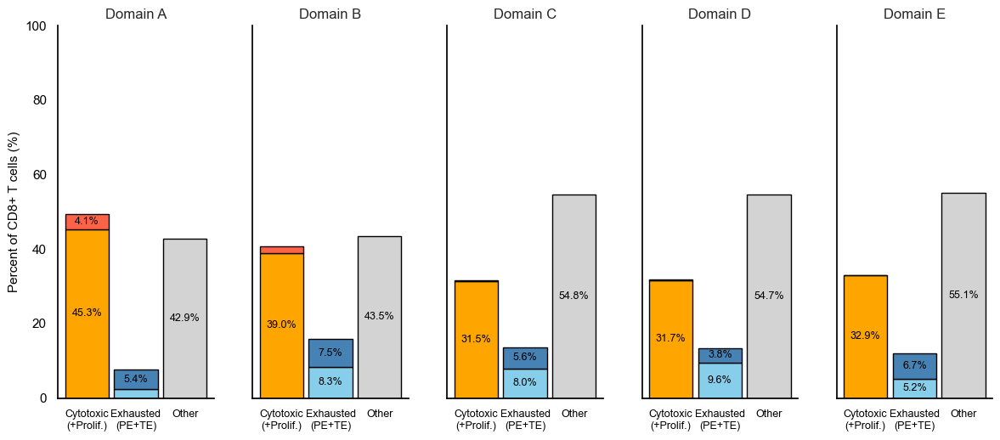

In [20]:
# Column keys
col_cyt = "Cytotoxic (GZMB+ KI67-)"
col_cytp = "Cytotoxic Proliferative (GZMB+ KI67+)"
col_pe = "Partially Exhausted (PD1+ LAG3+ TIM3-)"
col_te = "Terminally Exhausted (PD1+ LAG3+ TIM3+)"

col_other_bar = "Other (remaining CD8+)"

# Colors
colors = {
    col_cyt:       "orange",
    col_cytp:      "tomato",
    col_pe:        "skyblue",
    col_te:        "steelblue",
    col_other_bar: "lightgrey",
}

domains = ["A", "B", "C", "D", "E"]

df = (
    CD8_infilterated
    .set_index("Domain_mod")
    .loc[domains]
    .reset_index()
)

# --- Plot setup ---
fig, axes = plt.subplots(
    1, 5,
    figsize=(12, 6),
    sharey=True,
    facecolor="white"
)

# Bar layout settings
bar_width = 0.8
x_positions = [0, 0.9, 1.8]  # tighter spacing

for i, dom in enumerate(domains):
    ax = axes[i]
    ax.set_facecolor("white")

    row = df[df["Domain_mod"] == dom].iloc[0]

    # Values
    c1 = row[col_cyt]
    c2 = row[col_cytp]
    e1 = row[col_pe]
    e2 = row[col_te]

    # Remaining %
    other = 100 - (c1 + c2 + e1 + e2)
    other = max(other, 0)

    # X positions
    left_x, mid_x, right_x = x_positions

    # --- Bars ---
    # Cytotoxic stack
    ax.bar(left_x, c1, width=bar_width,
           color=colors[col_cyt], edgecolor="black", label=col_cyt)
    ax.bar(left_x, c2, width=bar_width, bottom=c1,
           color=colors[col_cytp], edgecolor="black", label=col_cytp)

    # Exhausted stack
    ax.bar(mid_x, e1, width=bar_width,
           color=colors[col_pe], edgecolor="black", label=col_pe)
    ax.bar(mid_x, e2, width=bar_width, bottom=e1,
           color=colors[col_te], edgecolor="black", label=col_te)

    # Other bar
    ax.bar(right_x, other, width=bar_width,
           color=colors[col_other_bar], edgecolor="black", label=col_other_bar)

    # --- Labels ---
    def add_pct_label(x, h, bottom=0):
        if h >= 3:
            ax.text(
                x,
                bottom + h / 2,
                f"{h:.1f}%",
                ha="center",
                va="center",
                fontsize=9,
                color="black"
            )

    add_pct_label(left_x, c1, 0)
    add_pct_label(left_x, c2, c1)
    add_pct_label(mid_x, e1, 0)
    add_pct_label(mid_x, e2, e1)
    add_pct_label(right_x, other, 0)

    # --- Axes ---
    ax.set_xticks(x_positions)
    ax.set_xticklabels(
        ["Cytotoxic\n(+Prolif.)", "Exhausted\n(PE+TE)", "Other"],
        fontsize=9
    )
    ax.set_title(f"Domain {dom}", fontsize=12)
    ax.set_ylim(0, 100)

    # No grid
    ax.grid(False)

    # Black axes lines
    ax.spines["left"].set_visible(True)
    ax.spines["bottom"].set_visible(True)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.spines["left"].set_color("black")
    ax.spines["bottom"].set_color("black")

    ax.tick_params(axis="both", colors="black", width=1)

# Shared Y label
axes[0].set_ylabel("Percent of CD8+ T cells (%)", fontsize=11, color="black")

# Legend
handles, labels = [], []
for ax in axes:
    h, l = ax.get_legend_handles_labels()
    handles += h
    labels += l

uniq = dict(zip(labels, handles))

#fig.legend(
#    uniq.values(),
#    uniq.keys(),
#    loc="upper center",
#    ncol=5,
#    frameon=False
#)

# Tighter layout between domains
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.subplots_adjust(wspace=0.25)

# Save
plt.savefig("CD8_domain_stacks_final_wt_other.pdf", dpi=600, bbox_inches="tight")
plt.show()

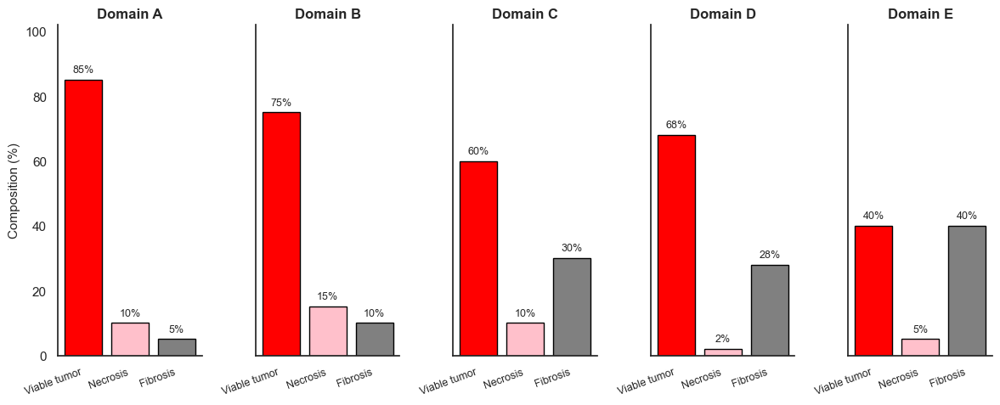

In [25]:
# Colors
colors = {
    "Viable tumor": "red",
    "Necrosis": "pink",
    "Fibrosis": "grey"
}

import matplotlib.pyplot as plt
import numpy as np

viable_tumor = {
    "Domain A": 0.85, "Domain B": 0.75, "Domain C": 0.60, "Domain D": 0.68, "Domain E": 0.40
}
necrosis = {
    "Domain A": 0.10, "Domain B": 0.15, "Domain C": 0.10, "Domain D": 0.02, "Domain E": 0.05
}
fibrosis = {
    "Domain A": 0.05, "Domain B": 0.10, "Domain C": 0.30, "Domain D": 0.28, "Domain E": 0.40
}

domains = ["Domain A", "Domain B", "Domain C", "Domain D", "Domain E"]

# DataFrame-like structure
data = {
    "Viable tumor": [viable_tumor[d] * 100 for d in domains],
    "Necrosis": [necrosis[d] * 100 for d in domains],
    "Fibrosis": [fibrosis[d] * 100 for d in domains],
}

cols = list(data.keys())
colors = ["red", "pink", "grey"]

# Shared y-axis limit
ymax = max(max(v) for v in data.values()) * 1.2

fig, axes = plt.subplots(1, 5, figsize=(12, 5), sharey=True)

for i, dom in enumerate(domains):
    ax = axes[i]

    h = [data[c][i] for c in cols]
    x = np.linspace(0, 1, len(cols))  # positions closer together

    ax.bar(x, h, width=0.4,color=colors, edgecolor="black")

    # Value labels
    for xi, hi in zip(x, h):
        ax.text(xi, hi + ymax*0.015, f"{hi:.0f}%", ha="center", va="bottom", fontsize=9)

    ax.set_xticks(x)
    ax.set_xticklabels(cols, rotation=20, ha="right", fontsize=9)
    ax.set_title(dom, fontsize=12, weight="bold")
    ax.set_ylim(0, ymax)

    #ax.grid(axis="y", linestyle="--", alpha=0.5)
    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)

# Shared y-axis label
axes[0].set_ylabel("Composition (%)", fontsize=11)

plt.tight_layout()
plt.savefig("Domain_composition_bars.pdf", dpi=600, bbox_inches="tight")
plt.show()

In [ ]:
# Figure 5 from Figure5_p143e11_microregion_domainA_10092025.ipynb

# Figure 6d redo cluster plot 

In [ ]:
os.getcwd()

'/Users/yshi797/Partners HealthCare Dropbox/Yingxiao Shi/Stable_Lesion_Project_Manuscript_preparation_2024/Processed_data'

In [ ]:
BRK6_clusters = ad.read_h5ad("BRK6tumor2F_wt_clusters_08252025.h5ad")

# ---- 1. Relabel leiden_projected from 0–6 → 1–7 ----
BRK6_clusters.obs["leiden_projected"] = (
    BRK6_clusters.obs["leiden_projected"].astype(int) + 1
).astype(str)  # now cluster labels are "1"–"7" (string form)

BRK6_clusters.obs.leiden_projected.value_counts()

leiden_projected
1    99819
2    50102
4    43495
3    42661
5    29080
6    17912
7     3881
Name: count, dtype: int64

In [ ]:
# --- CONFIG ---
out_prefix = "leiden_projected"    # filenames become e.g. leiden_projected_{cl}_with_axes.tif
PIXEL_SIZE_UM = 0.5                # <-- set to your true pixel size in microns (ignored if X_um/Y_um exist)
bar_len_um   = 2000                # 2 mm
pad_x, pad_y = 150, 200            # padding from the edges, in µm
markersize_bg     = 0.01
markersize_cluster= 0.2
x_offset_um = 1000                 # distance from the LEFT visual edge to start the bar


# ---- 2. Define cluster colors ----
cluster_palette = {
    "1": "steelblue",
    "2": "forestgreen",
    "3": "tomato",
    "4": "purple",
    "5": "orchid",
    "6": "sandybrown",
    "7": "gold",
}


# ---- get coords in microns (uses X_um/Y_um if present, else converts from pixels) ----
def get_xy_um(adata, x_col_pix="X_centroid", y_col_pix="Y_centroid"):
    obs = adata.obs
    if {"X_um", "Y_um"}.issubset(obs.columns):
        x_um = obs["X_um"].to_numpy(dtype=float)
        y_um = obs["Y_um"].to_numpy(dtype=float)
    else:
        if PIXEL_SIZE_UM is None:
            raise ValueError("PIXEL_SIZE_UM is not set and X_um/Y_um not found.")
        x_um = obs[x_col_pix].to_numpy(dtype=float) * PIXEL_SIZE_UM
        y_um = obs[y_col_pix].to_numpy(dtype=float) * PIXEL_SIZE_UM
    return x_um, y_um

def make_base_plot(bg_xy, fg_xy, color, show_ticks=True):
    fig = plt.figure(figsize=(12, 8), facecolor="white")
    ax = fig.add_subplot(111, facecolor="white")
    ax.scatter(bg_xy[0], bg_xy[1], s=markersize_bg, color="grey", alpha=0.1, zorder=1)
    ax.scatter(fg_xy[0], fg_xy[1], s=markersize_cluster, color=color, alpha=0.5, zorder=2)
    ax.set_aspect("equal"); ax.invert_yaxis()
    for side in ("left","bottom","right","top"):
        ax.spines[side].set_visible(True); ax.spines[side].set_linewidth(1.2)
        ax.spines[side].set_color("black")
    if show_ticks:
        ax.xaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
        ax.yaxis.set_major_formatter(FuncFormatter(_fmt_k_um))
        ax.xaxis.set_major_locator(MultipleLocator(5000))
        ax.yaxis.set_major_locator(MultipleLocator(5000))
        ax.tick_params(axis='x', labelsize=25)
        ax.tick_params(axis='y', labelsize=25)
    else:
        ax.tick_params(axis='both', which='both', labelbottom=False, labelleft=False,
                       bottom=False, left=False)

    # --- scale bar ---
    x0, x1, y0 = _bottom_with_left_offset(ax, x_offset_um, pad_y, bar_len_um)
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="white", linewidth=10, zorder=10)
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="black", linewidth=8,  zorder=11)
    x_mid = (x0 + x1) / 2.0
    dy = 0.25 * bar_len_um * (-1 if ax.yaxis_inverted() else 1)
    txt = ax.text(x_mid, y0 + dy, "2 mm", ha="center", va="bottom",
                  fontsize=20, color="black", zorder=12)
    txt.set_path_effects([pe.withStroke(linewidth=4, foreground="white")])
    plt.tight_layout()
    return fig, ax

# ---- precompute background ----
bg_x_um, bg_y_um = get_xy_um(BRK6adataPh)
bg_xy = (bg_x_um, bg_y_um)

# ---- loop over clusters ----
for cl in BRK6_clusters.obs["leiden_projected"].unique():
    tmp = BRK6_clusters[BRK6_clusters.obs["leiden_projected"] == cl]
    fg_x_um, fg_y_um = get_xy_um(tmp)
    fg_xy = (fg_x_um, fg_y_um)
    color = cluster_palette.get(str(cl), "black")

    # Version 1: with axes
    fig1, ax1 = make_base_plot(bg_xy, fg_xy, color, show_ticks=True)
    fig1.savefig(f"{out_prefix}_{cl}_with_axes.tif", dpi=600, bbox_inches="tight", facecolor="white")
    plt.close(fig1)

    # Version 2: no axes
    fig2, ax2 = make_base_plot(bg_xy, fg_xy, color, show_ticks=False)
    fig2.savefig(f"{out_prefix}_{cl}_no_axes.tif", dpi=600, bbox_inches="tight", facecolor="white")
    plt.close(fig2)

# Figure 6e microregion mapping

# now read domain data

In [17]:
BRK6_mpi = ad.read_h5ad("BRK6tumor2F_wt_clusters_MPI_08292025.h5ad")

# ---- 1. Relabel leiden_projected from 0–6 → 1–7 ----
BRK6_mpi.obs["leiden_projected"] = (
    BRK6_mpi.obs["leiden_projected"].astype(int) + 1
).astype(str)  # now cluster labels are "1"–"7" (string form)

BRK6_mpi.obs["leiden_projected"].value_counts()

leiden_projected
1    99819
2    50102
4    43495
3    42661
5    29080
6    17912
7     3881
Name: count, dtype: int64

In [18]:
BRK6_mpi.obs.Domain_mod.value_counts()

Domain_mod
A        107162
D         75276
B         58706
C         20592
Other     12682
E         12532
Name: count, dtype: int64

In [19]:
# subset domainA
domainA = BRK6_mpi[BRK6_mpi.obs.Domain_mod == "A"]
domainA

View of AnnData object with n_obs × n_vars = 107162 × 64
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'phenotype', 'SOX10_positive', 'PMEL_positive', 'IFIT1_positive', 'NGFR_positive', 'S100A1_positive', 'S100B_positive', 'HIF1A_positive', 'KI67_positive', 'pH3_positive', 'PCNA_positive', 'CCND1_positive', 'CDKN1A_positive', 'CCNE1_positive', 'CCNA2_positive', 'CDKN1B_positive', 'Gem_positive', 'Domain', 'Domain_mod', 'leiden_projected', 'optMPI_score', 'CD8A_positive', 'marker_combo'
    uns: 'all_markers', 'gates', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

/opt/anaconda3/envs/scimap_2025/lib/python3.11/site-packages/spatialcells/spatial/_getCommunities.py:40: ImplicitModificationWarning:

Trying to modify attribute `.obs` of view, initializing view as actual.



number of communities: 11


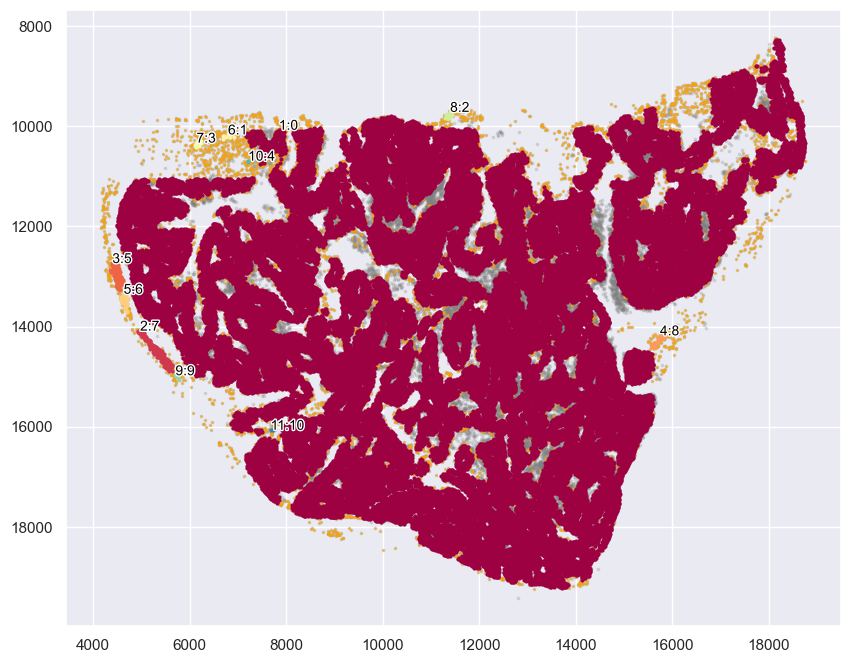

In [20]:
markers_of_interest = ["SOX10_positive"]
communitycolumn = "COI_community"

ret = spc.spatial.getCommunities(
    domainA, markers_of_interest, eps=100, newcolumn=communitycolumn
)

# check the number of the communities
print("number of communities:", len(ret[0]))
# Plotting the communities
plot_first_n_clusters = 20
fig, ax = plt.subplots(figsize=(10, 8))
spc.plt.plotCommunities(
    domainA,
    ret,
    communitycolumn,
    plot_first_n_clusters=plot_first_n_clusters,
    s=2,
    fontsize=10,
    ax=ax,
)
ax.invert_yaxis()
plt.show()

In [21]:
# now redo the neighorhood analysis
# continue 
clusters_idx_sorted = [idx for npoints, idx in ret[0]] # so this is sorting based on the size of the cluster?
clusters_idx_sorted

plot_first_n_clusters = 20
print(
    "Indexes of the",
    plot_first_n_clusters,
    "largest clusters:\n",
    clusters_idx_sorted[:plot_first_n_clusters],
)
print("Cluster size and index:\n", ret[0][:plot_first_n_clusters])

Indexes of the 20 largest clusters:
 [0, 7, 5, 8, 6, 1, 3, 2, 9, 4, 10]
Cluster size and index:
 [(89917, 0), (204, 7), (133, 5), (62, 8), (62, 6), (58, 1), (45, 3), (38, 2), (27, 9), (23, 4), (19, 10)]


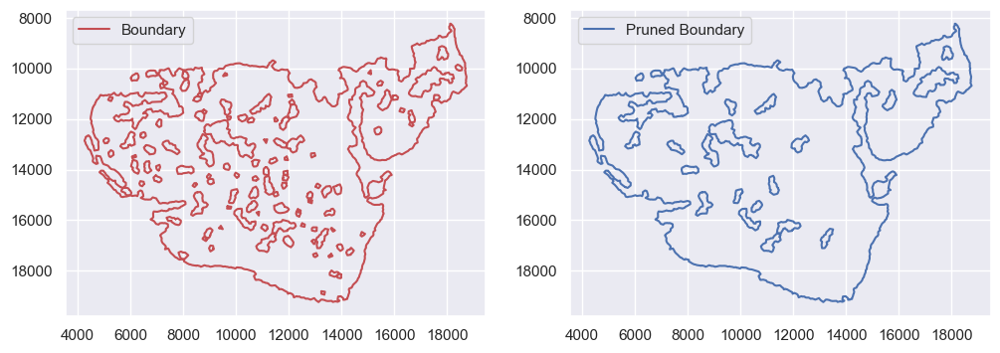

In [22]:
A_communityIndexList = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
boundary = spc.spa.getBoundary(domainA, communitycolumn, A_communityIndexList, alpha=80)
# filter out small regions or holes based on the number of edges
# or the area of the region
boundary_pruned = spc.spa.pruneSmallComponents(
    boundary, 
    min_edges=50, holes_min_edges=50, holes_min_area=50000
)

# set up the background to white

fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(12, 4))
spc.plt.plotBoundary(boundary, ax=ax1, color="r", label="Boundary")
ax1.invert_yaxis()
ax1.legend()


spc.plt.plotBoundary(boundary_pruned, ax=ax2, color="b", label="Pruned Boundary")
ax2.invert_yaxis()
ax2.legend()
plt.show()

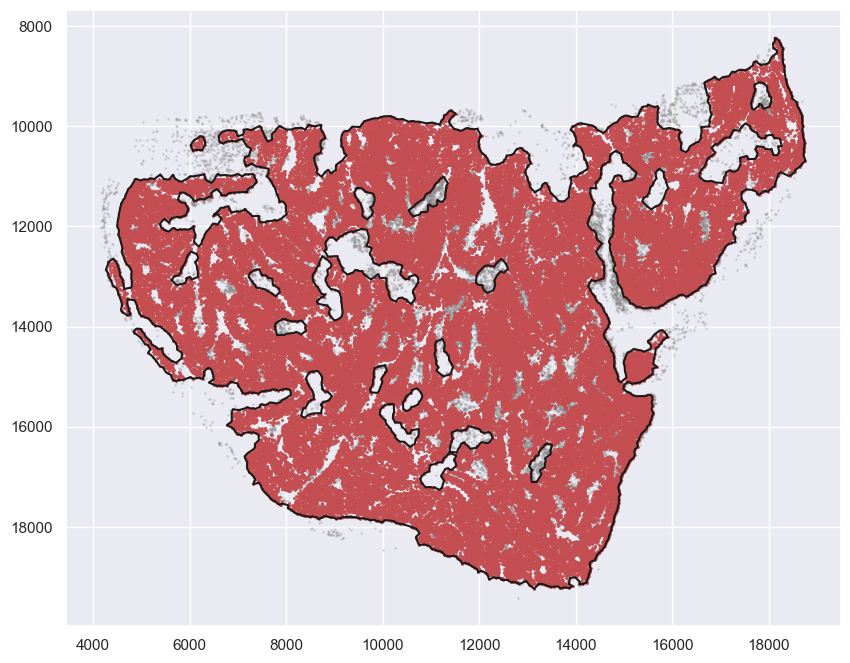

In [23]:
markersize = 1
fig, ax = plt.subplots(figsize=(10, 8))
## all points
ax.scatter(
    *zip(*domainA.obs[["X_centroid", "Y_centroid"]].to_numpy()),
    s=markersize,
    color="grey",
    alpha=0.2
)
## Points in selected commnities
xy = domainA.obs[domainA.obs[communitycolumn].isin(A_communityIndexList)][["X_centroid", "Y_centroid"]].to_numpy()
ax.scatter(xy[:, 0], xy[:, 1], s=markersize, color="r")
# Boundary of selected communities
spc.plt.plotBoundary(boundary_pruned, ax=ax)
#plt.ylim(44000, 55000)
ax.invert_yaxis()
plt.show()


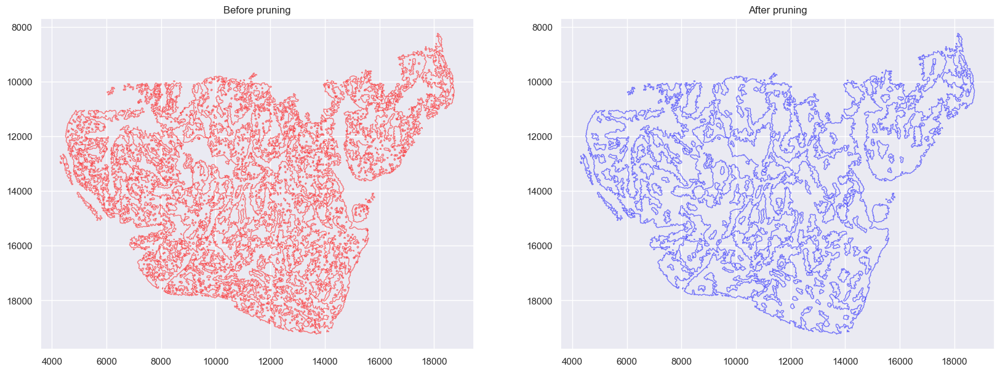

In [24]:
# smaller alpha results in more detailed boundaries
boundariesA, polygons, edge_components = spc.spatial.getBoundary(
    domainA, communitycolumn, A_communityIndexList, alpha=27, debug=True
)
boundariesA_small = spc.spatial.pruneSmallComponents(
    boundariesA, min_area=0, min_edges=20, holes_min_area=15000, holes_min_edges=10
)
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(20, 7))
spc.plt.plotBoundary(boundariesA, c="red", alpha=0.5, linewidth=1, ax=ax1)
spc.plt.plotBoundary(boundariesA_small, c="blue", alpha=0.5, linewidth=1, ax=ax2)
ax1.set_title("Before pruning")
ax2.set_title("After pruning")
ax1.invert_yaxis()
ax2.invert_yaxis()
plt.show()

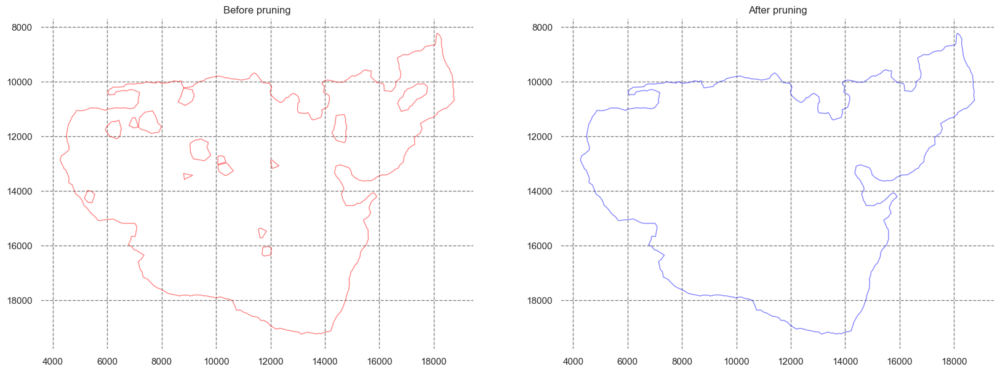

In [25]:
# now check 
# larger alpha results in more rough boundaries with less jagged exterior
boundaries_rough, polygons_rough, edge_components_rough = spc.spatial.getBoundary(
    domainA, communitycolumn, A_communityIndexList, alpha=180, debug=True
)
boundaries_rough1 = spc.spatial.pruneSmallComponents(
    boundaries_rough,
    min_area=100000,
    min_edges=30,
    holes_min_area=4000,
    holes_min_edges=3000,
)
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(20, 7))
spc.plt.plotBoundary(boundaries_rough, c="red", alpha=0.5, linewidth=1, ax=ax1)
spc.plt.plotBoundary(boundaries_rough1, c="blue", alpha=0.5, linewidth=1, ax=ax2)
ax1.set_title("Before pruning")
ax2.set_title("After pruning")
ax1.invert_yaxis()
ax1.set_facecolor("white")
ax1.grid(True, color = "grey", linestyle = "--")
ax2.invert_yaxis()
ax2.set_facecolor("white")
ax2.grid(True, color = "grey", linestyle = "--")
plt.show()

In [26]:
# getExtendedBoundary & getShrunkenBoundary
shrunken_boundaries_rough = spc.spa.getShrunkenBoundary(boundaries_rough1, 100)
shrunken_boundaries_rough = spc.spatial.pruneSmallComponents(
    shrunken_boundaries_rough,
    min_area = 0, 
    min_edges = 10, 
    holes_min_area = 1000, 
    holes_min_edges = 10, 
)

extended_boundaries_rough = spc.spa.getExtendedBoundary(boundaries_rough1, 200)
extended_boundaries_rough = spc.spatial.pruneSmallComponents(
    extended_boundaries_rough,
    min_area=0,
    min_edges=10,
    holes_min_area=1000,
    holes_min_edges=10,
)
ROI_boundaries_rough = spc.spa.getExtendedBoundary(boundaries_rough1, 800)
ROI_boundaries_rough = spc.spatial.pruneSmallComponents(
    ROI_boundaries_rough,
    min_area=0,
    min_edges=20,
    holes_min_area=1000,
    holes_min_edges=10,
)


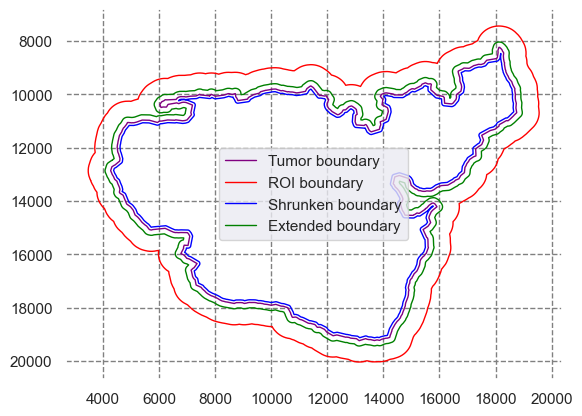

In [27]:
spc.plt.plotBoundary(
    boundaries_rough1, linewidth=1, color="purple", label="Tumor boundary"
)
spc.plt.plotBoundary(
    ROI_boundaries_rough, linewidth=1, color="red", label="ROI boundary"
)
spc.plt.plotBoundary(
    shrunken_boundaries_rough, linewidth=1, color="blue", label="Shrunken boundary"
)
spc.plt.plotBoundary(
    extended_boundaries_rough, linewidth=1, color="green", label="Extended boundary"
)
#plt.ylim(14000, 0)
plt.legend(markerscale=5)
plt.gca().invert_yaxis()
plt.gca().set_facecolor("white")
plt.grid(True, color = "grey", linestyle = "--")
plt.show()

In [28]:
# assignPointsToRegion
regions = ["Tumor", "Tumor Border", "Stroma Border", "Stroma"]
boundaries_list = [
    shrunken_boundaries_rough,
    boundaries_rough1,
    extended_boundaries_rough,
    ROI_boundaries_rough,
]
domainA.obs["region_rough"] = "BG"
spc.spatial.assignPointsToRegions(
    domainA, boundaries_list, regions, assigncolumn="region_rough", default="BG"
)

106808it [00:03, 26882.29it/s]


Assigned points to region: Tumor


7180it [00:00, 26833.91it/s]


Assigned points to region: Tumor Border


1764it [00:00, 23622.64it/s]


Assigned points to region: Stroma Border


693it [00:00, 27133.03it/s]

Assigned points to region: Stroma


Number of components: 141


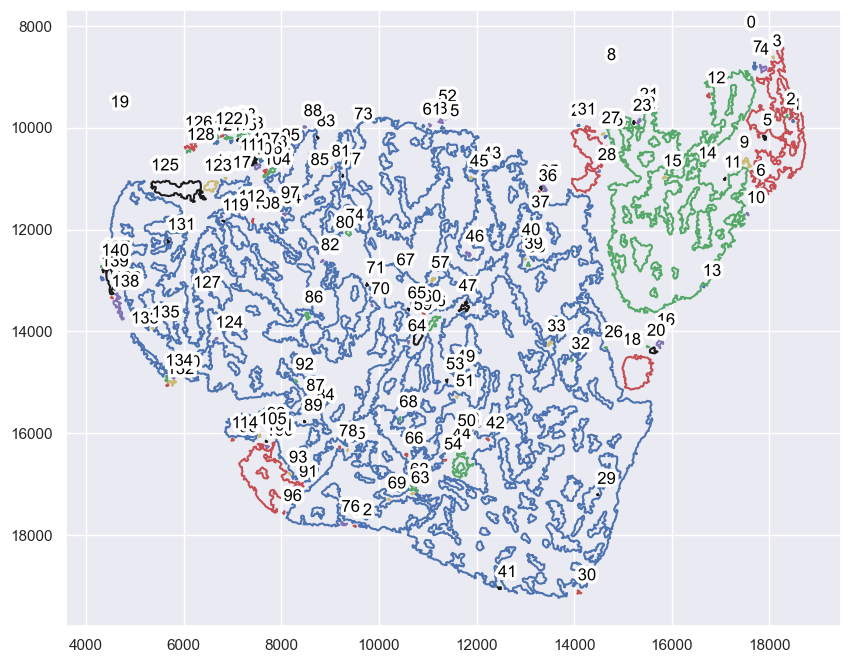

In [29]:
boundary_component_list = spc.spa.getComponents(boundariesA_small)
print("Number of components:", len(boundary_component_list))
fig, ax = plt.subplots(figsize=(10, 8))
spc.plt.plotRegions(
    boundary_component_list,
    colors_list=["r", "b", "g", "y", "m", "k"],
    x_offset=0,
    y_offset=-200,
    ax=ax,
)
ax.invert_yaxis()
plt.show()

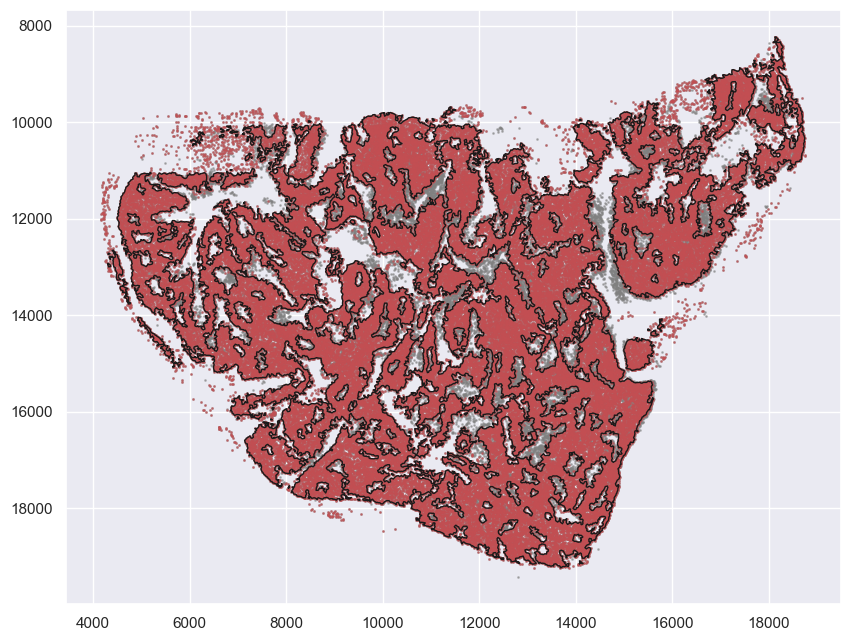

In [30]:
markersize = 1

fig, ax = plt.subplots(figsize=(10, 9))
## all points
ax.scatter(
    *zip(*domainA.obs[["X_centroid", "Y_centroid"]].to_numpy()),
    s=markersize,
    color="grey",
    alpha=0.5,
    label="All cells"
)

# Points in selected commnities
xy = domainA.obs[
    domainA.obs["SOX10_positive"]
][  # [adata.obs[communitycolumn].isin(communityIndexList)][
    ["X_centroid", "Y_centroid"]
].to_numpy()
ax.scatter(
    xy[:, 0],
    xy[:, 1],
    s=markersize,
    color="r",
    marker="o",
    alpha=0.5,
    label="SOX10+cells",
)

# Bounds of points in selected commnities
spc.plt.plotBoundary(boundariesA_small, linewidth=1, color="k", ax=ax)
ax.invert_yaxis()
ax.set_aspect('equal') 

plt.show()

/opt/anaconda3/envs/scimap_2025/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



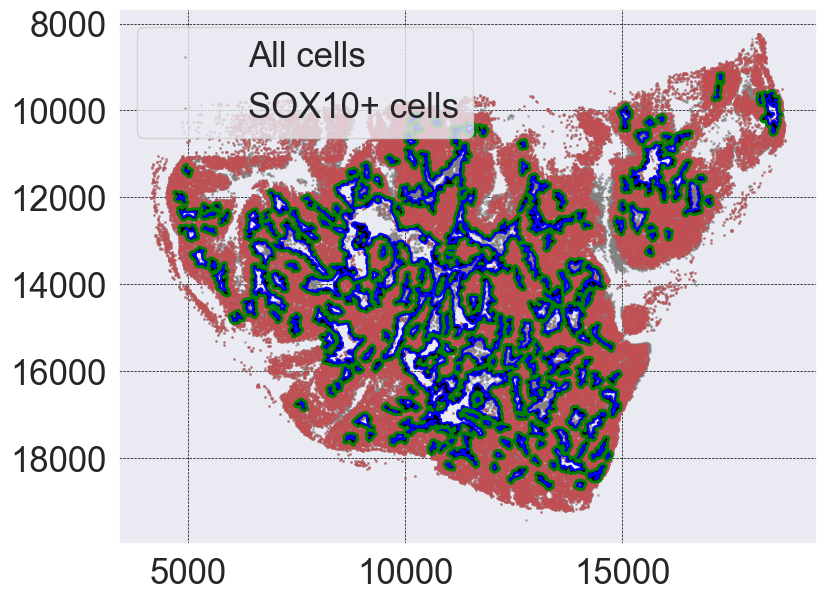

In [31]:
tumor_mass = domainA[domainA.obs[communitycolumn].isin(A_communityIndexList)]
tumor_mass.obs["COI_community"].value_counts()

# isolate non-tumor cell holes within the tumor region
from shapely.geometry import Polygon


holes = spc.spa.getHoles(boundariesA_small)
final_holes = []
hole_id_map = {}  # maps hole_id (original index) → polygon

roi_poly = Polygon(
    [
        (50000, 50000),
        (50000, 50000),
        (50000, 50000),
        (50000, 50000),
    ]
)
for i, hole in enumerate(holes):  # ✅ use enumerate
    final_holes.append(hole)
    hole_id_map[i] = hole

shrunken_holes = []
extended_holes = []
for i, hole in enumerate(final_holes):
    shrunken_holes.append(spc.spatial.bufferBoundary(hole, -30))
    extended_holes.append(spc.spatial.bufferBoundary(hole, 30))

markersize = 1

fig, ax = plt.subplots(figsize=(9, 9))

## all points
ax.scatter(
    *zip(*domainA.obs[["X_centroid", "Y_centroid"]].to_numpy()),
    s=markersize,
    color="grey",
    alpha=0.5,
    label="All cells"
)


xy = domainA.obs[domainA.obs.SOX10_positive][["X_centroid", "Y_centroid"]].to_numpy()

ax.scatter(
    xy[:, 0],
    xy[:, 1],
    s=markersize,
    color="r",
    marker="o",
    alpha=0.4,
    label="SOX10+ cells",
)

spc.plt.plotRegions(
    final_holes,
    colors_list=["black"],
    ax=ax,
    #label_bounds=(6000, 6300, 9050, 10000),
    x_offset=5,
    y_offset=5,
    add_label=False,
)

spc.plt.plotRegions(shrunken_holes, colors_list=["blue"], ax=ax, add_label=False)
spc.plt.plotRegions(
    extended_holes, colors_list=["green"], ax=ax, add_label=False, linewidth=2
)

ax.grid(color='black', linestyle='--', linewidth=0.5)

ax.tick_params(axis='x', labelsize=25)  # Change 12 to your desired font size
ax.tick_params(axis='y', labelsize=25)
# set legend
ax.legend(fontsize=25)
#spc.plt.plotBoundary(boundariesA_small, linewidth=1, color="k", ax=ax)
ax.set_aspect("equal")
ax.invert_yaxis()
plt.show()

In [32]:
adata = domainA.copy()
# assign them
for i, hole in enumerate(final_holes):
    boundaries_list = [shrunken_holes[i], hole, extended_holes[i]]
    regions = ["0In", "1Bi", "2Bo"]
    spc.spa.assignPointsToRegions(
        adata, boundaries_list, regions, assigncolumn=f"hole_{i}", default="BG"
    )

4it [00:00, 3167.31it/s]


Assigned points to region: 0In


36it [00:00, 10033.55it/s]


Assigned points to region: 1Bi


70it [00:00, 15564.93it/s]


Assigned points to region: 2Bo


271it [00:00, 18914.33it/s]


Assigned points to region: 0In


395it [00:00, 27038.39it/s]


Assigned points to region: 1Bi


487it [00:00, 29010.45it/s]


Assigned points to region: 2Bo


111it [00:00, 22284.50it/s]


Assigned points to region: 0In


175it [00:00, 13344.54it/s]


Assigned points to region: 1Bi


237it [00:00, 20063.98it/s]


Assigned points to region: 2Bo


43it [00:00, 8933.78it/s]


Assigned points to region: 0In


102it [00:00, 13164.88it/s]


Assigned points to region: 1Bi


135it [00:00, 23022.20it/s]


Assigned points to region: 2Bo


17it [00:00, 6468.58it/s]


Assigned points to region: 0In


47it [00:00, 10748.18it/s]


Assigned points to region: 1Bi


78it [00:00, 20179.85it/s]


Assigned points to region: 2Bo


59it [00:00, 13131.54it/s]


Assigned points to region: 0In


109it [00:00, 23977.51it/s]


Assigned points to region: 1Bi


147it [00:00, 22215.27it/s]


Assigned points to region: 2Bo


99it [00:00, 14026.82it/s]


Assigned points to region: 0In


116it [00:00, 28721.33it/s]


Assigned points to region: 1Bi


159it [00:00, 18172.00it/s]


Assigned points to region: 2Bo


283it [00:00, 26102.56it/s]


Assigned points to region: 0In


354it [00:00, 15101.70it/s]


Assigned points to region: 1Bi


401it [00:00, 16417.42it/s]


Assigned points to region: 2Bo


2it [00:00, 3502.55it/s]


Assigned points to region: 0In


23it [00:00, 6911.38it/s]


Assigned points to region: 1Bi


41it [00:00, 8401.72it/s]


Assigned points to region: 2Bo


24it [00:00, 9415.70it/s]


Assigned points to region: 0In


58it [00:00, 12296.28it/s]


Assigned points to region: 1Bi


100it [00:00, 14250.83it/s]


Assigned points to region: 2Bo


1300it [00:00, 19807.09it/s]


Assigned points to region: 0In


1583it [00:00, 16582.75it/s]


Assigned points to region: 1Bi


1724it [00:00, 21772.85it/s]


Assigned points to region: 2Bo


3it [00:00, 6879.67it/s]


Assigned points to region: 0In


29it [00:00, 13564.72it/s]


Assigned points to region: 1Bi


64it [00:00, 18119.17it/s]


Assigned points to region: 2Bo


12it [00:00, 9563.30it/s]


Assigned points to region: 0In


48it [00:00, 16953.82it/s]


Assigned points to region: 1Bi


89it [00:00, 20246.95it/s]


Assigned points to region: 2Bo


7it [00:00, 4441.77it/s]


Assigned points to region: 0In


35it [00:00, 11674.94it/s]


Assigned points to region: 1Bi


78it [00:00, 24458.41it/s]


Assigned points to region: 2Bo


3it [00:00, 4053.77it/s]


Assigned points to region: 0In


27it [00:00, 12863.04it/s]


Assigned points to region: 1Bi


53it [00:00, 13740.77it/s]


Assigned points to region: 2Bo


164it [00:00, 26379.27it/s]


Assigned points to region: 0In


236it [00:00, 27326.72it/s]


Assigned points to region: 1Bi


303it [00:00, 26329.54it/s]


Assigned points to region: 2Bo


367it [00:00, 27065.26it/s]


Assigned points to region: 0In


569it [00:00, 28182.27it/s]


Assigned points to region: 1Bi


684it [00:00, 23775.58it/s]


Assigned points to region: 2Bo


2it [00:00, 2320.50it/s]


Assigned points to region: 0In


28it [00:00, 7225.77it/s]


Assigned points to region: 1Bi


68it [00:00, 11667.53it/s]


Assigned points to region: 2Bo


6it [00:00, 3186.76it/s]


Assigned points to region: 0In


33it [00:00, 6647.71it/s]


Assigned points to region: 1Bi


67it [00:00, 10169.67it/s]

Assigned points to region: 2Bo

351it [00:00, 17274.48it/s]


Assigned points to region: 0In


371it [00:00, 16895.26it/s]


Assigned points to region: 1Bi


412it [00:00, 19716.73it/s]


Assigned points to region: 2Bo


2it [00:00, 1845.27it/s]


Assigned points to region: 0In


29it [00:00, 10638.92it/s]


Assigned points to region: 1Bi


64it [00:00, 14244.39it/s]


Assigned points to region: 2Bo


32it [00:00, 13876.94it/s]

Assigned points to region: 0In



108it [00:00, 24924.88it/s]


Assigned points to region: 1Bi


167it [00:00, 24895.99it/s]


Assigned points to region: 2Bo


10it [00:00, 8880.59it/s]


Assigned points to region: 0In


35it [00:00, 12148.35it/s]


Assigned points to region: 1Bi


71it [00:00, 16466.44it/s]


Assigned points to region: 2Bo


5it [00:00, 3089.50it/s]


Assigned points to region: 0In


58it [00:00, 17297.33it/s]


Assigned points to region: 1Bi


104it [00:00, 20643.02it/s]


Assigned points to region: 2Bo


30it [00:00, 8670.69it/s]


Assigned points to region: 0In


93it [00:00, 23838.55it/s]


Assigned points to region: 1Bi


129it [00:00, 26478.67it/s]


Assigned points to region: 2Bo


6it [00:00, 2729.78it/s]


Assigned points to region: 0In


25it [00:00, 11600.58it/s]


Assigned points to region: 1Bi


58it [00:00, 19041.14it/s]


Assigned points to region: 2Bo


2it [00:00, 5023.12it/s]


Assigned points to region: 0In


32it [00:00, 8232.20it/s]


Assigned points to region: 1Bi


72it [00:00, 21889.67it/s]


Assigned points to region: 2Bo


25it [00:00, 11899.41it/s]


Assigned points to region: 0In


104it [00:00, 18674.87it/s]


Assigned points to region: 1Bi


157it [00:00, 26118.74it/s]


Assigned points to region: 2Bo


42it [00:00, 17926.20it/s]


Assigned points to region: 0In


103it [00:00, 15662.87it/s]


Assigned points to region: 1Bi


139it [00:00, 24454.02it/s]


Assigned points to region: 2Bo


35it [00:00, 12376.75it/s]


Assigned points to region: 0In


76it [00:00, 12345.74it/s]


Assigned points to region: 1Bi


121it [00:00, 23782.14it/s]


Assigned points to region: 2Bo


20it [00:00, 11785.06it/s]


Assigned points to region: 0In


63it [00:00, 16329.33it/s]


Assigned points to region: 1Bi


118it [00:00, 23676.23it/s]


Assigned points to region: 2Bo


38it [00:00, 13557.63it/s]


Assigned points to region: 0In


136it [00:00, 18333.99it/s]

Assigned points to region: 1Bi

199it [00:00, 24763.88it/s]

Assigned points to region: 2Bo



115it [00:00, 14351.66it/s]


Assigned points to region: 0In


181it [00:00, 26103.53it/s]


Assigned points to region: 1Bi


242it [00:00, 14152.95it/s]


Assigned points to region: 2Bo


5it [00:00, 4970.73it/s]


Assigned points to region: 0In


48it [00:00, 10668.57it/s]


Assigned points to region: 1Bi


86it [00:00, 11689.73it/s]


Assigned points to region: 2Bo


145it [00:00, 16803.64it/s]


Assigned points to region: 0In


267it [00:00, 15940.43it/s]


Assigned points to region: 1Bi


326it [00:00, 16547.38it/s]


Assigned points to region: 2Bo


180it [00:00, 25553.38it/s]


Assigned points to region: 0In


265it [00:00, 17111.17it/s]


Assigned points to region: 1Bi


339it [00:00, 27279.11it/s]


Assigned points to region: 2Bo


1it [00:00, 1872.46it/s]


Assigned points to region: 0In


32it [00:00, 16014.52it/s]


Assigned points to region: 1Bi


73it [00:00, 21675.22it/s]


Assigned points to region: 2Bo


105it [00:00, 13646.56it/s]


Assigned points to region: 0In


201it [00:00, 26818.14it/s]


Assigned points to region: 1Bi


302it [00:00, 18005.91it/s]


Assigned points to region: 2Bo


68it [00:00, 18172.20it/s]


Assigned points to region: 0In


151it [00:00, 16890.42it/s]


Assigned points to region: 1Bi


227it [00:00, 26376.35it/s]


Assigned points to region: 2Bo


227it [00:00, 17512.59it/s]


Assigned points to region: 0In


268it [00:00, 25915.84it/s]


Assigned points to region: 1Bi


328it [00:00, 17217.09it/s]


Assigned points to region: 2Bo


109it [00:00, 20686.84it/s]


Assigned points to region: 0In


163it [00:00, 23435.88it/s]


Assigned points to region: 1Bi


230it [00:00, 26728.64it/s]


Assigned points to region: 2Bo


720it [00:00, 21325.31it/s]


Assigned points to region: 0In


870it [00:00, 25032.38it/s]


Assigned points to region: 1Bi


978it [00:00, 23833.21it/s]


Assigned points to region: 2Bo


97it [00:00, 21356.82it/s]


Assigned points to region: 0In


137it [00:00, 15393.80it/s]


Assigned points to region: 1Bi


179it [00:00, 24182.84it/s]


Assigned points to region: 2Bo


23it [00:00, 9823.73it/s]


Assigned points to region: 0In


65it [00:00, 10961.31it/s]


Assigned points to region: 1Bi


113it [00:00, 22065.01it/s]

Assigned points to region: 2Bo



31it [00:00, 12773.69it/s]


Assigned points to region: 0In


59it [00:00, 13330.31it/s]


Assigned points to region: 1Bi


96it [00:00, 20711.55it/s]


Assigned points to region: 2Bo


63it [00:00, 19359.74it/s]


Assigned points to region: 0In


113it [00:00, 15694.44it/s]


Assigned points to region: 1Bi


160it [00:00, 23925.58it/s]


Assigned points to region: 2Bo


442it [00:00, 21438.61it/s]


Assigned points to region: 0In


535it [00:00, 27751.77it/s]


Assigned points to region: 1Bi


628it [00:00, 27407.76it/s]

Assigned points to region: 2Bo

1558it [00:00, 24139.75it/s]


Assigned points to region: 0In


1817it [00:00, 27918.59it/s]


Assigned points to region: 1Bi


1959it [00:00, 29135.68it/s]


Assigned points to region: 2Bo


19it [00:00, 7861.48it/s]


Assigned points to region: 0In


52it [00:00, 11954.17it/s]


Assigned points to region: 1Bi


96it [00:00, 21932.20it/s]


Assigned points to region: 2Bo


82it [00:00, 19380.87it/s]


Assigned points to region: 0In


166it [00:00, 18395.58it/s]


Assigned points to region: 1Bi


215it [00:00, 25906.39it/s]


Assigned points to region: 2Bo


12it [00:00, 5424.84it/s]

Assigned points to region: 0In

33it [00:00, 13333.21it/s]


Assigned points to region: 1Bi


69it [00:00, 18785.34it/s]


Assigned points to region: 2Bo


184it [00:00, 16982.11it/s]


Assigned points to region: 0In


304it [00:00, 26758.48it/s]


Assigned points to region: 1Bi


348it [00:00, 16800.97it/s]


Assigned points to region: 2Bo


31it [00:00, 11650.84it/s]


Assigned points to region: 0In


71it [00:00, 12753.56it/s]


Assigned points to region: 1Bi


112it [00:00, 23231.40it/s]


Assigned points to region: 2Bo


62it [00:00, 10919.00it/s]


Assigned points to region: 0In


131it [00:00, 21119.03it/s]

Assigned points to region: 1Bi

189it [00:00, 17665.15it/s]


Assigned points to region: 2Bo


1374it [00:00, 22693.07it/s]


Assigned points to region: 0In


1572it [00:00, 19926.40it/s]


Assigned points to region: 1Bi


1734it [00:00, 20813.02it/s]


Assigned points to region: 2Bo


53it [00:00, 11458.67it/s]


Assigned points to region: 0In


135it [00:00, 19168.28it/s]


Assigned points to region: 1Bi


187it [00:00, 17990.98it/s]


Assigned points to region: 2Bo


41it [00:00, 13389.90it/s]


Assigned points to region: 0In


91it [00:00, 15568.68it/s]


Assigned points to region: 1Bi


144it [00:00, 15768.47it/s]


Assigned points to region: 2Bo


3it [00:00, 3105.36it/s]


Assigned points to region: 0In


26it [00:00, 7473.40it/s]


Assigned points to region: 1Bi


58it [00:00, 11005.68it/s]


Assigned points to region: 2Bo


10it [00:00, 6373.35it/s]


Assigned points to region: 0In


33it [00:00, 8776.92it/s]


Assigned points to region: 1Bi


71it [00:00, 16146.81it/s]


Assigned points to region: 2Bo


43it [00:00, 10853.65it/s]


Assigned points to region: 0In


104it [00:00, 15094.73it/s]


Assigned points to region: 1Bi


153it [00:00, 24865.49it/s]


Assigned points to region: 2Bo


7it [00:00, 11591.05it/s]


Assigned points to region: 0In


38it [00:00, 18464.27it/s]


Assigned points to region: 1Bi


74it [00:00, 12754.41it/s]


Assigned points to region: 2Bo


3it [00:00, 1403.25it/s]


Assigned points to region: 0In


42it [00:00, 17114.62it/s]


Assigned points to region: 1Bi


78it [00:00, 12402.13it/s]


Assigned points to region: 2Bo


90it [00:00, 16298.41it/s]


Assigned points to region: 0In


125it [00:00, 26249.84it/s]


Assigned points to region: 1Bi


198it [00:00, 17884.62it/s]


Assigned points to region: 2Bo


26it [00:00, 10207.99it/s]


Assigned points to region: 0In


57it [00:00, 13368.11it/s]


Assigned points to region: 1Bi


98it [00:00, 13993.86it/s]


Assigned points to region: 2Bo


358it [00:00, 5475.59it/s]


Assigned points to region: 0In


515it [00:00, 25327.33it/s]


Assigned points to region: 1Bi


615it [00:00, 22265.64it/s]


Assigned points to region: 2Bo


70it [00:00, 17326.72it/s]


Assigned points to region: 0In


124it [00:00, 20327.28it/s]

Assigned points to region: 1Bi



184it [00:00, 25741.37it/s]


Assigned points to region: 2Bo


8it [00:00, 4824.50it/s]


Assigned points to region: 0In


45it [00:00, 13302.11it/s]


Assigned points to region: 1Bi


82it [00:00, 19235.62it/s]


Assigned points to region: 2Bo


9it [00:00, 8135.50it/s]

Assigned points to region: 0In

34it [00:00, 11682.34it/s]


Assigned points to region: 1Bi


69it [00:00, 19941.22it/s]


Assigned points to region: 2Bo


129it [00:00, 21141.14it/s]


Assigned points to region: 0In


200it [00:00, 27454.13it/s]


Assigned points to region: 1Bi


256it [00:00, 26194.58it/s]


Assigned points to region: 2Bo


8it [00:00, 7790.67it/s]


Assigned points to region: 0In


41it [00:00, 15650.39it/s]


Assigned points to region: 1Bi


90it [00:00, 23841.81it/s]

Assigned points to region: 2Bo

6it [00:00, 10255.02it/s]


Assigned points to region: 0In


48it [00:00, 16243.88it/s]


Assigned points to region: 1Bi


100it [00:00, 23640.54it/s]


Assigned points to region: 2Bo


48it [00:00, 17142.93it/s]


Assigned points to region: 0In


113it [00:00, 18228.39it/s]


Assigned points to region: 1Bi


172it [00:00, 22159.37it/s]


Assigned points to region: 2Bo


82it [00:00, 17744.97it/s]


Assigned points to region: 0In


170it [00:00, 25354.94it/s]


Assigned points to region: 1Bi


228it [00:00, 26871.45it/s]


Assigned points to region: 2Bo


13it [00:00, 16070.13it/s]


Assigned points to region: 0In


67it [00:00, 22758.21it/s]


Assigned points to region: 1Bi


114it [00:00, 23524.09it/s]


Assigned points to region: 2Bo


0it [00:00, ?it/s]


Assigned points to region: 0In


43it [00:00, 17607.64it/s]


Assigned points to region: 1Bi


96it [00:00, 23570.40it/s]


Assigned points to region: 2Bo


13it [00:00, 7727.60it/s]


Assigned points to region: 0In


45it [00:00, 17255.78it/s]


Assigned points to region: 1Bi


87it [00:00, 24046.42it/s]


Assigned points to region: 2Bo


25679it [00:01, 14059.39it/s]


Assigned points to region: 0In


25514it [00:01, 13338.39it/s]


Assigned points to region: 1Bi


25354it [00:01, 16314.04it/s]


Assigned points to region: 2Bo


309it [00:00, 29263.91it/s]


Assigned points to region: 0In


456it [00:00, 27287.42it/s]


Assigned points to region: 1Bi


514it [00:00, 28374.21it/s]


Assigned points to region: 2Bo


15it [00:00, 15677.69it/s]


Assigned points to region: 0In


44it [00:00, 15809.94it/s]


Assigned points to region: 1Bi


84it [00:00, 21298.61it/s]


Assigned points to region: 2Bo


20it [00:00, 9629.90it/s]


Assigned points to region: 0In


48it [00:00, 15690.64it/s]


Assigned points to region: 1Bi


88it [00:00, 20522.59it/s]


Assigned points to region: 2Bo


81it [00:00, 20371.69it/s]


Assigned points to region: 0In


151it [00:00, 22666.23it/s]


Assigned points to region: 1Bi


229it [00:00, 26165.13it/s]


Assigned points to region: 2Bo


46it [00:00, 16254.25it/s]


Assigned points to region: 0In


120it [00:00, 25194.80it/s]


Assigned points to region: 1Bi


186it [00:00, 24773.44it/s]


Assigned points to region: 2Bo


47it [00:00, 14157.73it/s]


Assigned points to region: 0In


94it [00:00, 22387.40it/s]


Assigned points to region: 1Bi


146it [00:00, 2391.33it/s]


Assigned points to region: 2Bo


28it [00:00, 12362.16it/s]


Assigned points to region: 0In


65it [00:00, 21840.08it/s]


Assigned points to region: 1Bi


118it [00:00, 25043.15it/s]


Assigned points to region: 2Bo


4it [00:00, 8507.72it/s]


Assigned points to region: 0In


22it [00:00, 14038.44it/s]


Assigned points to region: 1Bi


62it [00:00, 17872.64it/s]


Assigned points to region: 2Bo


2it [00:00, 2021.84it/s]


Assigned points to region: 0In


52it [00:00, 19504.90it/s]


Assigned points to region: 1Bi


111it [00:00, 23001.22it/s]


Assigned points to region: 2Bo


3492it [00:00, 20713.55it/s]


Assigned points to region: 0In


3694it [00:00, 19854.25it/s]


Assigned points to region: 1Bi


3721it [00:00, 18207.87it/s]


Assigned points to region: 2Bo


42it [00:00, 14547.92it/s]


Assigned points to region: 0In


103it [00:00, 18797.90it/s]


Assigned points to region: 1Bi


135it [00:00, 24350.88it/s]


Assigned points to region: 2Bo


51it [00:00, 10823.19it/s]


Assigned points to region: 0In


101it [00:00, 23602.89it/s]


Assigned points to region: 1Bi


166it [00:00, 18624.40it/s]


Assigned points to region: 2Bo


19it [00:00, 21405.26it/s]


Assigned points to region: 0In


76it [00:00, 17865.11it/s]


Assigned points to region: 1Bi


113it [00:00, 17191.64it/s]


Assigned points to region: 2Bo


23it [00:00, 12081.28it/s]


Assigned points to region: 0In


69it [00:00, 20229.76it/s]


Assigned points to region: 1Bi


106it [00:00, 18772.01it/s]


Assigned points to region: 2Bo


7it [00:00, 5435.05it/s]


Assigned points to region: 0In


43it [00:00, 18524.56it/s]


Assigned points to region: 1Bi


98it [00:00, 23250.29it/s]


Assigned points to region: 2Bo


51it [00:00, 15993.23it/s]


Assigned points to region: 0In


115it [00:00, 25047.77it/s]


Assigned points to region: 1Bi


167it [00:00, 25120.10it/s]


Assigned points to region: 2Bo


21it [00:00, 8101.58it/s]


Assigned points to region: 0In


51it [00:00, 18796.97it/s]


Assigned points to region: 1Bi


101it [00:00, 20705.02it/s]


Assigned points to region: 2Bo


8it [00:00, 13651.11it/s]


Assigned points to region: 0In


33it [00:00, 15661.01it/s]


Assigned points to region: 1Bi


65it [00:00, 17905.54it/s]


Assigned points to region: 2Bo


2it [00:00, 2927.96it/s]


Assigned points to region: 0In


23it [00:00, 12569.25it/s]


Assigned points to region: 1Bi


63it [00:00, 19547.36it/s]


Assigned points to region: 2Bo


34it [00:00, 8763.37it/s]


Assigned points to region: 0In


96it [00:00, 22759.05it/s]


Assigned points to region: 1Bi


164it [00:00, 25230.75it/s]


Assigned points to region: 2Bo


9it [00:00, 5344.58it/s]


Assigned points to region: 0In


71it [00:00, 19054.04it/s]


Assigned points to region: 1Bi


125it [00:00, 23804.22it/s]


Assigned points to region: 2Bo


4it [00:00, 9054.08it/s]


Assigned points to region: 0In


22it [00:00, 11121.45it/s]


Assigned points to region: 1Bi


45it [00:00, 12864.21it/s]


Assigned points to region: 2Bo


6316it [00:00, 19271.97it/s]


Assigned points to region: 0In


6502it [00:00, 19971.49it/s]


Assigned points to region: 1Bi


6615it [00:00, 18859.00it/s]


Assigned points to region: 2Bo


54it [00:00, 15249.96it/s]


Assigned points to region: 0In


100it [00:00, 17681.07it/s]


Assigned points to region: 1Bi


148it [00:00, 23385.08it/s]


Assigned points to region: 2Bo


2it [00:00, 4609.13it/s]


Assigned points to region: 0In


25it [00:00, 9077.79it/s]


Assigned points to region: 1Bi


64it [00:00, 17126.16it/s]


Assigned points to region: 2Bo


13it [00:00, 11650.84it/s]


Assigned points to region: 0In


42it [00:00, 13663.29it/s]


Assigned points to region: 1Bi


82it [00:00, 22055.47it/s]


Assigned points to region: 2Bo


486it [00:00, 26049.58it/s]


Assigned points to region: 0In


614it [00:00, 26770.30it/s]


Assigned points to region: 1Bi


687it [00:00, 29275.07it/s]


Assigned points to region: 2Bo


22it [00:00, 10421.81it/s]


Assigned points to region: 0In


36it [00:00, 15273.61it/s]


Assigned points to region: 1Bi


64it [00:00, 17016.51it/s]


Assigned points to region: 2Bo


1it [00:00, 1052.79it/s]


Assigned points to region: 0In


40it [00:00, 13106.18it/s]


Assigned points to region: 1Bi


73it [00:00, 20803.38it/s]


Assigned points to region: 2Bo


60it [00:00, 18766.46it/s]


Assigned points to region: 0In


123it [00:00, 23190.66it/s]


Assigned points to region: 1Bi


167it [00:00, 24436.53it/s]


Assigned points to region: 2Bo


1486it [00:00, 30887.39it/s]


Assigned points to region: 0In


1619it [00:00, 27754.94it/s]


Assigned points to region: 1Bi


1699it [00:00, 29058.58it/s]


Assigned points to region: 2Bo


2it [00:00, 2236.96it/s]


Assigned points to region: 0In


33it [00:00, 13232.51it/s]


Assigned points to region: 1Bi


86it [00:00, 21011.83it/s]


Assigned points to region: 2Bo


13it [00:00, 9207.35it/s]


Assigned points to region: 0In


41it [00:00, 14813.20it/s]


Assigned points to region: 1Bi


72it [00:00, 20049.79it/s]


Assigned points to region: 2Bo


3it [00:00, 2186.81it/s]


Assigned points to region: 0In


26it [00:00, 12645.17it/s]


Assigned points to region: 1Bi


58it [00:00, 19153.58it/s]


Assigned points to region: 2Bo


51it [00:00, 17701.88it/s]


Assigned points to region: 0In


148it [00:00, 24370.17it/s]


Assigned points to region: 1Bi


219it [00:00, 28142.79it/s]


Assigned points to region: 2Bo


40it [00:00, 18587.65it/s]


Assigned points to region: 0In


102it [00:00, 24332.78it/s]


Assigned points to region: 1Bi


139it [00:00, 23748.76it/s]


Assigned points to region: 2Bo


212it [00:00, 27887.48it/s]


Assigned points to region: 0In


310it [00:00, 27574.79it/s]


Assigned points to region: 1Bi


394it [00:00, 27414.21it/s]


Assigned points to region: 2Bo


212it [00:00, 26241.48it/s]


Assigned points to region: 0In


321it [00:00, 28061.68it/s]


Assigned points to region: 1Bi


426it [00:00, 22005.14it/s]


Assigned points to region: 2Bo


2it [00:00, 5882.61it/s]


Assigned points to region: 0In


19it [00:00, 12828.68it/s]


Assigned points to region: 1Bi


59it [00:00, 17326.98it/s]


Assigned points to region: 2Bo


12it [00:00, 3760.58it/s]


Assigned points to region: 0In


56it [00:00, 10890.76it/s]


Assigned points to region: 1Bi


104it [00:00, 21662.00it/s]


Assigned points to region: 2Bo


43it [00:00, 11200.79it/s]


Assigned points to region: 0In


70it [00:00, 19445.08it/s]


Assigned points to region: 1Bi


89it [00:00, 15228.99it/s]


Assigned points to region: 2Bo


6it [00:00, 2982.09it/s]


Assigned points to region: 0In


31it [00:00, 14868.32it/s]


Assigned points to region: 1Bi


62it [00:00, 10293.59it/s]


Assigned points to region: 2Bo


83it [00:00, 22263.04it/s]


Assigned points to region: 0In


156it [00:00, 15623.48it/s]


Assigned points to region: 1Bi


209it [00:00, 28231.28it/s]


Assigned points to region: 2Bo


1it [00:00, 5127.51it/s]


Assigned points to region: 0In


23it [00:00, 12645.04it/s]


Assigned points to region: 1Bi


51it [00:00, 16058.07it/s]


Assigned points to region: 2Bo


38it [00:00, 14774.15it/s]


Assigned points to region: 0In


68it [00:00, 1003.72it/s]


Assigned points to region: 1Bi


104it [00:00, 23903.10it/s]


Assigned points to region: 2Bo


56it [00:00, 18325.74it/s]


Assigned points to region: 0In


143it [00:00, 23396.22it/s]


Assigned points to region: 1Bi


196it [00:00, 19908.55it/s]


Assigned points to region: 2Bo


461it [00:00, 27985.09it/s]


Assigned points to region: 0In


581it [00:00, 25359.97it/s]


Assigned points to region: 1Bi


674it [00:00, 26202.49it/s]


Assigned points to region: 2Bo


123it [00:00, 23764.31it/s]


Assigned points to region: 0In


247it [00:00, 24646.55it/s]


Assigned points to region: 1Bi


315it [00:00, 27912.99it/s]


Assigned points to region: 2Bo


283it [00:00, 26347.65it/s]


Assigned points to region: 0In


321it [00:00, 26927.43it/s]


Assigned points to region: 1Bi


380it [00:00, 29755.17it/s]


Assigned points to region: 2Bo


27it [00:00, 12340.22it/s]


Assigned points to region: 0In


69it [00:00, 19018.66it/s]


Assigned points to region: 1Bi


134it [00:00, 23690.64it/s]


Assigned points to region: 2Bo


124it [00:00, 26089.48it/s]


Assigned points to region: 0In


197it [00:00, 25644.08it/s]


Assigned points to region: 1Bi


271it [00:00, 29341.40it/s]


Assigned points to region: 2Bo


87it [00:00, 22216.40it/s]


Assigned points to region: 0In


181it [00:00, 25575.02it/s]


Assigned points to region: 1Bi


223it [00:00, 27295.35it/s]


Assigned points to region: 2Bo


8it [00:00, 5445.38it/s]


Assigned points to region: 0In


38it [00:00, 15885.93it/s]


Assigned points to region: 1Bi


75it [00:00, 24062.79it/s]


Assigned points to region: 2Bo


123it [00:00, 21678.27it/s]


Assigned points to region: 0In


186it [00:00, 26379.27it/s]


Assigned points to region: 1Bi


241it [00:00, 27421.19it/s]


Assigned points to region: 2Bo


3it [00:00, 8571.47it/s]


Assigned points to region: 0In


41it [00:00, 16605.49it/s]


Assigned points to region: 1Bi


82it [00:00, 18460.25it/s]


Assigned points to region: 2Bo


66it [00:00, 17142.93it/s]


Assigned points to region: 0In


144it [00:00, 25297.58it/s]


Assigned points to region: 1Bi


185it [00:00, 25830.43it/s]


Assigned points to region: 2Bo


1689it [00:00, 31717.13it/s]


Assigned points to region: 0In


1856it [00:00, 26646.36it/s]


Assigned points to region: 1Bi


1940it [00:00, 29277.71it/s]


Assigned points to region: 2Bo


49it [00:00, 15811.73it/s]


Assigned points to region: 0In


122it [00:00, 23044.59it/s]


Assigned points to region: 1Bi


161it [00:00, 23773.38it/s]


Assigned points to region: 2Bo


160it [00:00, 25514.74it/s]


Assigned points to region: 0In


202it [00:00, 25670.34it/s]


Assigned points to region: 1Bi


223it [00:00, 26029.83it/s]


Assigned points to region: 2Bo


36it [00:00, 17383.71it/s]


Assigned points to region: 0In


99it [00:00, 15669.88it/s]


Assigned points to region: 1Bi


144it [00:00, 23455.53it/s]


Assigned points to region: 2Bo


124it [00:00, 19224.99it/s]


Assigned points to region: 0In


217it [00:00, 26347.96it/s]


Assigned points to region: 1Bi


296it [00:00, 19037.83it/s]


Assigned points to region: 2Bo


276it [00:00, 21443.91it/s]


Assigned points to region: 0In


329it [00:00, 25850.51it/s]


Assigned points to region: 1Bi


407it [00:00, 18758.52it/s]


Assigned points to region: 2Bo


729it [00:00, 22244.72it/s]


Assigned points to region: 0In


795it [00:00, 13535.56it/s]


Assigned points to region: 1Bi


821it [00:00, 20779.17it/s]


Assigned points to region: 2Bo


12it [00:00, 3015.86it/s]


Assigned points to region: 0In


48it [00:00, 16784.21it/s]


Assigned points to region: 1Bi


90it [00:00, 13252.15it/s]


Assigned points to region: 2Bo


1364it [00:00, 24379.77it/s]


Assigned points to region: 0In


1317it [00:00, 26212.04it/s]


Assigned points to region: 1Bi


1384it [00:00, 28749.45it/s]


Assigned points to region: 2Bo


150it [00:00, 24987.91it/s]


Assigned points to region: 0In


230it [00:00, 27707.44it/s]


Assigned points to region: 1Bi


304it [00:00, 29211.19it/s]


Assigned points to region: 2Bo


1it [00:00, 2761.23it/s]


Assigned points to region: 0In


20it [00:00, 8274.42it/s]


Assigned points to region: 1Bi


52it [00:00, 16977.02it/s]


Assigned points to region: 2Bo


79it [00:00, 19994.57it/s]


Assigned points to region: 0In


157it [00:00, 24480.68it/s]


Assigned points to region: 1Bi


217it [00:00, 26926.33it/s]


Assigned points to region: 2Bo


13it [00:00, 14133.22it/s]


Assigned points to region: 0In


50it [00:00, 17129.40it/s]


Assigned points to region: 1Bi


93it [00:00, 22361.29it/s]


Assigned points to region: 2Bo


10it [00:00, 6464.71it/s]


Assigned points to region: 0In


31it [00:00, 14032.31it/s]


Assigned points to region: 1Bi


54it [00:00, 15739.57it/s]


Assigned points to region: 2Bo


129it [00:00, 19396.49it/s]


Assigned points to region: 0In


144it [00:00, 25113.50it/s]


Assigned points to region: 1Bi


179it [00:00, 24429.92it/s]


Assigned points to region: 2Bo


18it [00:00, 9760.50it/s]


Assigned points to region: 0In


64it [00:00, 20057.94it/s]


Assigned points to region: 1Bi


86it [00:00, 22903.69it/s]


Assigned points to region: 2Bo


339it [00:00, 27691.38it/s]


Assigned points to region: 0In


387it [00:00, 28051.42it/s]


Assigned points to region: 1Bi


428it [00:00, 27316.97it/s]


Assigned points to region: 2Bo


36it [00:00, 13636.32it/s]


Assigned points to region: 0In


102it [00:00, 24631.18it/s]


Assigned points to region: 1Bi


152it [00:00, 26965.03it/s]


Assigned points to region: 2Bo


147it [00:00, 23106.95it/s]


Assigned points to region: 0In


281it [00:00, 28673.59it/s]


Assigned points to region: 1Bi


333it [00:00, 26791.67it/s]


Assigned points to region: 2Bo


187it [00:00, 26945.68it/s]


Assigned points to region: 0In


245it [00:00, 26518.14it/s]


Assigned points to region: 1Bi


318it [00:00, 27177.47it/s]


Assigned points to region: 2Bo


55it [00:00, 16651.27it/s]

Assigned points to region: 0In

156it [00:00, 23864.30it/s]


Assigned points to region: 1Bi


227it [00:00, 24879.98it/s]

Assigned points to region: 2Bo



347it [00:00, 28587.60it/s]


Assigned points to region: 0In


457it [00:00, 6751.16it/s]


Assigned points to region: 1Bi


563it [00:00, 29496.77it/s]


Assigned points to region: 2Bo


4it [00:00, 8268.71it/s]


Assigned points to region: 0In


31it [00:00, 13010.15it/s]


Assigned points to region: 1Bi


73it [00:00, 22713.96it/s]

Assigned points to region: 2Bo



361it [00:00, 24742.93it/s]


Assigned points to region: 0In


567it [00:00, 25479.67it/s]


Assigned points to region: 1Bi


658it [00:00, 22920.46it/s]


Assigned points to region: 2Bo


95it [00:00, 18233.60it/s]


Assigned points to region: 0In


160it [00:00, 26294.52it/s]


Assigned points to region: 1Bi


216it [00:00, 21062.69it/s]


Assigned points to region: 2Bo


428it [00:00, 26222.06it/s]


Assigned points to region: 0In


556it [00:00, 27033.68it/s]


Assigned points to region: 1Bi


634it [00:00, 22953.52it/s]


Assigned points to region: 2Bo


54it [00:00, 18181.94it/s]


Assigned points to region: 0In


112it [00:00, 16056.40it/s]


Assigned points to region: 1Bi


160it [00:00, 21467.97it/s]


Assigned points to region: 2Bo


68it [00:00, 10511.27it/s]


Assigned points to region: 0In


119it [00:00, 22793.05it/s]


Assigned points to region: 1Bi


172it [00:00, 23684.96it/s]


Assigned points to region: 2Bo


269it [00:00, 25379.43it/s]


Assigned points to region: 0In


354it [00:00, 22462.01it/s]


Assigned points to region: 1Bi


436it [00:00, 27024.84it/s]


Assigned points to region: 2Bo


314it [00:00, 29324.27it/s]


Assigned points to region: 0In


507it [00:00, 29342.13it/s]


Assigned points to region: 1Bi


589it [00:00, 28944.87it/s]


Assigned points to region: 2Bo


131it [00:00, 22523.21it/s]


Assigned points to region: 0In


263it [00:00, 28409.96it/s]


Assigned points to region: 1Bi


351it [00:00, 22668.77it/s]


Assigned points to region: 2Bo


5it [00:00, 3203.72it/s]


Assigned points to region: 0In


23it [00:00, 10742.65it/s]


Assigned points to region: 1Bi


56it [00:00, 16372.58it/s]


Assigned points to region: 2Bo


95it [00:00, 21110.40it/s]


Assigned points to region: 0In


158it [00:00, 23200.53it/s]


Assigned points to region: 1Bi


224it [00:00, 28361.28it/s]


Assigned points to region: 2Bo


9it [00:00, 4670.14it/s]


Assigned points to region: 0In


38it [00:00, 10704.07it/s]


Assigned points to region: 1Bi


71it [00:00, 22668.46it/s]


Assigned points to region: 2Bo


6it [00:00, 7472.04it/s]


Assigned points to region: 0In


51it [00:00, 18326.72it/s]


Assigned points to region: 1Bi


95it [00:00, 20195.58it/s]

Assigned points to region: 2Bo


In [33]:
domainA.obs.columns

Index(['X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength',
       'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation',
       'CellID', 'imageid', 'phenotype', 'SOX10_positive', 'PMEL_positive',
       'IFIT1_positive', 'NGFR_positive', 'S100A1_positive', 'S100B_positive',
       'HIF1A_positive', 'KI67_positive', 'pH3_positive', 'PCNA_positive',
       'CCND1_positive', 'CDKN1A_positive', 'CCNE1_positive', 'CCNA2_positive',
       'CDKN1B_positive', 'Gem_positive', 'Domain', 'Domain_mod',
       'leiden_projected', 'optMPI_score', 'CD8A_positive', 'marker_combo',
       'COI_community', 'region_rough'],
      dtype='object')

In [34]:
# do 1 cluster at 1 time
# subset the cluster
from matplotlib.ticker import MultipleLocator, FuncFormatter, NullFormatter
# --- CONFIG (edit this if needed) ---
PIXEL_SIZE_UM = 0.5   # µm per pixel (set to your actual value!)
BAR_LEN_UM    = 50    # length of the scale bar in µm
OUT_TIF       = "cluster5_micro_region_plot.tif"
OUT_LEG_PDF   = "cluster5_micro_region_legend.pdf"

import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
from matplotlib.lines import Line2D
import numpy as np

# --- Helper: add scale bar (physically correct) ---
def add_scale_bar(ax, pixel_size_um, bar_len_um=50, x_pad_px=60, y_pad_px=60, fontsize=16):
    """
    Draw a horizontal scale bar of `bar_len_um` microns at bottom-left of `ax`,
    using `pixel_size_um` (µm/pixel) for conversion. Works with inverted axes.
    """
    bar_len_px = bar_len_um / float(pixel_size_um)

    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    xin  = ax.xaxis_inverted()
    yin  = ax.yaxis_inverted()

    # visual edges in data coordinates
    x_left   = max(xlim) if xin else min(xlim)
    y_bottom = max(ylim) if yin else min(ylim)

    # position bar relative to visual edges
    x0 = x_left - x_pad_px if xin else x_left + x_pad_px
    x1 = x0 - bar_len_px   if xin else x0 + bar_len_px
    y0 = y_bottom - y_pad_px if yin else y_bottom + y_pad_px

    # draw white underlay + black bar
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="white", linewidth=12, zorder=10)
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="black", linewidth=9,  zorder=11)

    # label
    x_mid = (x0 + x1) / 2.0
    dy = 14 if not yin else -14
    txt = ax.text(x_mid, y0 + dy, f"{int(bar_len_um)} µm",
                  ha="center", va="bottom", fontsize=fontsize, color="black", zorder=12)
    txt.set_path_effects([pe.withStroke(linewidth=4, foreground="white")])

# =========================
# Main plot (TIF output)
# =========================
cluster = domainA[domainA.obs.leiden_projected == "5"]

markersize_1 = 80   # scatter area (pt^2)
markersize_2 = 80

fig, ax = plt.subplots(figsize=(9, 9), facecolor="white")
ax.set_facecolor("white")

# SOX10+ tumor cells (all)
xy = domainA.obs[domainA.obs["SOX10_positive"] == True][["X_centroid", "Y_centroid"]].to_numpy()
ax.scatter(xy[:, 0], xy[:, 1], s=markersize_1, color="pink", alpha=0.8)

# marker_combo subsets (within cluster)
def plot_marker(marker, color):
    xy_m = cluster.obs[cluster.obs.marker_combo == marker][["X_centroid", "Y_centroid"]].to_numpy()
    if xy_m.size > 0:
        ax.scatter(xy_m[:, 0], xy_m[:, 1], s=markersize_2, color=color, alpha=0.8, marker="^")

plot_marker("KI67+P21-P27-", "green")
plot_marker("KI67-P21-P27+", "steelblue")
plot_marker("KI67-P21+P27-", "purple")
plot_marker("KI67-P21+P27+", "tomato")

# Region overlays (pixel coords)
spc.plt.plotRegions(holes,          colors_list=["black"],  ax=ax, x_offset=5, y_offset=5, add_label=False, fontsize=8)
spc.plt.plotRegions(shrunken_holes, colors_list=["purple"], ax=ax, add_label=False)
spc.plt.plotRegions(extended_holes, colors_list=["green"],  ax=ax, add_label=False, linewidth=2)

# Axes setup (pixel coordinates)
ax.set_xlim(7500, 8500)
ax.set_ylim(13500, 14500)
ax.invert_yaxis()
ax.set_aspect('equal')

# Remove all ticks and labels
ax.tick_params(axis='both', which='both',
               labelbottom=False, labelleft=False,
               bottom=False, left=False, top=False, right=False)

# Frame styling
for side in ("left", "bottom", "right", "top"):
    ax.spines[side].set_visible(True)
    ax.spines[side].set_linewidth(1.2)
    ax.spines[side].set_color("black")

# --- Add physically correct 50 µm scale bar ---
add_scale_bar(ax, pixel_size_um=PIXEL_SIZE_UM, bar_len_um=BAR_LEN_UM)

plt.tight_layout()
plt.savefig(OUT_TIF, dpi=600, bbox_inches='tight', facecolor='white')
plt.close(fig)

# =========================
# Separate legend (PDF output)
# =========================
# Proxy artists that match the plot styling
handles = [
    Line2D([0], [0], marker='o', linestyle='None',
           markerfacecolor='pink', markeredgecolor='none', alpha=0.8, label='SOX10+ Tumor cells'),
    Line2D([0], [0], marker='^', linestyle='None',
           markerfacecolor='green', markeredgecolor='none', alpha=0.8, label='KI67+P21-P27-'),
    Line2D([0], [0], marker='^', linestyle='None',
           markerfacecolor='steelblue', markeredgecolor='none', alpha=0.8, label='KI67-P21-P27+'),
    Line2D([0], [0], marker='^', linestyle='None',
           markerfacecolor='purple', markeredgecolor='none', alpha=0.8, label='KI67-P21+P27-'),
    Line2D([0], [0], marker='^', linestyle='None',
           markerfacecolor='tomato', markeredgecolor='none', alpha=0.8, label='KI67-P21+P27+'),
]

# Create a compact, vector legend page
fig_leg = plt.figure(figsize=(4.0, 2.4), facecolor='white')  # tweak size to your needs
ax_leg = fig_leg.add_subplot(111)
ax_leg.axis('off')

legend = ax_leg.legend(
    handles=handles,
    loc='center',
    frameon=True,
    fontsize=12,
    ncol=1,                # set to 2 if you prefer two columns
    handlelength=1.4,
    borderpad=0.6,
    labelspacing=0.6
)
legend.get_frame().set_facecolor('white')
legend.get_frame().set_edgecolor('black')

fig_leg.tight_layout()
fig_leg.savefig(OUT_LEG_PDF, dpi=600, bbox_inches='tight', facecolor='white')  # vector PDF
plt.close(fig_leg)

In [35]:
# -------------------------
# Helpers
# -------------------------
def _add_scale_bar(ax, pixel_size_um, bar_len_um=50, x_pad_px=60, y_pad_px=60):
    """
    Draw a horizontal scale bar of `bar_len_um` microns at bottom-left of `ax`,
    using `pixel_size_um` (µm/pixel) for conversion. Works with inverted axes.
    (No label.)
    """
    bar_len_px = bar_len_um / float(pixel_size_um)

    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    xin  = ax.xaxis_inverted()
    yin  = ax.yaxis_inverted()

    x_left   = max(xlim) if xin else min(xlim)
    y_bottom = max(ylim) if yin else min(ylim)

    x0 = x_left - x_pad_px if xin else x_left + x_pad_px
    x1 = x0 - bar_len_px   if xin else x0 + bar_len_px
    y0 = y_bottom - y_pad_px if yin else y_bottom + y_pad_px

    # Draw white underlay + black bar
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="white", linewidth=12, zorder=10)
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="black", linewidth=9,  zorder=11)


def _make_legend_pdf(pdf_path, markerspec):
    """
    Build a clean legend PDF using marker/color spec from the plot.
    markerspec: list of (label, marker, color, alpha)
    """
    fig_leg = plt.figure(figsize=(4.0, 2.6), facecolor='white')
    ax_leg = fig_leg.add_subplot(111)
    ax_leg.axis('off')

    handles = [
        Line2D([0], [0], marker=m, linestyle='None',
               markerfacecolor=c, markeredgecolor='none', alpha=a, label=lab)
        for (lab, m, c, a) in markerspec
    ]

    legend = ax_leg.legend(
        handles=handles,
        loc='center',
        frameon=True,
        fontsize=12,
        ncol=1,
        handlelength=1.4,
        borderpad=0.6,
        labelspacing=0.6
    )
    legend.get_frame().set_facecolor('white')
    legend.get_frame().set_edgecolor('black')

    fig_leg.tight_layout()
    fig_leg.savefig(pdf_path, dpi=300, bbox_inches='tight', facecolor='white')  # vector PDF
    plt.close(fig_leg)

# -------------------------
# Main plotting function
# -------------------------
def plot_cluster_panel(
    adata,
    cluster_value,
    ki67_marker="^",
    tumor_marker="o",
    xlim=(0, 1000),
    ylim=(0, 1000),
    figsize=(9, 9),
    savepath="panel.tif",
    holes=None,
    shrunken_holes=None,
    extended_holes=None,
    show_legend=True,
    pixel_size_um=0.5,
    bar_len_um=50,
    legend_pdf_path=None,
    tumor_color="pink",
    ki67_colors=("green", "steelblue", "purple", "tomato"),
    tumor_alpha=0.8,
    ki67_alpha=0.8,
    markersize_tumor=80,
    markersize_ki67=120
):
    """
    Plot one micro-region panel with overlays, no tick labels, and an unlabeled 50 µm scale bar.
    Exports main figure (PNG/TIF) + optional separate legend PDF.
    """
    cluster = adata[adata.obs.leiden_projected.astype(str) == str(cluster_value)]

    fig, ax = plt.subplots(figsize=figsize, facecolor="white")
    ax.set_facecolor("white")

    # SOX10+ tumor cells (all)
    xy = adata.obs[adata.obs["SOX10_positive"] == True][["X_centroid", "Y_centroid"]].to_numpy()
    if xy.size > 0:
        ax.scatter(xy[:, 0], xy[:, 1], s=markersize_tumor, color=tumor_color,
                   alpha=tumor_alpha, marker=tumor_marker)

    # marker_combo subsets (within cluster)
    combos = [
        ("KI67+P21-P27-", ki67_colors[0]),
        ("KI67-P21-P27+", ki67_colors[1]),
        ("KI67-P21+P27-", ki67_colors[2]),
        ("KI67-P21+P27+", ki67_colors[3]),
    ]
    for label, color in combos:
        sel = cluster.obs[cluster.obs.marker_combo == label]
        if not sel.empty:
            xy_m = sel[["X_centroid", "Y_centroid"]].to_numpy()
            ax.scatter(xy_m[:, 0], xy_m[:, 1], s=markersize_ki67,
                       color=color, alpha=ki67_alpha, marker=ki67_marker)

    # Region overlays
    if holes is not None:
        spc.plt.plotRegions(holes, colors_list=["black"], ax=ax, x_offset=5, y_offset=5,
                            add_label=False, fontsize=8)
    if shrunken_holes is not None:
        spc.plt.plotRegions(shrunken_holes, colors_list=["purple"], ax=ax, add_label=False)
    if extended_holes is not None:
        spc.plt.plotRegions(extended_holes, colors_list=["green"], ax=ax, add_label=False, linewidth=2)

    # Axes
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.invert_yaxis()
    ax.set_aspect('equal')

    # Hide ticks/labels
    ax.tick_params(axis='both', which='both',
                   labelbottom=False, labelleft=False,
                   bottom=False, left=False, top=False, right=False)

    # Frame
    for side in ("left", "bottom", "right", "top"):
        ax.spines[side].set_visible(True)
        ax.spines[side].set_linewidth(1.2)
        ax.spines[side].set_color("black")

    # Scale bar (no label)
    _add_scale_bar(ax, pixel_size_um=pixel_size_um, bar_len_um=bar_len_um)

    plt.tight_layout()
    plt.savefig(savepath, dpi=600, bbox_inches='tight', facecolor='white')
    plt.close(fig)

    # Separate legend PDF
    if show_legend:
        if legend_pdf_path is None:
            base, _ext = os.path.splitext(savepath)
            legend_pdf_path = base + "_legend.pdf"
        markerspec = [
            ("SOX10+ Tumor cells", tumor_marker, tumor_color, tumor_alpha),
            ("KI67+P21-P27-",      ki67_marker, ki67_colors[0], ki67_alpha),
            ("KI67-P21-P27+",      ki67_marker, ki67_colors[1], ki67_alpha),
            ("KI67-P21+P27-",      ki67_marker, ki67_colors[2], ki67_alpha),
            ("KI67-P21+P27+",      ki67_marker, ki67_colors[3], ki67_alpha),
        ]
        _make_legend_pdf(legend_pdf_path, markerspec)
        return savepath, legend_pdf_path

    return savepath

In [36]:
# cluster 4
plot_cluster_panel(
    domainA,
    cluster_value="4",
    ki67_marker="^",
    tumor_marker="o",
    xlim=(12000, 13000),
    ylim=(14000, 15000),
    figsize=(9, 9),
    savepath="cluster4_micro_region_plot.tif",
    holes=holes,
    shrunken_holes=shrunken_holes,
    extended_holes=extended_holes,
    show_legend=True,
    pixel_size_um=0.5,   # <-- set to your true pixel size!
    bar_len_um=50
)

# cluster 2
plot_cluster_panel(
    domainA,
    cluster_value="2",
    ki67_marker="s",
    tumor_marker="o",
    xlim=(7000, 8000),
    ylim=(13800, 14800),
    figsize=(9, 9),
    savepath="cluster2_micro_region_plot.tif",
    holes=holes,
    shrunken_holes=shrunken_holes,
    extended_holes=extended_holes,
    show_legend=True,
    pixel_size_um=0.5,
    bar_len_um=50
)

# cluster 3
plot_cluster_panel(
    domainA,
    cluster_value="3",
    ki67_marker="D",
    tumor_marker="o",
    xlim=(7000, 8000),
    ylim=(12500, 13500),
    figsize=(9, 9),
    savepath="cluster3_micro_region_plot.tif",
    holes=holes,
    shrunken_holes=shrunken_holes,
    extended_holes=extended_holes,
    show_legend=True,
    pixel_size_um=0.5,
    bar_len_um=50
)

# cluster 5
plot_cluster_panel(
    domainA,
    cluster_value="5",
    ki67_marker="v",
    tumor_marker="o",
    xlim=(7500, 8500),
    ylim=(13500, 14500),
    figsize=(9, 9),
    savepath="cluster5_micro_region_plot.tif",
    holes=holes,
    shrunken_holes=shrunken_holes,
    extended_holes=extended_holes,
    show_legend=True,
    pixel_size_um=0.5,
    bar_len_um=50
)

('cluster5_micro_region_plot.tif', 'cluster5_micro_region_plot_legend.pdf')

# Figure 2 Domain A regenerate

# continue from previous analysis

In [37]:
micro_df = []
regions = ["0In", "1Bi", "2Bo"]
for i in range(len(final_holes)):
    for r in regions:
        df = spc.measurements.getRegionComposition(
            adata, "phenotype", regions=[r], regioncol=f"hole_{i}"
        )
        df["region"] = r
        df["hole_id"] = i
        micro_df.append(df)
micro_df = pd.concat(micro_df)
micro_df

,phenotype,cell_count,composition,region,hole_id
0,CCND1 high,0,NaN,0In,0
1,Tumor cells,0,NaN,0In,0
0,Tumor cells,11,1.0,1Bi,0
1,CCND1 high,0,0.0,1Bi,0
0,Tumor cells,43,1.0,2Bo,0
...,...,...,...,...,...
1,Tumor cells,0,NaN,0In,167
0,CCND1 high,0,NaN,1Bi,167
1,Tumor cells,0,NaN,1Bi,167
0,Tumor cells,49,1.0,2Bo,167


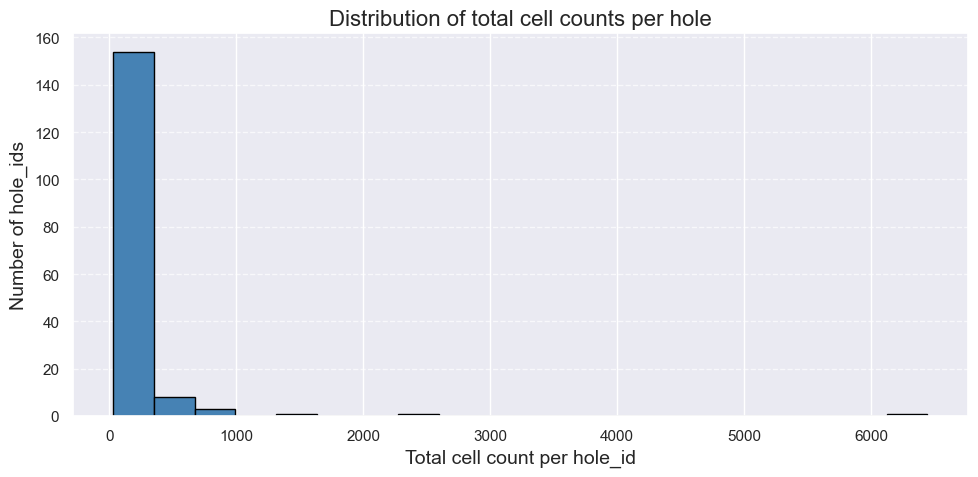

In [38]:
cell_counts_by_hole = micro_df.groupby("hole_id")["cell_count"].sum()
cell_counts_by_hole.head()


# Plot histogram
plt.figure(figsize=(10, 5))
plt.hist(cell_counts_by_hole, bins=20, color="steelblue", edgecolor="black")
plt.xlabel("Total cell count per hole_id", fontsize=14)
plt.ylabel("Number of hole_ids", fontsize=14)
plt.title("Distribution of total cell counts per hole", fontsize=16)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [39]:
# Step 1: Compute total cell count per hole
low_cell_holes = micro_df.groupby("hole_id")["cell_count"].sum()
low_cell_hole_ids = low_cell_holes[low_cell_holes < 200].index.tolist()

In [40]:
# Collect all polygon bounds
all_x, all_y = [], []

for i in low_cell_hole_ids:
    if i >= len(final_holes):
        continue
    poly = final_holes[i]
    if not poly.is_valid or poly.is_empty:
        continue
    if poly.geom_type == "MultiPolygon":
        for p in poly.geoms:
            if not p.is_valid or p.is_empty:
                continue
            x, y = p.exterior.xy
            all_x.extend(x)
            all_y.extend(y)
    elif poly.geom_type == "Polygon":
        x, y = poly.exterior.xy
        all_x.extend(x)
        all_y.extend(y)

In [41]:
print("Actually plotted holes:")
for i in low_cell_hole_ids:
    if i >= len(final_holes):
        print(f"Skipped {i} due to index out of bounds.")
        continue

    poly = final_holes[i]
    if not poly.is_valid or poly.is_empty:
        print(f"Skipped {i} due to invalid or empty geometry.")
        continue

    print(f"Plotted hole {i}")

Actually plotted holes:
Plotted hole 0
Plotted hole 2
Plotted hole 3
Plotted hole 4
Plotted hole 5
Plotted hole 6
Plotted hole 8
Plotted hole 9
Plotted hole 11
Plotted hole 12
Plotted hole 13
Plotted hole 14
Plotted hole 15
Plotted hole 17
Plotted hole 18
Plotted hole 20
Plotted hole 21
Plotted hole 22
Plotted hole 23
Plotted hole 24
Plotted hole 25
Plotted hole 26
Plotted hole 27
Plotted hole 28
Plotted hole 29
Plotted hole 30
Plotted hole 31
Plotted hole 32
Plotted hole 33
Plotted hole 34
Plotted hole 35
Plotted hole 36
Plotted hole 37
Plotted hole 38
Plotted hole 40
Plotted hole 42
Plotted hole 43
Plotted hole 44
Plotted hole 45
Plotted hole 48
Plotted hole 49
Plotted hole 50
Plotted hole 51
Plotted hole 52
Plotted hole 53
Plotted hole 55
Plotted hole 56
Plotted hole 57
Plotted hole 58
Plotted hole 59
Plotted hole 60
Plotted hole 61
Plotted hole 62
Plotted hole 63
Plotted hole 65
Plotted hole 66
Plotted hole 67
Plotted hole 68
Plotted hole 69
Plotted hole 70
Plotted hole 71
Plotted 

In [42]:
adata.var_names

Index(['AXL', 'SOX10', 'GZMB', 'CD3E', 'BCL2', 'pH3', 'CD8A', 'CD11C', 'CD45',
       'PCNA', 'CD20', 'FOXP3', 'PDL1', 'aSMA', 'HLAAB', 'PD1', 'NGFR',
       'CCND1', 'PDPN_b', 'VIM', 'LMNACB1', 'CD163', 'TIM3', 'S100A1', 'KIT',
       'PMEL', 'IRF1', 'KI67', 'CCNB1', 'CDKN1B', 'B2M_LL', 'CDKN1A', 'CCNE1',
       'ARG1', 'CCNA2', 'PS6', 'COX4', 'GAPDH', 'Gem', 'CD4_redo', 'pRB',
       'IDO1', 'MC_488', 'pSTAT1_b', 'MCT1_a', 'HLADRB1', 'MX1', 'CD206',
       'CD31_b', 'CAT', 'CD68', 'NQO1', 'CPT1A', 'HIF1A', 'MITF', 'HLADRA',
       'CTNNB1', 'S100B', 'pSTAT3', 'GLUT1', 'CD11B', 'IBA1', 'CD14', 'IFIT1'],
      dtype='object')

In [43]:
selected_markers = ["CD45", "CD3E", "CD8A", "CD11C", 
                    "CD163", "CD206", "CD31_b", "CD4_redo", "CD68", "FOXP3"]

for marker in selected_markers: 
    spc.prep.setGate(BRK6adataPh, marker, 0.5, marker_suffix = "_positive", debug = True)
    spc.prep.setGate(adata, marker, 0.5, marker_suffix = "_positive", debug = True)

CD45_positive
False    352105
True     191404
Name: count, dtype: int64
CD45_positive
False    92566
True     14596
Name: count, dtype: int64
CD3E_positive
False    445077
True      98432
Name: count, dtype: int64
CD3E_positive
False    98678
True      8484
Name: count, dtype: int64
CD8A_positive
False    450024
True      93485
Name: count, dtype: int64
CD8A_positive
False    98682
True      8480
Name: count, dtype: int64
CD11C_positive
False    368958
True     174551
Name: count, dtype: int64
CD11C_positive
False    83686
True     23476
Name: count, dtype: int64
CD163_positive
False    421158
True     122351
Name: count, dtype: int64
CD163_positive
False    97881
True      9281
Name: count, dtype: int64
CD206_positive
False    379884
True     163625
Name: count, dtype: int64
CD206_positive
False    95189
True     11973
Name: count, dtype: int64
CD31_b_positive
False    515240
True      28269
Name: count, dtype: int64
CD31_b_positive
False    106663
True        499
Name: count, dtype: 

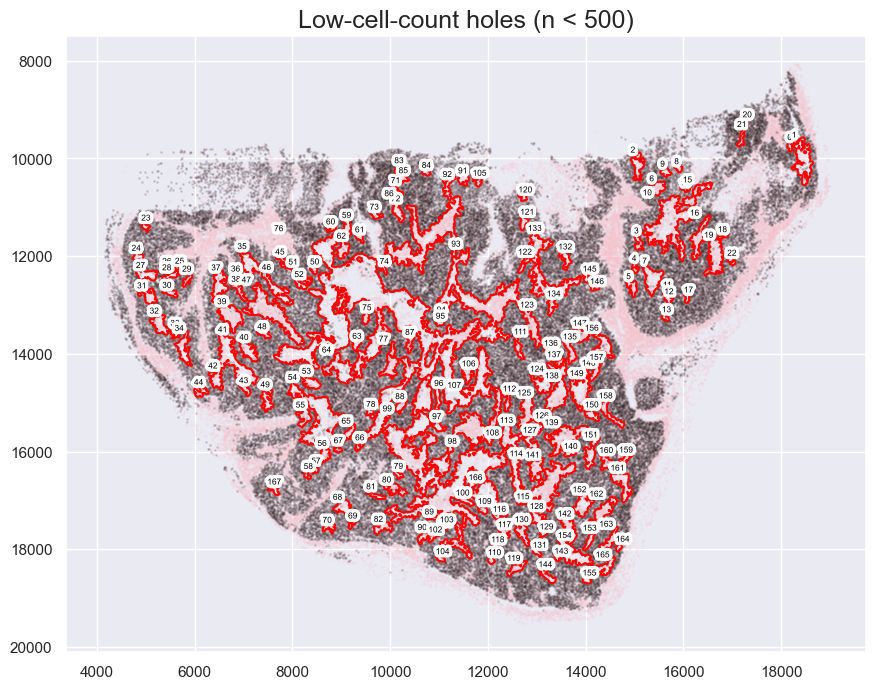

In [44]:
# Now plot only those using spc.plt
fig, ax = plt.subplots(figsize=(12, 8))
bg_xy = BRK6adataPh.obs[BRK6adataPh.obs["Domain_mod"] == "A"][["X_centroid", "Y_centroid"]].to_numpy()
ax.scatter(
    bg_xy[:, 0],
    bg_xy[:, 1],
    s=markersize,
    color="pink",
    marker="o",
    alpha=0.1,
    label="all cells",
)


xy = adata.obs[adata.obs.SOX10_positive][["X_centroid", "Y_centroid"]].to_numpy()
ax.scatter(
    xy[:, 0],
    xy[:, 1],
    s=markersize,
    color="black",
    marker="o",
    alpha=0.1,
    label="SOX10+ cells",
)

spc.plt.plotRegions(final_holes, 
                    colors_list=["red"], 
                    ax=ax,
                    fontsize = 6, 
                    add_label=True,
                    #label_color="black",     # More visible
                    #label_outline=True,      # 
                    )

ax.set_aspect("equal")
ax.invert_yaxis()
plt.title("Low-cell-count holes (n < 500)", fontsize=18)
plt.grid(True)

#plt.savefig("BRK6_cell_count_holes.png", dpi=600, bbox_inches="tight")

plt.show()

In [45]:
hole_areas = {
    hid: (geom.area if geom.is_valid else geom.buffer(0).area)
    for hid, geom in hole_id_map.items()
}

# Largest by area
largest_id = max(hole_areas, key=hole_areas.get)
largest_area = hole_areas[largest_id]

topN = 30
top_holes = sorted(hole_areas.items(), key=lambda x: x[1], reverse=True)[:topN]
for hid, a in top_holes:
    print(f"{hid}: {a:.2f}")

76: 5346005.01
99: 2171793.68
86: 720503.99
10: 548401.68
54: 545563.72
141: 461517.70
47: 401537.17
107: 386776.35
133: 379923.83
41: 288630.22
139: 229294.48
1: 212126.12
149: 197689.96
64: 186162.71
19: 183695.40
138: 173579.28
154: 169581.32
39: 159430.83
156: 154931.86
7: 141744.15
162: 135069.58
123: 134514.45
125: 131341.74
114: 129887.26
103: 124801.52
161: 124489.72
113: 124388.68
46: 121807.09
124: 120821.79
37: 118286.70


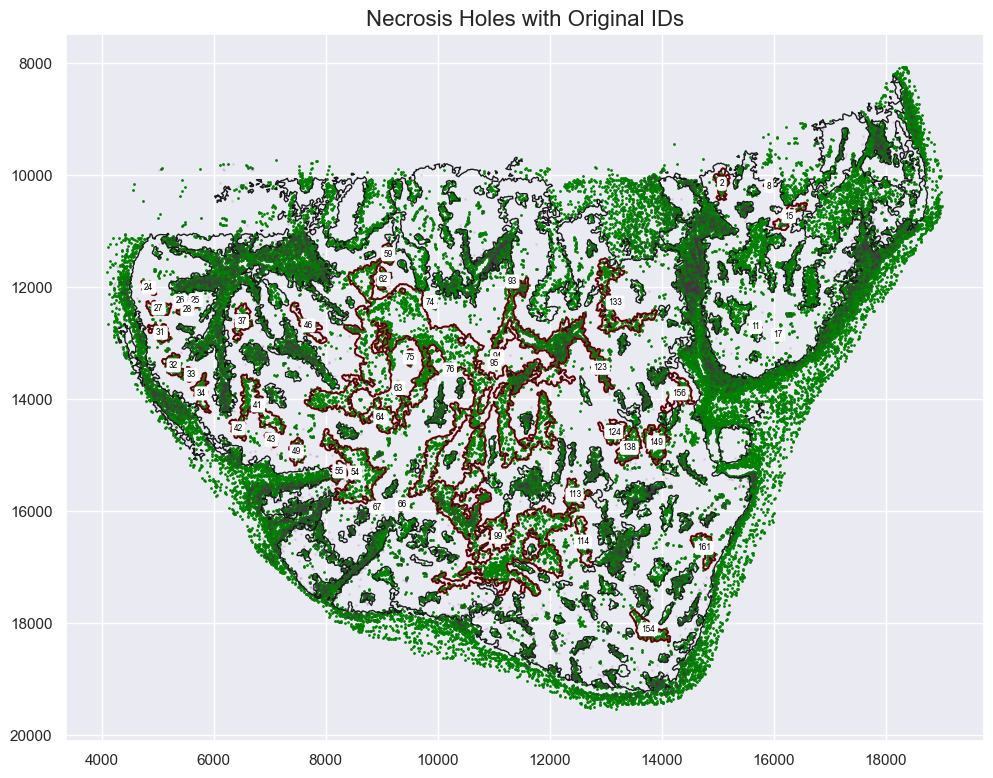

In [46]:
domainA_bg = BRK6adataPh[BRK6adataPh.obs.Domain_mod == "A"]

# now define necrosis region
necrosis_hole_ids = [7, 10, 16, 14, 23, 26, 30, 31, 24, 25, 27, 32, 33, 40, 41, 42, 48, 53, 54, 58, 61, 62, 63, 65, 66, 98, 73, 74,
                    75, 92, 93, 94, 98, 122, 132, 148, 1, 137, 153, 155,113, 160, 112, 45, 123, 36]

necrosis_hole_ids = [i + 1 for i in necrosis_hole_ids]


necrosis_hole_ids = list(dict.fromkeys(necrosis_hole_ids))

necrosis_hole_polys = [hole_id_map[i] for i in necrosis_hole_ids if i in hole_id_map]
hole_id_map = {i: hole for i, hole in enumerate(final_holes)}
fig, ax = plt.subplots(figsize=(12, 8))
# Plot SOX10+ cells
#xy = adata.obs[adata.obs.SOX10_positive][["X_centroid", "Y_centroid"]].to_numpy()
#ax.scatter(xy[:, 0], xy[:, 1], s=markersize, color="black", alpha=0.1, label="SOX10+ cells")

xy = domainA_bg.obs[domainA_bg.obs["SOX10_positive"] == False][["X_centroid", "Y_centroid"]].to_numpy()

ax.scatter(xy[:, 0], xy[:, 1], s=markersize, color="green", alpha=1, label="CD8+ cells")

xy = domainA_bg.obs[(domainA_bg.obs.CD45_positive) & (domainA_bg.obs.CD3E_positive) & (domainA_bg.obs.CD8A_positive)][["X_centroid", "Y_centroid"]].to_numpy()

ax.scatter(xy[:, 0], xy[:, 1], s=markersize, color="purple", alpha=0.1, label="CD8+ cells")

# Plot necrosis holes
spc.plt.plotRegions(necrosis_hole_polys, colors_list=["red"], ax=ax, add_label=False)
# Manually add correct labels
for hole_id in necrosis_hole_ids:
    if hole_id in hole_id_map:
        poly = hole_id_map[hole_id]
        if poly.is_empty or not poly.is_valid:
            continue
        centroid = poly.centroid
        ax.text(
            centroid.x,
            centroid.y,
            f"{hole_id}",
            color="black",
            fontsize=6,
            ha="center",
            va="center",
            bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3')  # Optional: background box for contrast
        )

spc.plt.plotBoundary(boundariesA_small, linewidth=1, color="k", ax=ax)
# Final plot tweaks
ax.set_aspect("equal")
ax.invert_yaxis()
plt.title("Necrosis Holes with Original IDs", fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.show()


In [47]:
from shapely.ops import unary_union
from shapely.prepared import prep
from shapely.geometry import Point, Polygon, MultiPolygon
from matplotlib.patches import Polygon as MplPolygon



# Necrosis = union of selected holes
necrosis_polys = [p if p.is_valid else p.buffer(0) for p in necrosis_hole_polys]
necrosis_union = unary_union(necrosis_polys) if len(necrosis_polys) > 0 else MultiPolygon([])


try:
    tumor_poly = boundariesA_small if isinstance(boundariesA_small, Polygon) else spc.spatial.bufferBoundary(boundariesA_small, 0)
except Exception:
    tumor_poly = spc.spatial.bufferBoundary(boundariesA_small, 0)

tumor_poly = tumor_poly if tumor_poly.is_valid else tumor_poly.buffer(0)

# Tumor mass region = tumor polygon minus necrosis
tumor_mass_poly = tumor_poly.difference(necrosis_union) if not necrosis_union.is_empty else tumor_poly

# Prepare for fast point-in-polygon tests
pre_nec = prep(necrosis_union)
pre_mass = prep(tumor_mass_poly)

In [48]:
df = domainA_bg.obs.copy()  # or use 'selection.obs' if you want your subset
xy = df[["X_centroid", "Y_centroid"]].to_numpy()
points = [Point(x, y) for x, y in xy]

in_necrosis = np.array([pre_nec.contains(pt) for pt in points])
in_mass     = np.array([pre_mass.contains(pt) for pt in points] & ~in_necrosis)
in_outside  = ~(in_necrosis | in_mass)

In [49]:
def bcol(df, name):
    return df[name].astype(bool) if name in df.columns else pd.Series(False, index=df.index)

# CD8 T mask (CD45+ & CD3E+ & CD8A+)
cd8_mask = (df["CD45_positive"].astype(bool) &
            df["CD3E_positive"].astype(bool) &
            df["CD8A_positive"].astype(bool)).to_numpy()


masks = {
    "CD8_T (CD45+CD3E+CD8A+)": (
        bcol(df, "CD45_positive") & bcol(df, "CD3E_positive") & bcol(df, "CD8A_positive")
    ),
    "M2_like (CD45+CD163+CD206+)": (
        bcol(df, "CD45_positive") & bcol(df, "CD163_positive") & bcol(df, "CD206_positive")
    ),
    "Dendritic/Myeloid (CD45+CD11C+)": (
        bcol(df, "CD45_positive") & bcol(df, "CD11C_positive")
    ),
    "Treg (CD45+CD4+FOXP3+)": (
        bcol(df, "CD45_positive") & bcol(df, "CD4_redo_positive") & bcol(df, "FOXP3_positive")
    ),
    "Endothelial (CD31+)": (
        bcol(df, "CD31_b_positive")
    ),
}

def region_counts(mask):
    return {
        "necrosis": int(np.sum(mask & in_necrosis)),
        "tumor_mass": int(np.sum(mask & in_mass)),
        "outside": int(np.sum(mask & in_outside)),
    }

In [50]:
from matplotlib.patches import Polygon as MplPolygon

def add_filled_geom(ax, geom, facecolor="red", edgecolor="k", alpha=0.4):
    """Add a filled Polygon/MultiPolygon to an axes."""
    if geom.is_empty:
        return
    gt = geom.geom_type
    if gt == "Polygon":
        patch = MplPolygon(list(geom.exterior.coords),
                           facecolor=facecolor, edgecolor=edgecolor, alpha=alpha)
        ax.add_patch(patch)
    elif gt in ("MultiPolygon", "GeometryCollection"):
        # In Shapely 2.x: iterate via .geoms; in 1.x it also works
        for sub in geom.geoms:
            add_filled_geom(ax, sub, facecolor=facecolor, edgecolor=edgecolor, alpha=alpha)
    else:
        # ignore non-(Multi)Polygon geometries
        pass

In [51]:
domainA = BRK6adataPh[BRK6adataPh.obs.Domain_mod == "A"]
domainA

View of AnnData object with n_obs × n_vars = 136355 × 64
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'phenotype', 'SOX10_positive', 'PMEL_positive', 'IFIT1_positive', 'NGFR_positive', 'S100A1_positive', 'S100B_positive', 'HIF1A_positive', 'KI67_positive', 'pH3_positive', 'PCNA_positive', 'CCND1_positive', 'CDKN1A_positive', 'CCNE1_positive', 'CCNA2_positive', 'CDKN1B_positive', 'Gem_positive', 'Domain', 'Domain_mod', 'X_um', 'Y_um', 'CD45_positive', 'CD3E_positive', 'CD8A_positive', 'CD11C_positive', 'CD163_positive', 'CD206_positive', 'CD31_b_positive', 'CD4_redo_positive', 'CD68_positive', 'FOXP3_positive'
    uns: 'all_markers', 'gates'

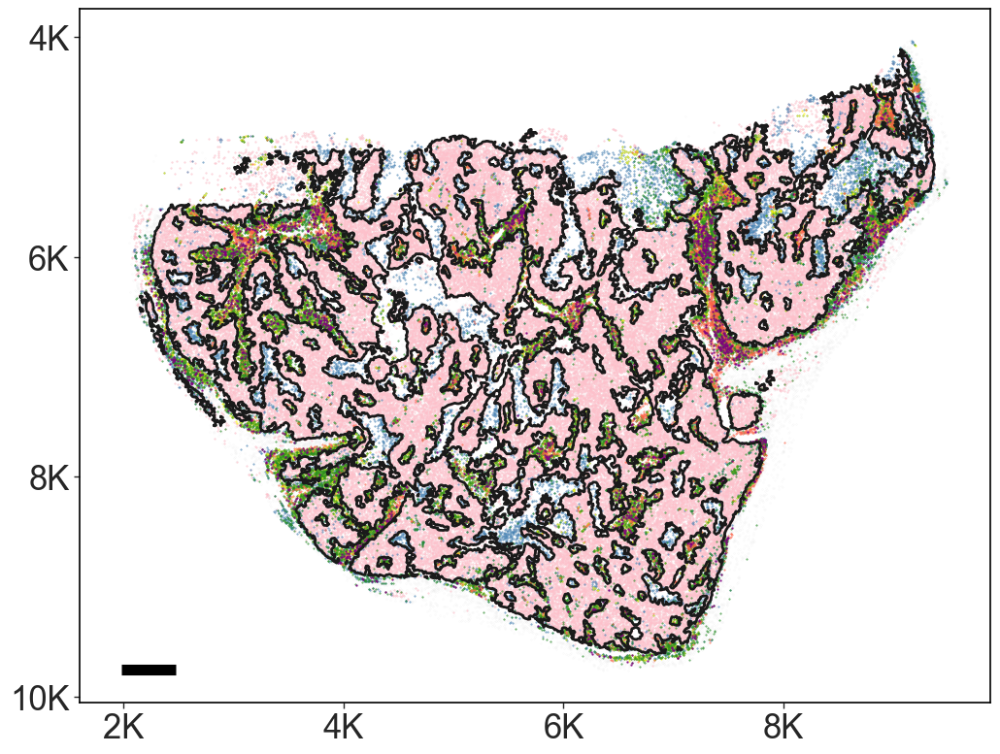

In [54]:
fig = plt.figure(figsize=(12, 8), facecolor="white")
ax = fig.add_subplot(111, facecolor="white")

# --- convert ALL rows to µm once (row-aligned with domainA.obs) ---
xy_um_full = to_um_xy(domainA.obs)  # uses your um_per_px

# ---- Background all points (µm) ----
ax.scatter(xy_um_full[:, 0], xy_um_full[:, 1],
           s=0.01, color="lightgrey", alpha=0.5, label="All cells")

# SOX10+ tumor cell
tmp = domainA[domainA.obs.SOX10_positive]
tmp_um = to_um_xy(tmp.obs)
ax.scatter(tmp_um[:, 0], tmp_um[:, 1],
           s=0.2, color="pink", alpha=0.8, label="SOX10+ tumor")

# Dendritic cells
tmp = domainA[(domainA.obs.CD45_positive) & (domainA.obs.CD11C_positive)]
tmp_um = to_um_xy(tmp.obs)
ax.scatter(tmp_um[:, 0], tmp_um[:, 1],
           s=0.2, color="steelblue", alpha=0.8, label="Dendritic cells")

# Macrophages
tmp = domainA[(domainA.obs.CD45_positive) & (domainA.obs.CD163_positive) & (domainA.obs.CD206_positive)]
tmp_um = to_um_xy(tmp.obs)
ax.scatter(tmp_um[:, 0], tmp_um[:, 1],
           s=0.2, color="yellow", alpha=0.8, label="Macrophages")

# CD8 T cells
tmp = domainA[(domainA.obs.CD3E_positive) & (domainA.obs.CD8A_positive)]
tmp_um = to_um_xy(tmp.obs)
ax.scatter(tmp_um[:, 0], tmp_um[:, 1],
           s=0.2, color="forestgreen", alpha=0.8, label="CD8 T cells")

# CD31+ cells
tmp = domainA[domainA.obs.CD31_b_positive]
tmp_um = to_um_xy(tmp.obs)
ax.scatter(tmp_um[:, 0], tmp_um[:, 1],
           s=0.2, color="tomato", alpha=0.8, label="CD31+")

# Tregs
tmp = domainA[(domainA.obs.CD3E_positive) & (domainA.obs.CD4_redo_positive) & (domainA.obs.FOXP3_positive)]
tmp_um = to_um_xy(tmp.obs)
ax.scatter(tmp_um[:, 0], tmp_um[:, 1],
           s=0.5, color="purple", alpha=0.8, label="Tregs")

# ---- Boundary in µm ----
try:
    boundariesA_small_um_MP  # already made earlier
except NameError:
    boundariesA_small_um = to_um_flat_any(boundariesA_small)
    boundariesA_small_um_MP = MultiPolygon([p for p in boundariesA_small_um if not p.is_empty])

spc.plt.plotBoundary(boundariesA_small_um_MP, linewidth=2, color="k", ax=ax)

# ---- Axes formatting (kµm) ----
ax.xaxis.set_major_locator(MultipleLocator(2000))
ax.yaxis.set_major_locator(MultipleLocator(2000))
ax.xaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.yaxis.set_major_formatter(FuncFormatter(fmt_k_um))

#ax.grid(color='black', linestyle='--', linewidth=0.5)
ax.tick_params(axis='x', labelsize=25)
ax.tick_params(axis='y', labelsize=25)

# ---- Aspect & orientation ----
ax.set_aspect("equal")
ax.invert_yaxis()

# ---- Frame ----
for side in ("left", "bottom", "right", "top"):
    ax.spines[side].set_visible(True)
    ax.spines[side].set_linewidth(1.2)
    ax.spines[side].set_color("black")
ax.tick_params(direction="out", length=4, width=1, bottom=True, left=True, top=False, right=False)

plt.subplots_adjust(bottom=0.15)
plt.tight_layout()

# ---- 500 µm scale bar (bottom-left, unlabeled) ----
draw_scale_bar(ax, pad_x_um=300, pad_y_um=300, bar_len_um=500, show_label=False)

# ---- Save (TIFF, high-res) ----
plt.savefig("BRK6_domainA_celltypes_Fig2C_um.tif",
            dpi=600, bbox_inches="tight", facecolor="white", format="tiff")
plt.show()
plt.close(fig)

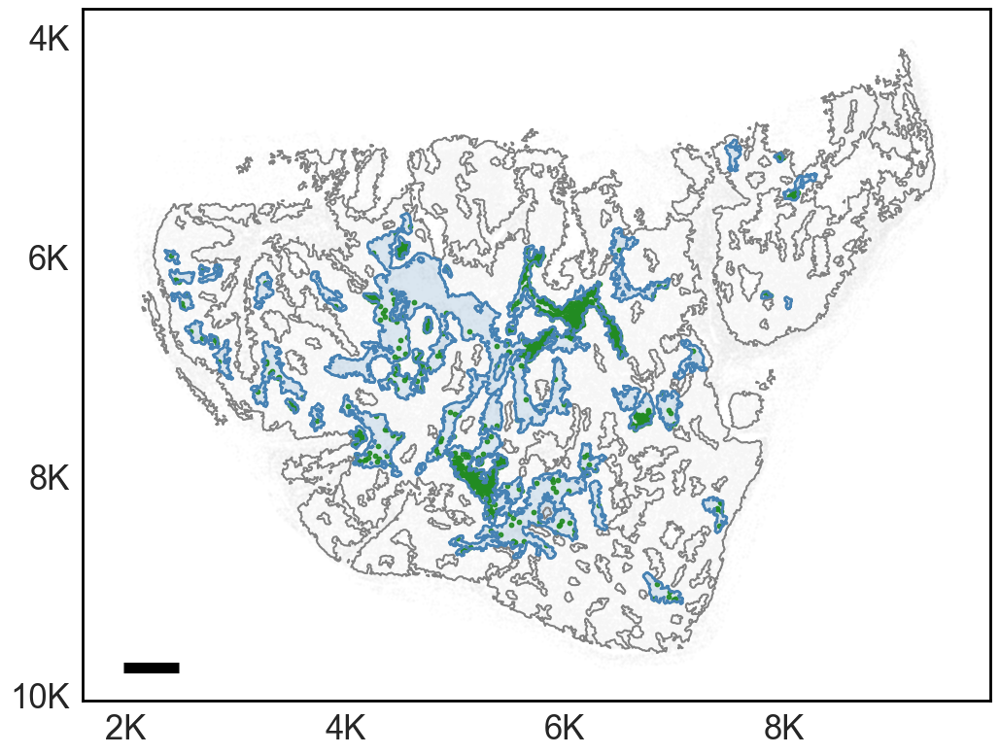

In [53]:
# ==== CONFIG ====
um_per_px       = 0.5      # µm per pixel (set to your actual scale)
BAR_LEN_UM      = 500      # scale bar length
PAD_X_UM        = 300
PAD_Y_UM        = 300
markersize_bg   = 0.1
markersize_tum  = 0.1
markersize_cd8  = 10.0
figsize         = (12, 8)
out_path        = "BRK6_domainA_necrosis_um.tif"

# ==== IMPORTS ====
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FuncFormatter
import matplotlib.patches as patches
import matplotlib.patheffects as pe
from shapely.geometry import Polygon, MultiPolygon, GeometryCollection
from shapely.geometry.base import BaseGeometry
from shapely.affinity import scale as shp_scale

# ==== HELPERS ====
def iter_polys_any(geom: BaseGeometry):
    """Yield Polygon(s) from any Shapely geometry."""
    if geom is None or geom.is_empty:
        return
    gt = geom.geom_type
    if gt == "Polygon":
        yield geom
    elif gt == "MultiPolygon":
        for g in geom.geoms:
            if not g.is_empty:
                yield g
    elif gt == "GeometryCollection":
        for g in geom.geoms:
            yield from iter_polys_any(g)

def to_um_flat_any(geoms_or_geom, xfact=um_per_px, yfact=um_per_px):
    """Scale pixels -> µm, flatten nested geometries."""
    if isinstance(geoms_or_geom, BaseGeometry):
        geoms = [geoms_or_geom]
    else:
        try:
            geoms = list(geoms_or_geom)
        except TypeError:
            geoms = [geoms_or_geom]

    flat = []
    for g in geoms:
        if g is None:
            continue
        g_um = shp_scale(g, xfact=xfact, yfact=yfact, origin=(0, 0))
        flat.extend(iter_polys_any(g_um))
    return flat

def to_multipolygon_list(geom_list):
    """Ensure every geometry is a MultiPolygon for plotRegions compatibility."""
    safe = []
    for g in geom_list:
        if g is None or g.is_empty:
            continue
        if isinstance(g, Polygon):
            safe.append(MultiPolygon([g]))
        elif isinstance(g, MultiPolygon):
            safe.append(g)
        elif isinstance(g, GeometryCollection):
            polys = [p for p in g.geoms if isinstance(p, Polygon) and not p.is_empty]
            if polys:
                safe.append(MultiPolygon(polys))
    return safe

def fmt_k_um(x, pos=None):
    return f"{x/1000:.0f}K"

def _bottom_left_coords(ax, pad_x_um, pad_y_um, bar_len_um):
    """
    Return (x0, x1, y0) for a bottom-left scale bar of length `bar_len_um` (µm),
    placed pad_x_um from the visual LEFT edge and pad_y_um from the visual BOTTOM.
    Works regardless of axis limit order and with axis inversions.
    Call AFTER you set limits/inversions.
    """
    x0_lim, x1_lim = ax.get_xlim()
    y0_lim, y1_lim = ax.get_ylim()

    # Use order-agnostic low/high
    x_low, x_high = (x0_lim, x1_lim) if x0_lim < x1_lim else (x1_lim, x0_lim)
    y_low, y_high = (y0_lim, y1_lim) if y0_lim < y1_lim else (y1_lim, y0_lim)

    xin = ax.xaxis_inverted()
    yin = ax.yaxis_inverted()

    # visual edges in data coords
    x_left   = x_high if xin else x_low
    y_bottom = y_high if yin else y_low

    # start at left + pad; extend visually to the right by bar_len_um
    x0 = x_left + (-pad_x_um if xin else pad_x_um)
    x1 = x0     -  bar_len_um if xin else x0 + bar_len_um

    # place above the visual bottom by pad
    y0 = y_bottom + (-pad_y_um if yin else pad_y_um)

    # clamp inside current view
    if not xin:
        if x0 < x_low:   x0, x1 = x_low,            x_low + bar_len_um
        if x1 > x_high:  x0, x1 = x_high-bar_len_um, x_high
    else:
        if x0 > x_left:  x0, x1 = x_left,           x_left - bar_len_um
        if x1 < x_high:  x0, x1 = x_high+bar_len_um, x_high

    return x0, x1, y0


def draw_scale_bar(ax, pad_x_um=PAD_X_UM, pad_y_um=PAD_Y_UM,
                   bar_len_um=BAR_LEN_UM, show_label=False, label_fontsize=20):
    """
    Draw a high-contrast horizontal scale bar at the BOTTOM-LEFT.
    No label by default. Call AFTER setting limits and any invert_* calls.
    """
    x0, x1, y0 = _bottom_left_coords(ax, pad_x_um, pad_y_um, bar_len_um)

    # white underlay + black bar
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="white", linewidth=10, zorder=10)
    ax.hlines(y=y0, xmin=x0, xmax=x1, colors="black", linewidth=8,  zorder=11)

    if show_label:
        x_mid = (x0 + x1) / 2.0
        dy = 0.25 * bar_len_um * (-1 if ax.yaxis_inverted() else 1)
        txt = ax.text(x_mid, y0 + dy, f"{int(bar_len_um)} µm",
                      ha="center", va="bottom", fontsize=label_fontsize, color="black", zorder=12)
        txt.set_path_effects([pe.withStroke(linewidth=4, foreground="white")])

def to_um_xy(df, cols=("X_centroid", "Y_centroid")):
    arr = df[list(cols)].to_numpy(dtype=float)
    return arr * um_per_px

# ==== CONVERT DATA TO µm ====
bg_um    = to_um_xy(domainA.obs)
tumor_um = to_um_xy(domainA.obs[domainA.obs.SOX10_positive])
cd8_mask = (domainA.obs.CD45_positive) & (domainA.obs.CD3E_positive) & (domainA.obs.CD8A_positive)
cd8_um   = to_um_xy(domainA.obs[cd8_mask])

try:
    xy_um_full  = to_um_xy(domainA.obs)
    cd8_plot_um = xy_um_full[cd8_mask & in_necrosis]
except NameError:
    cd8_plot_um = cd8_um

necrosis_hole_polys_um = to_um_flat_any(necrosis_hole_polys)
necrosis_polys_um      = to_um_flat_any(necrosis_polys)
boundariesA_small_um   = to_um_flat_any(boundariesA_small)

# Wrap geometries for plotting
from shapely.geometry import MultiPolygon
boundariesA_small_um_MP   = MultiPolygon([p for p in boundariesA_small_um if not p.is_empty])
necrosis_regions_um_MP_list = to_multipolygon_list(necrosis_polys_um)
necrosis_holes_um_MP_list   = to_multipolygon_list(necrosis_hole_polys_um)

# ==== PLOTTING ====
fig = plt.figure(figsize=figsize, facecolor="white")
ax = fig.add_subplot(111, facecolor="white")
plt.rcParams['savefig.transparent'] = False
fig.patch.set_facecolor("white")
ax.set_facecolor("white")
ax.add_patch(patches.Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                               facecolor="white", edgecolor="none", zorder=0))

# Background & tumor cells
ax.scatter(bg_um[:, 0], bg_um[:, 1], s=markersize_bg, color="lightgrey", alpha=0.1)
ax.scatter(tumor_um[:, 0], tumor_um[:, 1], s=markersize_tum, color="white", alpha=0.3)

# Necrosis areas
for mp in necrosis_holes_um_MP_list:
    for poly in mp.geoms:
        add_filled_geom(ax, poly, facecolor="steelblue", edgecolor="k", alpha=0.2)

# CD8 cells
ax.scatter(cd8_plot_um[:, 0], cd8_plot_um[:, 1],
           s=markersize_cd8, color="forestgreen", alpha=0.9, label="CD8 T in necrosis")

# Boundaries & necrosis outlines
spc.plt.plotBoundary(boundariesA_small_um_MP, linewidth=1.5, color="grey", ax=ax)
spc.plt.plotRegions(necrosis_regions_um_MP_list, colors_list=["steelblue"],
                    ax=ax, add_label=False, linewidth=2)

# Axes formatting
ax.xaxis.set_major_locator(MultipleLocator(2000))
ax.yaxis.set_major_locator(MultipleLocator(2000))
ax.xaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.yaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.tick_params(axis='x', labelsize=25)
ax.tick_params(axis='y', labelsize=25)
ax.set_aspect("equal")
ax.invert_yaxis()
#ax.grid(True, linestyle="--", alpha=0.4, zorder=1)

# Frame
for side in ("left", "bottom", "right", "top"):
    ax.spines[side].set_visible(True)
    ax.spines[side].set_linewidth(2)
    ax.spines[side].set_color("black")

# Scale bar
draw_scale_bar(ax, pad_x_um=PAD_X_UM, pad_y_um=PAD_Y_UM, bar_len_um=BAR_LEN_UM, show_label=False)

plt.tight_layout()
plt.savefig(
    out_path,              # defined at the top, e.g. "BRK6_domainA_tumor_mass_um.tif"
    dpi=600,               # high-resolution
    bbox_inches="tight",
    facecolor="white",
    format="tiff"          # explicitly enforce TIFF output
)
plt.show()
plt.close(fig)

In [55]:
from shapely.ops import unary_union
from shapely.geometry import Point, MultiPolygon

# --- gather necrosis polygons in µm and union them ---
_all_nec_polys = []
for mp in necrosis_holes_um_MP_list:
    _all_nec_polys.extend([p for p in mp.geoms if not p.is_empty])
for mp in necrosis_regions_um_MP_list:
    if isinstance(mp, MultiPolygon):
        _all_nec_polys.extend([p for p in mp.geoms if not p.is_empty])

necrosis_union_um = unary_union(_all_nec_polys)  # MultiPolygon/Polygon

# --- coords in µm (row-aligned with domainA.obs) ---
xy_um_full = to_um_xy(domainA.obs)                # all cells (µm)
cd8_um      = to_um_xy(domainA.obs[cd8_mask])     # CD8 cells (µm) — using your cd8_mask from above

# --- point-in-necrosis mask (include boundaries via .covers) ---
in_necrosis_mask = np.fromiter(
    (necrosis_union_um.covers(Point(x, y)) for x, y in xy_um_full),
    dtype=bool,
    count=xy_um_full.shape[0]
)
non_necrosis_mask = ~in_necrosis_mask
sox10_neg_mask = ~domainA.obs.SOX10_positive.values
non_necrosis_sox10neg_mask = non_necrosis_mask & sox10_neg_mask




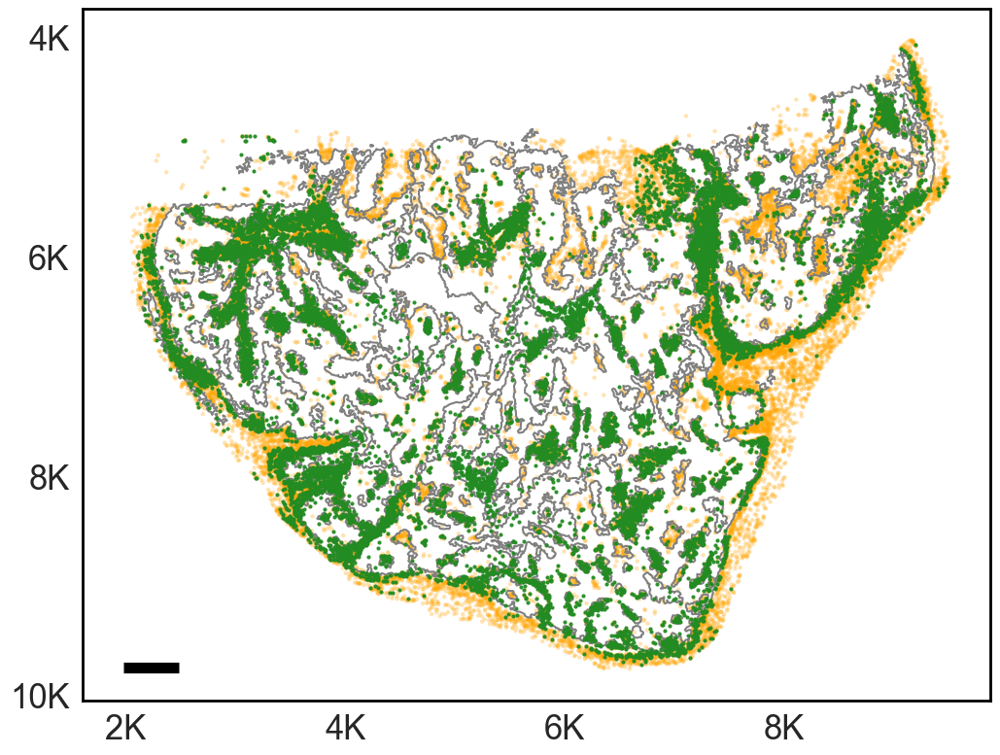

In [ ]:
# --- plot: non-necrotic background + all CD8 on top ---
fig, ax = plt.subplots(figsize=figsize, facecolor="white")
ax.set_facecolor("white"); fig.patch.set_facecolor("white")
ax.add_patch(patches.Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                               facecolor="white", edgecolor="none", zorder=0))


# non-necrotic background
ax.scatter(
    xy_um_full[non_necrosis_sox10neg_mask, 0],
    xy_um_full[non_necrosis_sox10neg_mask, 1],
    s= 10,
    facecolors="orange",   # <-- solid orange fill
    edgecolors="none",     # <-- no edge outline
    alpha=0.3,
    zorder=1
)

# CD8 T cells (all)
if cd8_um.size:
    ax.scatter(cd8_um[:, 0], cd8_um[:, 1],
               s= 4, color="forestgreen", alpha=0.9, zorder=3)

# boundary (in µm)
spc.plt.plotBoundary(boundariesA_small_um_MP, linewidth=1.5, color="grey", ax=ax)

# axes, style
ax.xaxis.set_major_locator(MultipleLocator(2000))
ax.yaxis.set_major_locator(MultipleLocator(2000))
ax.xaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.yaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.tick_params(axis='x', labelsize=25)
ax.tick_params(axis='y', labelsize=25)

ax.set_aspect("equal"); ax.invert_yaxis()
for side in ("left", "bottom", "right", "top"):
    ax.spines[side].set_visible(True); ax.spines[side].set_linewidth(2); ax.spines[side].set_color("black")

# scale bar (bottom-left, unlabeled)
draw_scale_bar(ax, pad_x_um=PAD_X_UM, pad_y_um=PAD_Y_UM, bar_len_um=BAR_LEN_UM, show_label=False)

plt.tight_layout()
plt.savefig("BRK6_domainA_non_necrosis_bg__CD8_all_um.tif",
            dpi=600, bbox_inches="tight", facecolor="white", format="tiff")
plt.show(); plt.close(fig)

In [56]:
from shapely.geometry import Point, MultiPolygon
from shapely.ops import unary_union
from scipy.spatial import Delaunay
import numpy as np

# Points to mask (µm coords, already in your workspace)
pts = xy_um_full[non_necrosis_sox10neg_mask]  # (N, 2)

# --- Option A: Buffer–Union mask (simple & robust) ---
buffer_um   = 20.0          # tune: larger -> smoother/wider mask
min_area_um2 = 5_000.0      # remove tiny islands after union

if pts.size == 0:
    mask_union = MultiPolygon()
else:
    circles = (Point(x, y).buffer(buffer_um, resolution=8) for x, y in pts)
    mask_union = unary_union(list(circles))
    # Remove tiny components
    if isinstance(mask_union, MultiPolygon):
        mask_union = MultiPolygon([p for p in mask_union.geoms if p.area >= min_area_um2])
    elif mask_union.area < min_area_um2:
        mask_union = MultiPolygon()  # drop if too small

# Clip to your domain boundary if desired
if not boundariesA_small_um_MP.is_empty and not mask_union.is_empty:
    mask_union = mask_union.intersection(boundariesA_small_um_MP)

# --- Option B: Concave hull (alpha-shape) mask (tighter boundary) ---
def alpha_shape_polygons(points, alpha):
    """
    Return a MultiPolygon of the alpha-shape (concave hull).
    alpha ~ 1 / (edge_length_scale^2). Larger alpha -> tighter hull.
    """
    if len(points) < 4:
        return MultiPolygon([Point(points[0]).buffer(1e-6)]) if len(points) > 0 else MultiPolygon()

    tri = Delaunay(points)
    triangles = points[tri.simplices]  # (M, 3, 2)

    # edge lengths per triangle
    a = np.linalg.norm(triangles[:, 0] - triangles[:, 1], axis=1)
    b = np.linalg.norm(triangles[:, 1] - triangles[:, 2], axis=1)
    c = np.linalg.norm(triangles[:, 2] - triangles[:, 0], axis=1)

    # triangle area (Heron)
    s = 0.5 * (a + b + c)
    area = np.maximum(s * (s - a) * (s - b) * (s - c), 0.0)
    area = np.sqrt(area)

    # circumradius R = (abc) / (4A); keep triangles with R < 1/alpha
    with np.errstate(divide='ignore', invalid='ignore'):
        R = (a * b * c) / (4.0 * area)
    keep = np.isfinite(R) & (R < (1.0 / alpha))

    from shapely.geometry import Polygon
    polys = [Polygon(t) for t in triangles[keep] if Polygon(t).is_valid and not Polygon(t).is_empty]
    if not polys:
        return MultiPolygon()

    hull = unary_union(polys).buffer(0)  # merge + clean
    # normalize to MultiPolygon
    if isinstance(hull, MultiPolygon):
        return hull
    else:
        return MultiPolygon([hull])

# Heuristic alpha based on local spacing (90th pct of kNN distance)
if pts.size:
    from scipy.spatial import cKDTree
    kdt = cKDTree(pts)
    k = min(6, max(3, len(pts) - 1))
    knn_d, _ = kdt.query(pts, k=k)
    scale = np.percentile(knn_d[:, -1], 90)  # µm
    alpha  = 1.0 / (max(scale, 1e-6) ** 2)   # convert to 1/µm^2

    mask_alpha = alpha_shape_polygons(pts, alpha=alpha)
    # remove tiny components + clip to domain
    min_area_um2_alpha = 5_000.0
    if isinstance(mask_alpha, MultiPolygon):
        mask_alpha = MultiPolygon([p for p in mask_alpha.geoms if p.area >= min_area_um2_alpha])
    elif not mask_alpha.is_empty and mask_alpha.area < min_area_um2_alpha:
        mask_alpha = MultiPolygon()

    if not boundariesA_small_um_MP.is_empty and not mask_alpha.is_empty:
        mask_alpha = mask_alpha.intersection(boundariesA_small_um_MP)
else:
    mask_alpha = MultiPolygon()

# --- Plot either mask on your existing axes ---
# Buffer–Union mask (filled translucent)
for poly in (mask_union.geoms if isinstance(mask_union, MultiPolygon) else [mask_union]):
    if not poly.is_empty:
        add_filled_geom(ax, poly, facecolor="orange", edgecolor="none", alpha=0.15
        #, zorder=0.8
        )

# Concave hull outline on top (to compare)
for poly in (mask_alpha.geoms if isinstance(mask_alpha, MultiPolygon) else [mask_alpha]):
    if not poly.is_empty:
        ax.plot(*poly.exterior.xy, color="orange", linewidth=1.2, alpha=0.9, zorder=2.5)

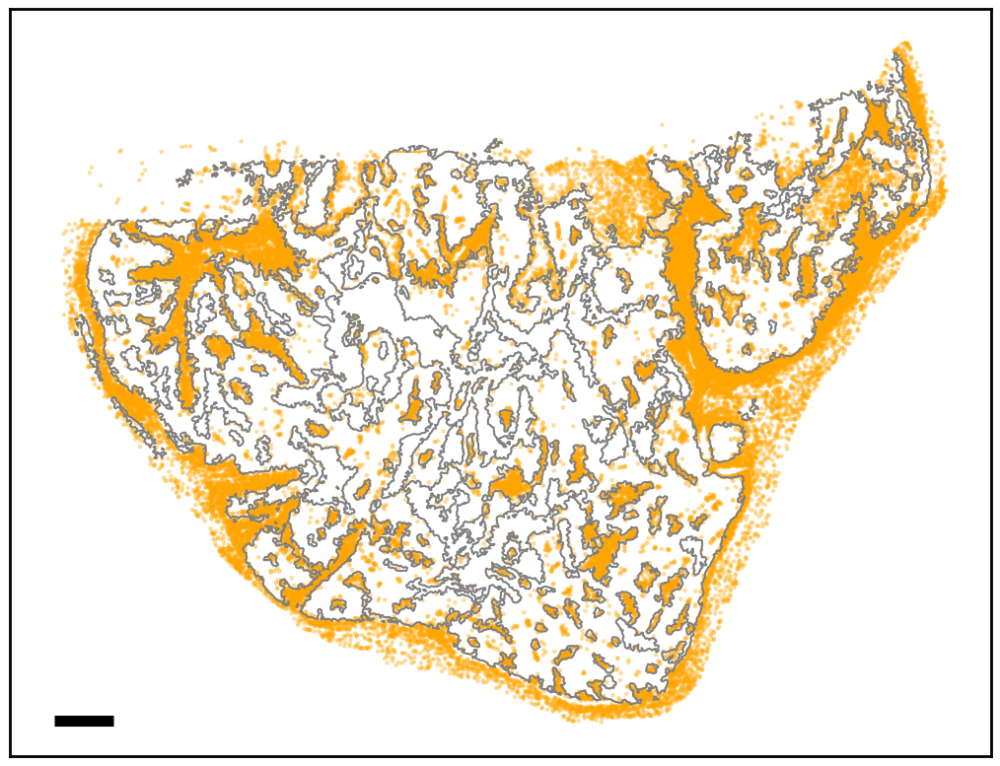

In [57]:
# ---- PLOT MASKS + BACKGROUND ----
fig, ax = plt.subplots(figsize=figsize, facecolor="white")
ax.set_facecolor("white")

# Non-necrotic SOX10- background points (orange dots)
ax.scatter(
    xy_um_full[non_necrosis_sox10neg_mask, 0],
    xy_um_full[non_necrosis_sox10neg_mask, 1],
    s=10, facecolors="orange", edgecolors="none", alpha=0.4, zorder=1
)

# Buffer–Union fill (orange, translucent)
if ('mask_union' in locals()) and (not getattr(mask_union, "is_empty", True)):
    polys = mask_union.geoms if hasattr(mask_union, "geoms") else [mask_union]
    for poly in polys:
        if not poly.is_empty:
            add_filled_geom(ax, poly, facecolor="orange", edgecolor="none", alpha=0.15)

# Concave hull (alpha-shape) outline (orange stroke)
if ('mask_alpha' in locals()) and (not getattr(mask_alpha, "is_empty", True)):
    polys = mask_alpha.geoms if hasattr(mask_alpha, "geoms") else [mask_alpha]
    for poly in polys:
        if not poly.is_empty:
            ax.plot(*poly.exterior.xy, color="orange", linewidth=1.2, alpha=0.9)

# Boundary in µm
spc.plt.plotBoundary(boundariesA_small_um_MP, linewidth=1.5, color="grey", ax=ax)

# Axes formatting
ax.set_aspect("equal"); ax.invert_yaxis()
ax.xaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.yaxis.set_major_formatter(FuncFormatter(fmt_k_um))
for side in ("left", "bottom", "right", "top"):
    ax.spines[side].set_visible(True); ax.spines[side].set_linewidth(2); ax.spines[side].set_color("black")

# Optional: hide tick labels for a clean panel
ax.set_xticks([]); ax.set_yticks([])

# Scale bar (bottom-left, unlabeled)
draw_scale_bar(ax, pad_x_um=PAD_X_UM, pad_y_um=PAD_Y_UM, bar_len_um=BAR_LEN_UM, show_label=False)

plt.tight_layout()
#plt.savefig("BRK6_domainA_non_necrosis_SOX10neg_mask.tif",
 #           dpi=600, bbox_inches="tight", facecolor="white", format="tiff")
plt.show()
plt.close(fig)

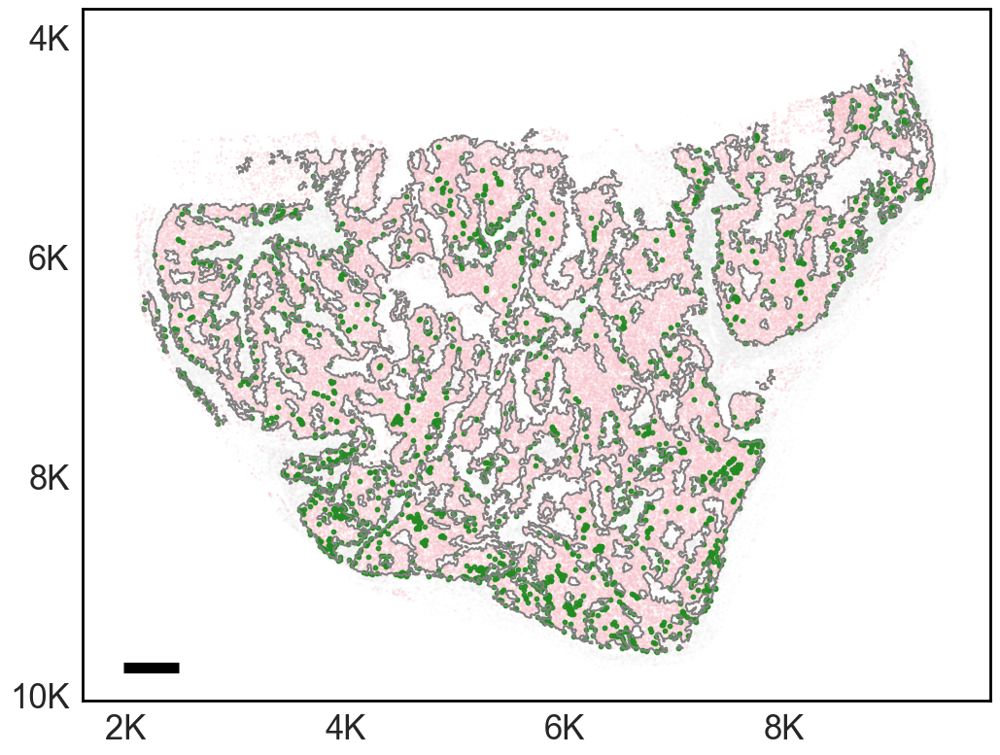

In [58]:

#out_path = "BRK6_domainA_tumor_mass_um.tif"

# ---------- PREP (aligned arrays/masks) ----------
xy_um_full = to_um_xy(domainA.obs)  # Nx2 in µm, row-aligned with domainA.obs

# masks (row-aligned)
tumor_mask = domainA.obs.SOX10_positive.values
cd8_mask   = (domainA.obs.CD45_positive.values &
              domainA.obs.CD3E_positive.values &
              domainA.obs.CD8A_positive.values)

# if your filter mask is named in_mass (or in_necrosis), use it; else default to all False
try:
    in_mass_mask = np.asarray(in_mass, dtype=bool)
except NameError:
    try:
        in_mass_mask = np.asarray(in_necrosis, dtype=bool)
    except NameError:
        in_mass_mask = np.zeros(len(domainA.obs), dtype=bool)  # none selected

# ---------- PLOTTING (respects your filters) ----------
fig = plt.figure(figsize=figsize, facecolor="white")
ax = fig.add_subplot(111, facecolor="white")
plt.rcParams['savefig.transparent'] = False
fig.patch.set_facecolor("white")
ax.set_facecolor("white")
ax.add_patch(patches.Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                               facecolor="white", edgecolor="none", zorder=0))

# all cells (no filter)
ax.scatter(xy_um_full[:, 0], xy_um_full[:, 1],
           s=markersize_bg, color="lightgrey", alpha=0.1, label="All cells")

# SOX10+ tumor (no filter)
ax.scatter(xy_um_full[tumor_mask, 0], xy_um_full[tumor_mask, 1],
           s=markersize_tum, color="lightpink", alpha=0.5, label="SOX10+ cells")

# CD8 T cells **filtered** by your mask (e.g., in_mass)
ax.scatter(xy_um_full[cd8_mask & in_mass_mask, 0], xy_um_full[cd8_mask & in_mass_mask, 1],
           s=markersize_cd8, color="forestgreen", alpha=0.9, label="CD8 T (filtered)")

# boundaries / regions in µm (use your already-built *_um or *_MP variables)
spc.plt.plotBoundary(boundariesA_small_um_MP, linewidth=1.5, color="grey", ax=ax)

# ticks as Kµm
ax.xaxis.set_major_locator(MultipleLocator(2000))
ax.yaxis.set_major_locator(MultipleLocator(2000))
ax.xaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.yaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.tick_params(axis='x', labelsize=25)
ax.tick_params(axis='y', labelsize=25)

ax.set_aspect("equal")
ax.invert_yaxis()
#ax.grid(True, linestyle="--", alpha=0.4, zorder=1)

for side in ("left", "bottom", "right", "top"):
    ax.spines[side].set_visible(True)
    ax.spines[side].set_linewidth(2)
    ax.spines[side].set_color("black")

# bottom-left 500 µm bar
draw_scale_bar(ax, pad_x_um=PAD_X_UM, pad_y_um=PAD_Y_UM, bar_len_um=BAR_LEN_UM, show_label=False)

plt.tight_layout()
plt.savefig("BRK6_domainA_tumor_mass_cd8_um.tif", dpi=600, bbox_inches="tight", facecolor="white", format="tiff")
plt.show()
plt.close(fig)


[cd31] edges n=3403 | p25=20.2 µm p50=45.2 µm p75=171.1 µm | kept=2510


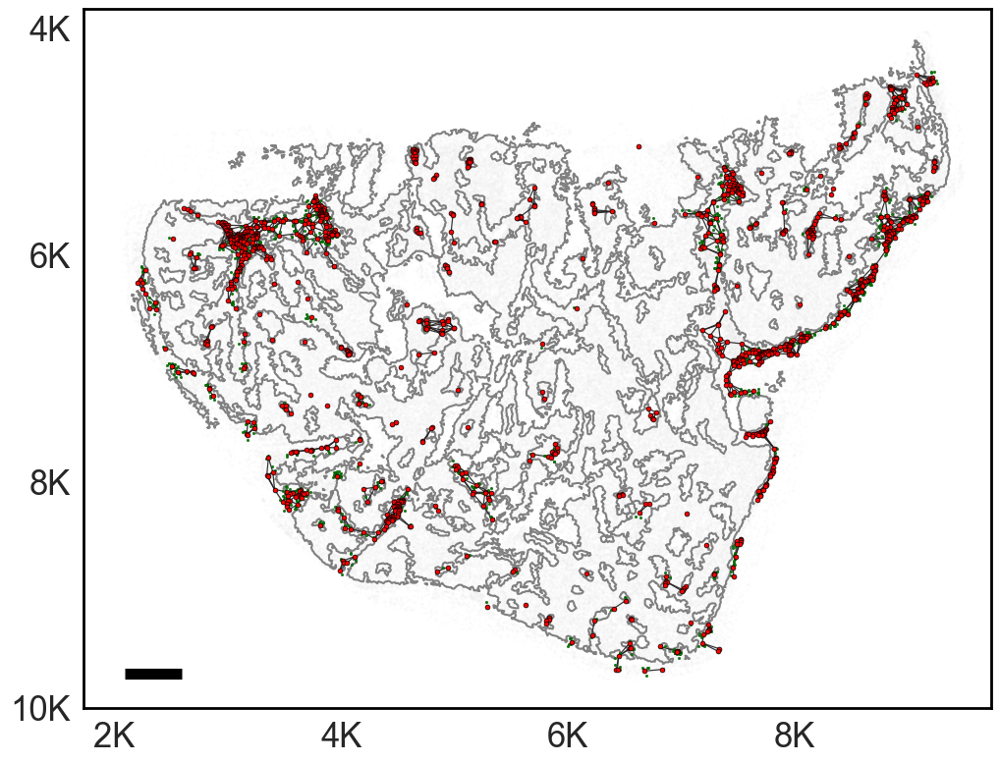

In [59]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.ticker import MultipleLocator, FuncFormatter
from scipy.spatial import Delaunay, cKDTree, distance_matrix
import matplotlib.patches as patches

# ---------------- Config (µm space) ----------------
R_NEIGHBOR_UM = 50        # neighbor radius *in microns*
K_FOR_SCALE   = 4         # K for local scale per CD31 point (min 2)
LOCAL_PCTL    = 90        # percentile of local KNN scale => adaptive edge length threshold
FALLBACK_PCTL = 70        # fallback if none kept

EDGE_COLOR  = "#222222"
EDGE_WIDTH  = 0.9
EDGE_ALPHA  = 0.9

figsize = (12, 8)
BAR_LEN_UM = 500          # scale bar length (µm)
PAD_X_UM   = 300
PAD_Y_UM   = 300

# Phenotypes + colors
highlight_phenotypes = [
    "Endothelial cells",
    #"CD11C+ Myeloid",
    #"CD163+ or CD206+ Macrophages",
    #"Treg",
    "CD8+ T cells"
]
highlight_colors = {
    "Endothelial cells": "red",
    "CD8+ T cells": "green",
    #"CD11C+ Myeloid": "blue",
    #"CD163+ or CD206+ Macrophages": "wheat",
    #"Treg": "pink",
}

# ---------------- Data prep (convert to µm) ----------------
xy_um_full = to_um_xy(domainA.obs)  # Nx2 (µm), row-aligned with domainA.obs

# CD31+ endothelial cells
if "phenotype" in domainA.obs.columns:
    cd31_mask = (domainA.obs["phenotype"] == "Endothelial cells")
elif "CD31_b_positive" in domainA.obs.columns:
    cd31_mask = domainA.obs["CD31_b_positive"].astype(bool)
else:
    raise ValueError("Couldn't find 'phenotype' or 'CD31_b_positive' in domainA.obs")

cd31_cells      = domainA[cd31_mask]
cd31_coords_um  = to_um_xy(cd31_cells.obs)

if cd31_coords_um.shape[0] < 3:
    raise ValueError("Need at least 3 CD31+ points for Delaunay triangulation.")

# Neighbor cells within R_NEIGHBOR_UM of ANY CD31+ cell (µm distances)
dists_um        = distance_matrix(cd31_coords_um, xy_um_full)       # (n_cd31, n_all)
within_rad_mask = (dists_um <= R_NEIGHBOR_UM).any(axis=0)           # (n_all,)
neighbor_cells  = domainA[within_rad_mask]

# ---------------- Short-edge Delaunay on CD31 coords (in µm) ----------------
tri   = Delaunay(cd31_coords_um)
T     = tri.simplices
edges = np.vstack([T[:, [0, 1]], T[:, [1, 2]], T[:, [2, 0]]])
edges = np.sort(edges, axis=1)
edges = np.unique(edges, axis=0)

p0 = cd31_coords_um[edges[:, 0]]
p1 = cd31_coords_um[edges[:, 1]]
edge_lengths = np.linalg.norm(p1 - p0, axis=1)   # µm

# Adaptive threshold from local KNN scale (µm)
k = int(np.clip(K_FOR_SCALE, 2, max(2, cd31_coords_um.shape[0] - 1)))
kdt = cKDTree(cd31_coords_um)
knn_dists, _ = kdt.query(cd31_coords_um, k=k)
local_scale = knn_dists[:, -1]                                  # distance to k-th neighbor per node (µm)
length_thr_adapt = np.percentile(local_scale, LOCAL_PCTL)

keep = (edge_lengths <= length_thr_adapt)

# Fallback if adaptive kept nothing
if not np.any(keep):
    thr_fb = np.percentile(edge_lengths, FALLBACK_PCTL)
    keep = (edge_lengths <= thr_fb)
    print(f"[cd31] adaptive kept 0; fallback @ {FALLBACK_PCTL}th pct = {thr_fb:.2f} µm")

segments = np.stack([p0[keep], p1[keep]], axis=1) if np.any(keep) else np.empty((0,2,2))
if edge_lengths.size:
    p25, p50, p75 = np.percentile(edge_lengths, [25, 50, 75])
    print(f"[cd31] edges n={edge_lengths.size} | p25={p25:.1f} µm p50={p50:.1f} µm p75={p75:.1f} µm | kept={keep.sum()}")

# ---------------- Boundaries to µm ----------------
# Assumes you have pixel-space polygons available:
#   boundariesA_small, etc., and helpers to_um_flat_any / to_multipolygon_list
boundariesA_small_um = to_um_flat_any(boundariesA_small)
boundariesA_small_um_MP = MultiPolygon([p for p in boundariesA_small_um if not p.is_empty])

# ---------------- Plot (µm space + scale bar) ----------------
fig, ax = plt.subplots(figsize=figsize, facecolor="white")
ax.set_facecolor("white")
fig.patch.set_facecolor("white")
ax.add_patch(patches.Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                               facecolor="white", edgecolor="none", zorder=0))

# 1) Background cells (all) in µm
ax.scatter(xy_um_full[:, 0], xy_um_full[:, 1],
           s=0.1, color="lightgray", alpha=0.1, label="Other cells", zorder=1)

# SOX10+ tumor cells (pink) in µm
tumor_mask = domainA.obs.SOX10_positive.values
#ax.scatter(xy_um_full[tumor_mask, 0], xy_um_full[tumor_mask, 1],
 #          s=0.1, color="pink", alpha=0.5, label="SOX10+ tumor", zorder=2)

# 2) Short-edge CD31 network
if segments.size:
    lc = LineCollection(segments, colors=EDGE_COLOR, linewidths=EDGE_WIDTH, alpha=EDGE_ALPHA, zorder=3.2)
    ax.add_collection(lc)
    ax.relim(); ax.autoscale_view()

# 3) Neighboring immune cells by phenotype (within R_NEIGHBOR_UM of CD31)
for phenotype in highlight_phenotypes:
    if "phenotype" not in neighbor_cells.obs.columns:
        continue
    sub = neighbor_cells[neighbor_cells.obs["phenotype"] == phenotype]
    if sub.n_obs == 0:
        continue
    sub_um = to_um_xy(sub.obs)
    ax.scatter(sub_um[:, 0], sub_um[:, 1],
               s=4, color=highlight_colors.get(phenotype, "#cccccc"),
               edgecolor="black", linewidth=0.1, label=phenotype, zorder=4)

# 4) Optional: outline CD31+ positions
ax.scatter(cd31_coords_um[:, 0], cd31_coords_um[:, 1],
           s=12, facecolors='red', 
           edgecolors='black', linewidths=0.5, zorder=4)

# Boundary (now in µm)
spc.plt.plotBoundary(boundariesA_small_um_MP, linewidth=1.5, color="grey", ax=ax, alpha=1)

# Axes: ticks in kµm
ax.xaxis.set_major_locator(MultipleLocator(2000))
ax.yaxis.set_major_locator(MultipleLocator(2000))
ax.xaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.yaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.set_aspect('equal')
ax.invert_yaxis()
#ax.grid(True, color="grey", linestyle="--", linewidth=1, zorder=1)

# Cosmetics
ax.tick_params(axis='x', labelsize=25)
ax.tick_params(axis='y', labelsize=25)
for side in ("left", "bottom", "right", "top"):
    ax.spines[side].set_visible(True)
    ax.spines[side].set_linewidth(2)
    ax.spines[side].set_color("black")

# Scale bar (bottom-left; unlabeled)
draw_scale_bar(ax, pad_x_um=PAD_X_UM, pad_y_um=PAD_Y_UM, bar_len_um=BAR_LEN_UM, show_label=False)

plt.tight_layout()
plt.savefig("BRK6_domainA_CD31_cluster_um.tif", dpi=600, bbox_inches="tight", facecolor="white", format="tiff")
plt.show()
plt.close(fig)

In [61]:
os.getcwd()

'/Users/yshi797/Partners HealthCare Dropbox/Yingxiao Shi/Stable_Lesion_Project_Manuscript_preparation_2024/Processed_data'

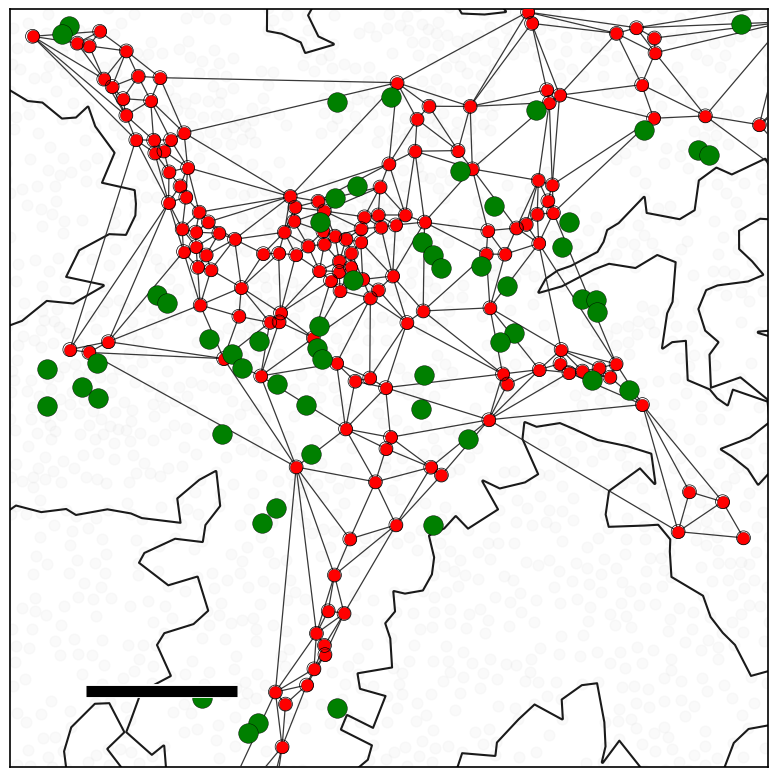

In [66]:
# ==== ZOOMED VERSION (CD8 plotted last and on top) ====
fig, ax = plt.subplots(figsize=(8, 8), facecolor="white")
ax.set_facecolor("white"); fig.patch.set_facecolor("white")

# base layers
ax.scatter(xy_um_full[:, 0], xy_um_full[:, 1],
           s=60, color="lightgray", alpha=0.1, zorder=1)

# (optional) tumor backdrop
# ax.scatter(xy_um_full[tumor_mask, 0], xy_um_full[tumor_mask, 1],
#            s=0.1, color="pink", alpha=0.35, zorder=1.5)

# CD31 short-edge network
if segments.size:
    lc = LineCollection(segments, colors=EDGE_COLOR, linewidths=EDGE_WIDTH, alpha=EDGE_ALPHA, zorder=3.2)
    ax.add_collection(lc)
    ax.relim(); ax.autoscale_view()

# plot boundary before markers so markers sit above
spc.plt.plotBoundary(boundariesA_small_um_MP, linewidth=1.5, color="k", ax=ax, alpha=1)  # zorder default (~2)

# phenotypes: draw all except CD8 first
others = [p for p in highlight_phenotypes if p != "CD8+ T cells"]
for phenotype in others:
    if "phenotype" not in neighbor_cells.obs.columns:
        continue
    sub = neighbor_cells[neighbor_cells.obs["phenotype"] == phenotype]
    if sub.n_obs == 0:
        continue
    sub_um = to_um_xy(sub.obs)
    ax.scatter(sub_um[:, 0], sub_um[:, 1],
               s=80, color=highlight_colors.get(phenotype, "#cccccc"),
               edgecolor="black", linewidth=0.2, zorder=4)  # below CD8

# CD31 positions (optional outline) - below CD8
ax.scatter(cd31_coords_um[:, 0], cd31_coords_um[:, 1],
           s=100, facecolors='none', edgecolors='black', linewidths=0.5, zorder=4)

# now CD8 last, on top
if "phenotype" in neighbor_cells.obs.columns:
    sub_cd8 = neighbor_cells[neighbor_cells.obs["phenotype"] == "CD8+ T cells"]
    if sub_cd8.n_obs > 0:
        sub_cd8_um = to_um_xy(sub_cd8.obs)
        ax.scatter(sub_cd8_um[:, 0], sub_cd8_um[:, 1],
                   s=200, color=highlight_colors["CD8+ T cells"],
                   edgecolor="black", linewidth=0.3, zorder=5)  # highest zorder

# ---- zoom limits (µm) ----
ax.set_xlim(2900, 3400)
ax.set_ylim(5700, 6200)

# ---- axes/style ----
ax.xaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.yaxis.set_major_formatter(FuncFormatter(fmt_k_um))
ax.set_aspect('equal'); ax.invert_yaxis()
ax.set_xticks([]) 
ax.set_yticks([])
# ax.grid(True, color="grey", linestyle="--", linewidth=1, zorder=0.5)

for side in ("left", "bottom", "right", "top"):
    ax.spines[side].set_visible(True)
    ax.spines[side].set_linewidth(1.2)
    ax.spines[side].set_color("black")

# scale bar bottom-left (shorter for zoom if you want)
draw_scale_bar(ax, pad_x_um=50, pad_y_um=50, bar_len_um=100, show_label=False)

plt.tight_layout()
plt.savefig("BRK6_domainA_CD31_cluster_zoom_3-4k_5.5-6.5k_CD8_only.tif",
            dpi=600, bbox_inches="tight", facecolor="white", format="tiff")
plt.show()
plt.close(fig)

# Other domains will performed from different code (needs further clean up)

# Figure 5a and supplementary figure 6a

